In [1]:
import numpy as np
import os
import pandas as pd
import math
import pickle
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from matplotlib import gridspec
import seaborn as sns
sns.set_style("ticks")
hfont = {'fontname':'Myriad Pro'}

import sys
sys.path.append(os.path.join(os.getcwd(), "functions"))
import helper_functions as hfn
import AIC_functions as aicfn
import plotting_functions as plotfn

In [2]:
 # load models from lmfit package
from lmfit import Model
from lmfit.models import PowerLawModel
from lmfit.models import LognormalModel
from lmfit.models import ExponentialModel
from lmfit.models import LinearModel
from lmfit.models import QuadraticModel
from lmfit.models import StepModel


In [3]:
def growth(x, i_max, ks):
    # x = starter number
    # we fit y = input number
    return i_max * x / (ks + x)

In [4]:
def hill(x, i_max, ks,n):
    return i_max / (1 + (ks/x)**n)

# create lmfit models

In [5]:
# create lmfit models for fits
model_pl = PowerLawModel()
model_exp = Model(aicfn.expfunc)
model_ln = LognormalModel()
model_lm = LinearModel()
model_quad = QuadraticModel()
gmodel = Model(growth)
hmodel = Model(hill)
model_sm = StepModel(form='logistic')

# define paths and save paths 

In [6]:
path = os.getcwd()

alldatapath = os.path.join(path, 'data')
datapath = os.path.join(alldatapath, 'clean')

In [7]:
savepath = os.path.join(path, 'model_selection')
hfn.dir_check(savepath)

savepath_dataset = os.path.join(savepath, 'dataset')
hfn.dir_check(savepath_dataset)

savepath_lin_nls = os.path.join(savepath, 'lin_scale_nls_fit')
hfn.dir_check(savepath_lin_nls)

savepath_res_distr = os.path.join(savepath, 'residuals_distribution')
hfn.dir_check(savepath_res_distr)

savepath_log_lm = os.path.join(savepath, 'log_scale_fits')
hfn.dir_check(savepath_log_lm)

# import data

In [8]:
areas, areas_with_pre, df_raw, df_all, df_v1, df_pm = hfn.import_main_dataset(datapath)

In [9]:
areas_with_pre

['PTLp',
 'TEa',
 'VIS',
 'AUD',
 'RSP',
 'Thal',
 'Thal_noLGd',
 'Dist_ctx',
 'VISp',
 'VISpm',
 'VISl',
 'VISam',
 'VISal',
 'RSPagl',
 'RSPd',
 'RSPv',
 'AM',
 'LD',
 'LP',
 'LGd',
 'ORB',
 'ACA',
 'MOs',
 'CLA',
 'input']

In [10]:
df_raw.head()

,name,pre,input,target area,strain,group,starter,ratio_target_all,area,keep,...,RSPd,RSPv,AM,LD,LP,LGd,ORB,ACA,MOs,CLA
0,BRAC2704_6c,2860,2729,V1,RETRO,10,2,1.0,PM/V1,1,...,100,172,23,82,7,268,59,69,42,2
1,ERAD25_1a,2548,2451,V1,GLT,1,3,1.0,V1,1,...,85,219,11,158,100,168,14,11,15,5
2,ERAD25_1b,9059,8418,PM,GLT,2,8,1.0,PM,1,...,670,1003,177,411,1041,193,312,118,33,45
3,BRAC2704_6d,8465,7486,V1,RETRO,10,13,1.0,V1,1,...,602,901,163,205,61,249,137,377,153,42
4,ERAE26_6e,7223,6860,PM,RBP,9,16,1.0,V1,1,...,552,497,26,197,576,191,246,93,50,32


In [11]:
# log10 transformed datasets
df_log_all = hfn.make_log_df_full(df_all, areas)
df_log_v1 = hfn.make_log_df_full(df_v1, areas)
df_log_pm = hfn.make_log_df_full(df_pm, areas)

In [12]:
hfn.save_dflist_to_csv([df_all, df_v1, df_pm, df_log_all, df_log_v1, df_log_pm], ['df_all', 'df_v1', 'df_pm', 'df_log_all', 'df_log_v1', 'df_log_pm'], savepath_dataset)

# **1. Plots and model selection on natural scale, input vs starters**

# 1.1. All targets 

In [13]:
ymax_lin = math.ceil(df_all['input'].max() / 5000.0) * 5000.0

## 1.1.1. Linear fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 7.1595e+09
    reduced chi-square = 2.7536e+08
    Akaike info crit   = 546.065980
    Bayesian info crit = 548.730389
    R-squared          = 0.62630082
[[Variables]]
    slope:      40.3978104 +/- 6.11984933 (15.15%) (init = 40.39781)
    intercept:  15501.8511 +/- 4034.60821 (26.03%) (init = 15501.85)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


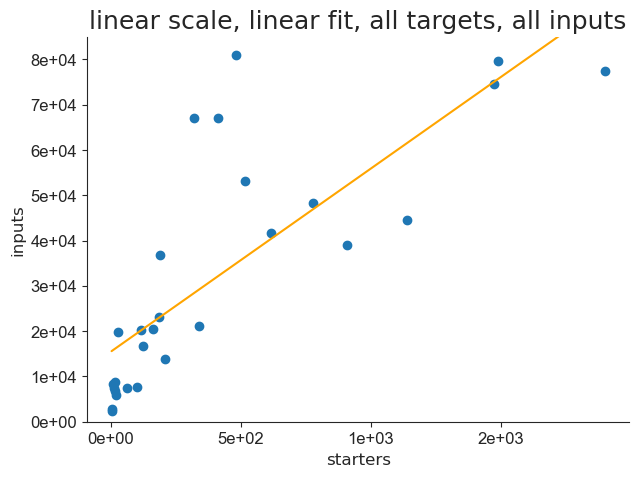

In [14]:
df_fit_lm_all, result_lm_all, pars_lm_all, AICc_lm_all, rsquare_lm_all = aicfn.fit_and_saveprms(df_all['starter'].values, df_all['input'].values, 'input', model_lm, 'linear scale, linear fit, all targets, all inputs', 'linscale_lmfit_alltargets_allinputs', savepath_lin_nls, 0, ymax_lin, 0, 0)

In [15]:
df_fit_lm_all

,area,AIC,AICc,Chi2,BIC,R2,slope,intercept
0,input,546.06598,564.31598,7.159484e+09,548.730389,0.626301,40.39781,15501.851084


## 1.1.2. Power-law fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 81
    # data points      = 28
    # variables        = 2
    chi-square         = 5.0975e+09
    reduced chi-square = 1.9606e+08
    Akaike info crit   = 536.554601
    Bayesian info crit = 539.219010
    R-squared          = 0.73393010
[[Variables]]
    amplitude:  2797.00871 +/- 1354.26592 (48.42%) (init = 1)
    exponent:   0.44414362 +/- 0.07254178 (16.33%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.990


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


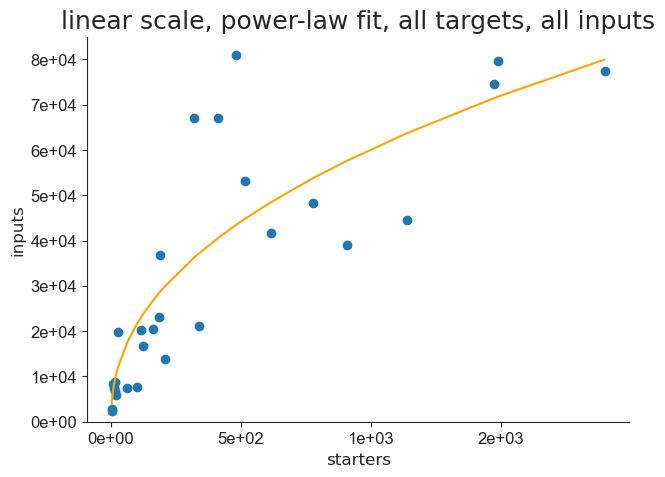

In [16]:
df_fit_pl_all, result_pl_all, pars_pl_all, AICc_pl_all, rsquare_pl_all = aicfn.fit_and_saveprms(df_all['starter'].values, df_all['input'].values, 'input', model_pl, 'linear scale, power-law fit, all targets, all inputs', 'linscale_plfit_alltargets_allinputs', savepath_lin_nls, 0, ymax_lin, 1, 0)

In [17]:
df_fit_pl_all

,area,AIC,AICc,Chi2,BIC,R2,amplitude,exponent
0,input,536.554601,554.804601,5.097478e+09,539.21901,0.734145,2797.008708,0.444144


## 1.1.3. Exponential fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 28
    # variables        = 2
    chi-square         = 9.1440e+09
    reduced chi-square = 3.5169e+08
    Akaike info crit   = 552.916320
    Bayesian info crit = 555.580729
    R-squared          = 0.52271865
[[Variables]]
    a:  21832.2401 +/- 3742.00139 (17.14%) (init = 1000)
    b: -1293.51532 +/- 230.267053 (17.80%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.833


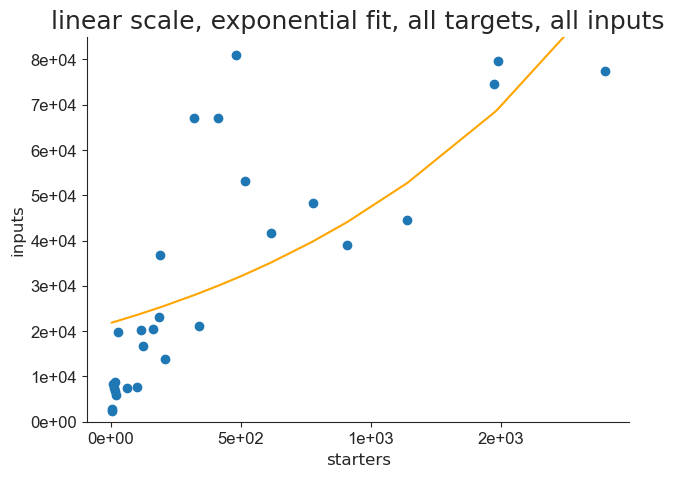

In [18]:
df_fit_exp_all, result_exp_all, pars_exp_all, AICc_exp_all, rsquare_exp_all = aicfn.fit_and_saveprms(df_all['starter'].values, df_all['input'].values, 'input', model_exp, 'linear scale, exponential fit, all targets, all inputs', 'linscale_expfit_alltargets_allinputs', savepath_lin_nls, 0, ymax_lin, 1, 0)

In [19]:
df_fit_exp_all

,area,AIC,AICc,Chi2,BIC,R2,a,b
0,input,552.91632,571.16632,9.143955e+09,555.580729,0.523672,21832.240103,-1293.515321


## 1.1.4. Lognormal fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 498
    # data points      = 28
    # variables        = 3
    chi-square         = 4.9225e+09
    reduced chi-square = 1.9690e+08
    Akaike info crit   = 537.576622
    Bayesian info crit = 541.573236
    R-squared          = 0.74306292
[[Variables]]
    amplitude:  3.3502e+11 +/- 2.8886e+12 (862.23%) (init = 6000)
    center:     16.9370445 +/- 11.4176560 (67.41%) (init = 18)
    sigma:      2.74543931 +/- 1.45525463 (53.01%) (init = 5)
    height:     92989.1372 +/- 63874.1483 (68.69%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       305760.414 +/- 1579635.75 (516.63%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.999
    C(center, sigma)     = 0.999
    C(amplitude, sigma)  = 0.995


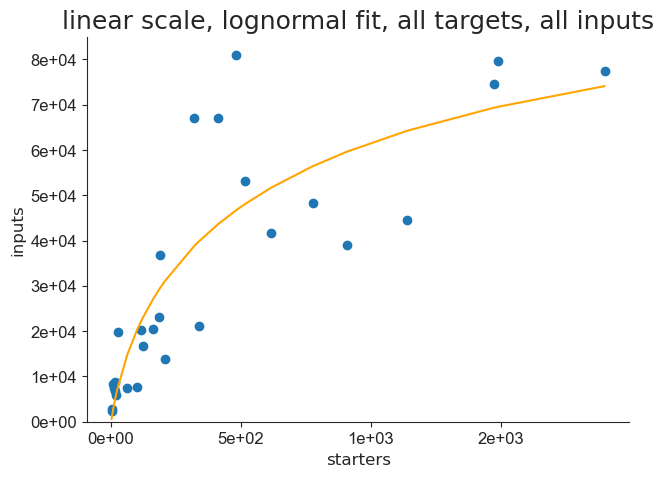

In [20]:
df_fit_ln_all, result_ln_all, pars_ln_all, AICc_ln_all, rsquare_ln_all = aicfn.fit_and_saveprms(df_all['starter'].values, df_all['input'].values, 'input', model_ln, 'linear scale, lognormal fit, all targets, all inputs', 'linscale_lognormfit_alltargets_allinputs', savepath_lin_nls, 0, ymax_lin, 0, 0)

In [21]:
df_fit_ln_all

,area,AIC,AICc,Chi2,BIC,R2,amplitude,center,sigma,height,fwhm
0,input,537.576622,569.924448,4.922507e+09,541.573236,0.743361,3.350158e+11,16.937045,2.745439,92989.137242,305760.41401


## 1.1.5 Quadratic fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 5.6948e+09
    reduced chi-square = 2.2779e+08
    Akaike info crit   = 541.657133
    Bayesian info crit = 545.653747
    R-squared          = 0.70275290
[[Variables]]
    a: -0.02755101 +/- 0.01086505 (39.44%) (init = -0.02755101)
    b:  84.0936417 +/- 18.1086109 (21.53%) (init = 84.09364)
    c:  9351.98537 +/- 4398.60289 (47.03%) (init = 9351.985)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551


findfont: Font family 'Myriad Pro' not found.


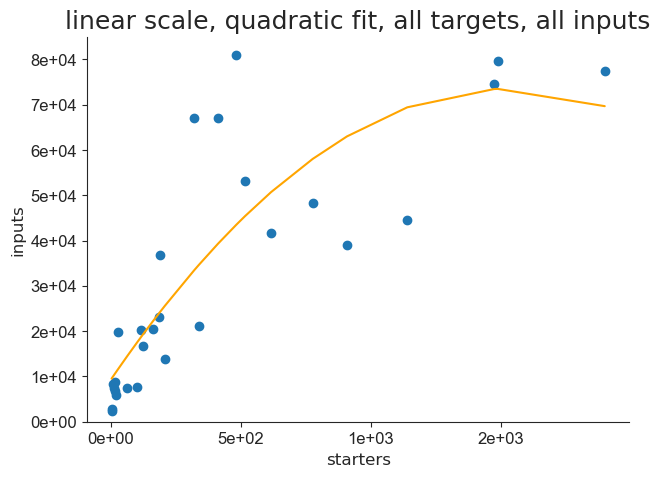

In [22]:
df_fit_quad_all,result_quad_all, pars_quad_all, AICc_quad_all, rsquare_quad_all = aicfn.fit_and_saveprms(df_all['starter'].values, df_all['input'].values, 'input', model_quad, 'linear scale, quadratic fit, all targets, all inputs', 'linscale_quadfit_alltargets_allinputs', savepath_lin_nls, 0, ymax_lin, 0, 0)

In [23]:
df_fit_quad_all

,area,AIC,AICc,Chi2,BIC,R2,a,b,c
0,input,541.657133,574.004959,5.694783e+09,545.653747,0.702753,-0.027551,84.093642,9351.985373


## 1.1.6 Growth model fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 28
    # variables        = 2
    chi-square         = 4.8773e+09
    reduced chi-square = 1.8759e+08
    Akaike info crit   = 535.318005
    Bayesian info crit = 537.982414
    R-squared          = 0.74542515
[[Variables]]
    i_max:  84618.7758 +/- 12601.7204 (14.89%) (init = 80873)
    ks:     357.812893 +/- 140.331053 (39.22%) (init = 616)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.897


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


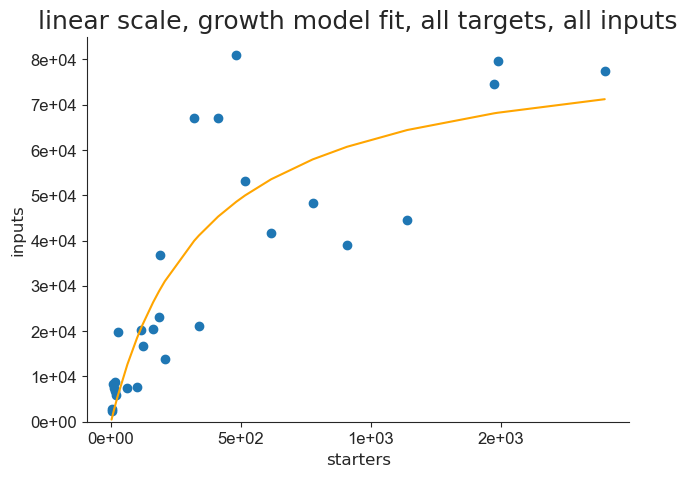

In [24]:
df_fit_growth_all,result_growth_all, pars_growth_all, AICc_growth_all, rsquare_growth_all = aicfn.fit_and_saveprms(df_all['starter'].values, df_all['input'].values, 'input', gmodel, 'linear scale, growth model fit, all targets, all inputs', 'linscale_growthfit_alltargets_allinputs', savepath_lin_nls, 0, ymax_lin, 0, 0)

In [25]:
df_fit_growth_all

,area,AIC,AICc,Chi2,BIC,R2,i_max,ks
0,input,535.318005,553.568005,4.877251e+09,537.982414,0.746376,84618.775819,357.812893


## 1.1.7 Hill model fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 93
    # data points      = 28
    # variables        = 3
    chi-square         = 4.8745e+09
    reduced chi-square = 1.9498e+08
    Akaike info crit   = 537.301996
    Bayesian info crit = 541.298609
    R-squared          = 0.74557067
[[Variables]]
    i_max:  90318.0679 +/- 35222.1769 (39.00%) (init = 80873)
    ks:     420.973767 +/- 424.949837 (100.94%) (init = 616)
    n:      0.91328095 +/- 0.40377360 (44.21%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.984
    C(i_max, n)  = -0.897
    C(ks, n)     = -0.893


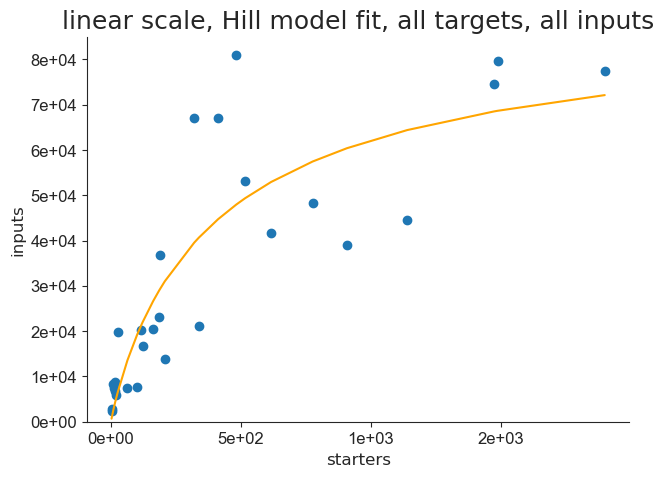

In [26]:
df_fit_hill_all,result_hill_all, pars_hill_all, AICc_hill_all, rsquare_hill_all = aicfn.fit_and_saveprms(df_all['starter'].values, df_all['input'].values, 'input', hmodel, 'linear scale, Hill model fit, all targets, all inputs', 'linscale_hillfit_alltargets_allinputs', savepath_lin_nls, 0, ymax_lin, 0, 0)

In [27]:
df_fit_hill_all

,area,AIC,AICc,Chi2,BIC,R2,i_max,ks,n
0,input,537.301996,569.649822,4.874463e+09,541.298609,0.746116,90318.067914,420.973767,0.913281


# AICc model comparison for linear scale data for all targets

In [28]:
df_AICc_all = pd.concat([df_fit_pl_all['area'], df_fit_lm_all['AICc'], df_fit_pl_all['AICc'], df_fit_exp_all['AICc'], df_fit_ln_all['AICc'], df_fit_quad_all['AICc'],df_fit_growth_all['AICc'],df_fit_hill_all['AICc']], keys = ['area','linear', 'power-law', 'exponential', 'lognormal', 'quadratic', 'growth', 'hill'], axis = 1)

In [29]:
df_AICc_all

,area,linear,power-law,exponential,lognormal,quadratic,growth,hill
0,input,564.31598,554.804601,571.16632,569.924448,574.004959,553.568005,569.649822


In [30]:
df_AICc_all.to_csv(os.path.join(savepath_lin_nls, 'AICc_models_linscale_allinputs_alltargets.csv'))
df_AICc_all.to_hdf(os.path.join(savepath_lin_nls, 'AICc_models_linscale_allinputs_alltargets.h5'), key = 'df_AICc_all_linscale', mode ='w')

# **2. Plots and model selection on Log10 scale, input vs starters**

In [31]:
ymax_log = math.ceil(df_log_all['input'].max())

## 2.1 Linear fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family ['Myriad Pro'] not found. Falling back to DejaVu Sans.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 0.89676172
    reduced chi-square = 0.03449084
    Akaike info crit   = -92.3527490
    Bayesian info crit = -89.6883400
    R-squared          = 0.83934595
[[Variables]]
    slope:      0.49643226 +/- 0.04259402 (8.58%) (init = 0.4964323)
    intercept:  3.26893659 +/- 0.09673557 (2.96%) (init = 3.268937)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


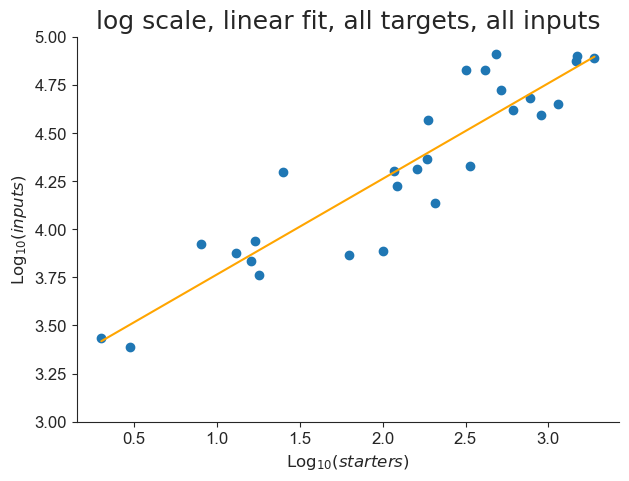

In [32]:
df_fit_lm_log_all, result_lm_log_all, pars_lm_log_all, AICc_lm_log_all, rsquare_lm_log_all = aicfn.fit_and_saveprms(df_log_all['starter'].values, df_log_all['input'].values, 'input', model_lm, 'log scale, linear fit, all targets, all inputs', 'logscale_lmfit_alltargets_allinputs', savepath_log_lm, 3e0, ymax_log, 0, 1)

## 2.2. Quadratic fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 0.89319805
    reduced chi-square = 0.03572792
    Akaike info crit   = -90.4642408
    Bayesian info crit = -86.4676273
    R-squared          = 0.83998438
[[Variables]]
    a:  0.01668407 +/- 0.05282717 (316.63%) (init = 0.01668407)
    b:  0.43362811 +/- 0.20352864 (46.94%) (init = 0.4336281)
    c:  3.31579726 +/- 0.17806977 (5.37%) (init = 3.315797)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833


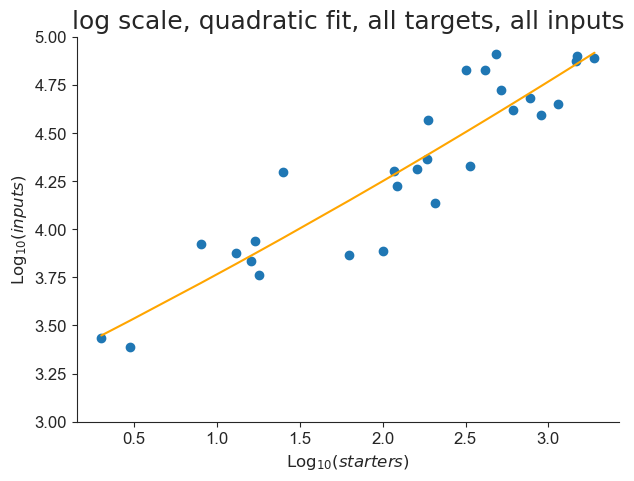

In [33]:
df_fit_quad_log_all, result_quad_log_all, pars_quad_log_all, AICc_quad_log_all, rsquare_quad_log_all =  aicfn.fit_and_saveprms(df_log_all['starter'].values, df_log_all['input'].values, 'input', model_quad, 'log scale, quadratic fit, all targets, all inputs', 'logscale_quadfit_alltargets_allinputs', savepath_log_lm, 3e0, ymax_log, 0, 1)

## 2.3. Logistic fit

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(step, form='logistic')
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 95
    # data points      = 28
    # variables        = 3
    chi-square         = 0.89323326
    reduced chi-square = 0.03572933
    Akaike info crit   = -90.4631368
    Bayesian info crit = -86.4665233
    R-squared          = 0.83997807
[[Variables]]
    amplitude:  14.5460756 +/- 46.3526577 (318.66%) (init = 1.51846)
    center:     7.31146249 +/- 34.0419833 (465.60%) (init = 1.789892)
    sigma:      6.00098073 +/- 7.86964821 (131.14%) (init = 0.4253891)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 1.000
    C(center, sigma)     = 0.998
    C(amplitude, sigma)  = 0.998


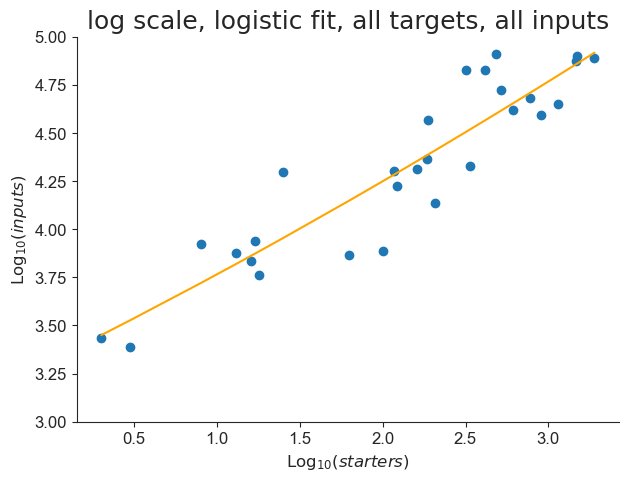

In [34]:
df_fit_sm_log_all, result_sm_log_all, pars_sm_log_all, AICc_sm_log_all, rsquare_sm_log_all =  aicfn.fit_and_saveprms(df_log_all['starter'].values, df_log_all['input'].values, 'input', model_sm, 'log scale, logistic fit, all targets, all inputs', 'logscale_smfit_alltargets_allinputs', savepath_log_lm, 3e0, ymax_log, 0, 1)

# AICc model comparison for log scale data for all targets

In [35]:
df_AICc_log_all = pd.concat([df_fit_lm_log_all['area'], df_fit_lm_log_all['AICc'], df_fit_quad_log_all['AICc'], df_fit_sm_log_all['AICc']], keys = ['area', 'linear', 'quadratic', 'logistic'], axis = 1)

In [36]:
df_AICc_log_all.to_csv(os.path.join(savepath_log_lm,'AICc_models_logscale_allinputs_alltargets.csv'))
df_AICc_log_all.to_hdf(os.path.join(savepath_log_lm, 'AICc_models_logscale_allinputs_alltargets.h5'), key = 'df_AICc_alltargets_logscale', mode ='w')

In [37]:
df_AICc_log_all

,area,linear,quadratic,logistic
0,input,-74.102749,-58.116415,-58.115311


# **3. Analysis of residuals distribution (choice of natural scale or log-transformed), data = inputs vs starters, for total number of inputs and per area**

method see:
- https://doi.org/10.1890/11-0538.1 On the use of log‐transformation vs. nonlinear regression for analyzing biological power laws, Xiao et al. 2011 Ecology
-  https://doi.org/10.1371/journal.pone.0077007 The Allometry of Coarse Root Biomass: Log-Transformed Linear Regression or Nonlinear Regression?
Lai et al. 2013 PLoS One
- https://doi.org/10.1016/j.jtbi.2012.09.035 Evaluating model fit to determine if logarithmic transformations are necessary in allometry: A comment on the exchange between Packard (2009) and Kerkhoff and Enquist (2009) Ballantyne F 2013 J Theoretical Biology

In [38]:
savepath_res_plots = os.path.join(savepath_res_distr, 'res_vs_fitted')
hfn.dir_check(savepath_res_plots)

    
savepath_res_qq = os.path.join(savepath_res_distr, 'qqplots')
hfn.dir_check(savepath_res_qq)


[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 28
    # variables        = 2
    chi-square         = 8678453.13
    reduced chi-square = 333786.659
    Akaike info crit   = 358.036182
    Bayesian info crit = 360.700591
    R-squared          = 0.70053863
[[Variables]]
    amplitude:  32.0011920 +/- 23.9737208 (74.92%) (init = 21.10958)
    exponent:   0.60604768 +/- 0.10894975 (17.98%) (init = 0.6589329)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.994
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 28
    # variables        = 2
    chi-square         = 5279526.45
    reduced chi-square = 203058.710
    Akaike info crit   = 344.119989
    Bayesian info crit = 346.784398
    R-squared          = 0.72855345
[[Variables]]
    amplitude:  39.1127230 +/- 25.4660090 (65.11%) (

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 28
    # variables        = 2
    chi-square         = 41286794.6
    reduced chi-square = 1587953.64
    Akaike info crit   = 401.707765
    Bayesian info crit = 404.372174
    R-squared          = 0.51534111
[[Variables]]
    amplitude:  260.780054 +/- 168.438718 (64.59%) (init = 95.02028)
    exponent:   0.37647244 +/- 0.09846889 (26.16%) (init = 0.5163552)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.988
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 28
    # variables        = 2
    chi-square         = 57018817.6
    reduced chi-square = 2193031.45
    Akaike info crit   = 410.747247
    Bayesian info crit = 413.411656
    R-squared          = 0.47958115
[[Variables]]
    amplitude:  421.575666 +/- 247.295381 (58.66%) (

/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize = (7,5))
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont:

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

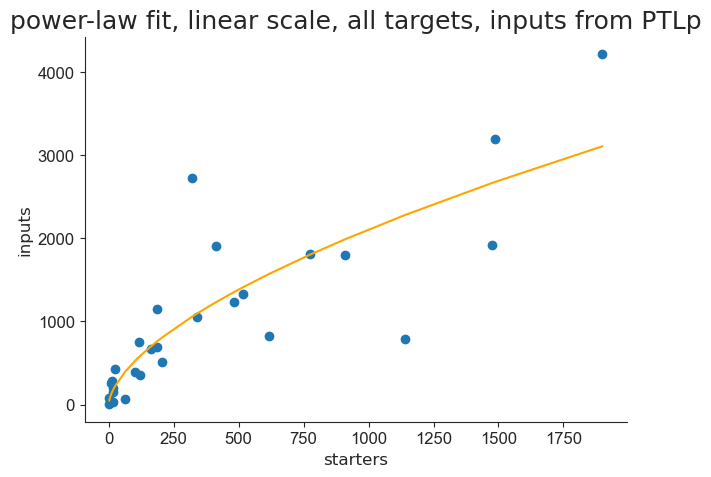

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


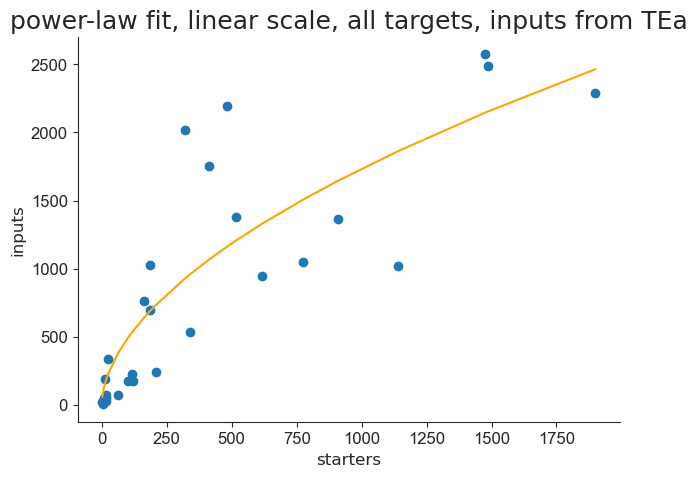

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


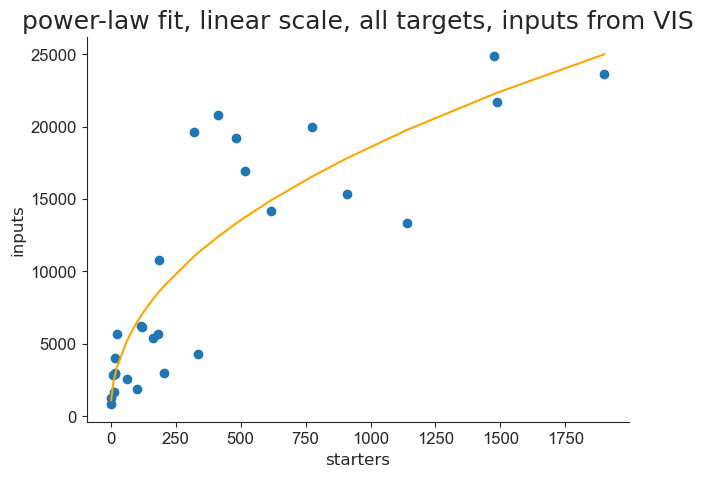

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


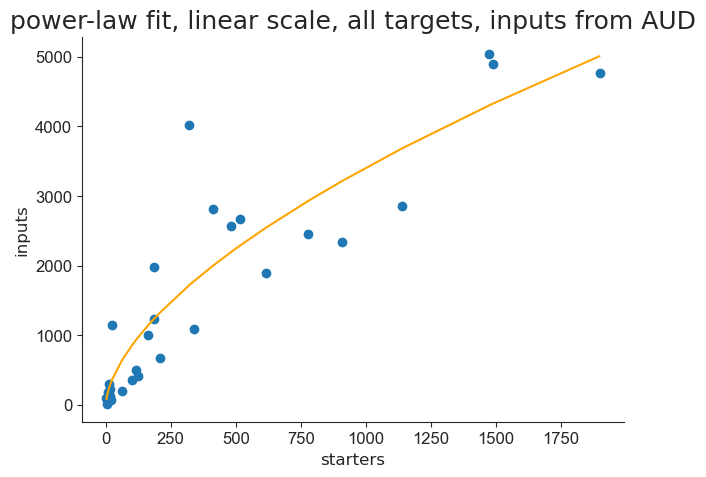

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


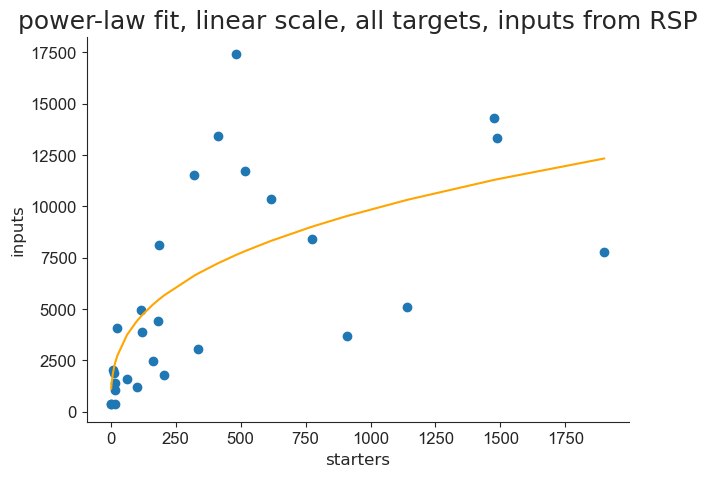

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


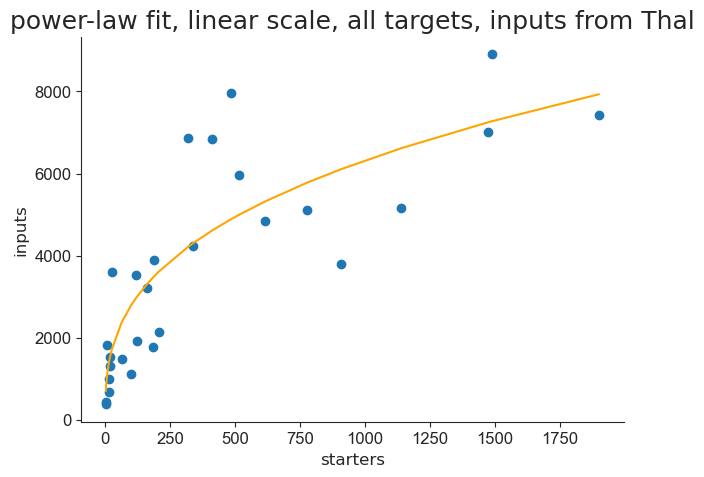

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


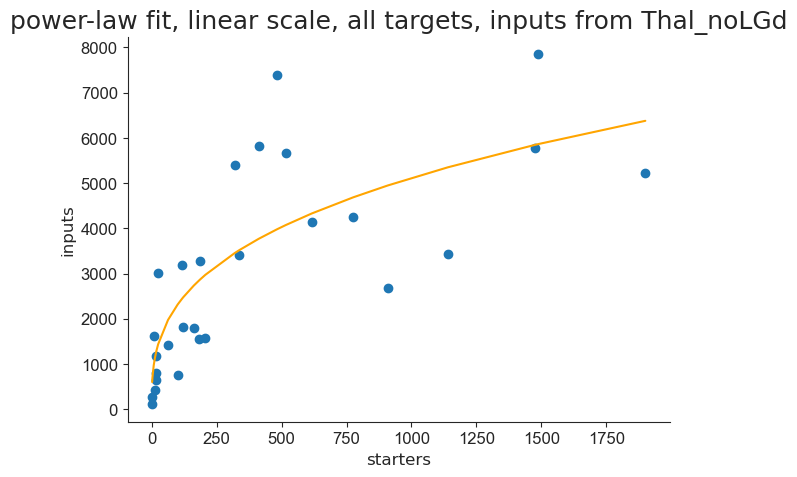

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


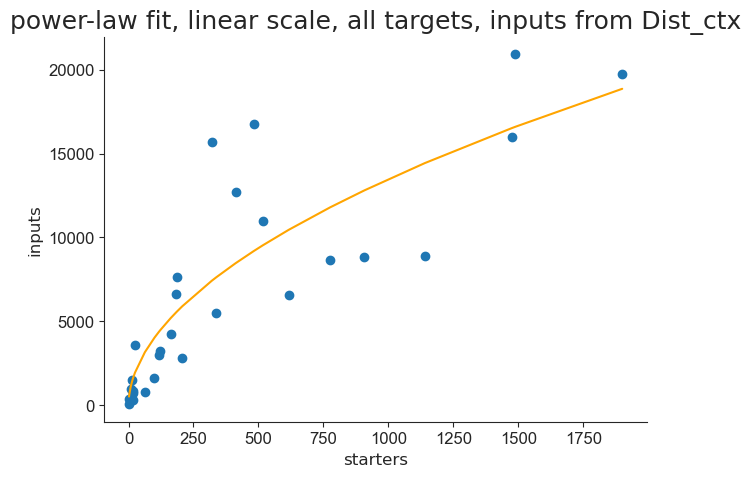

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


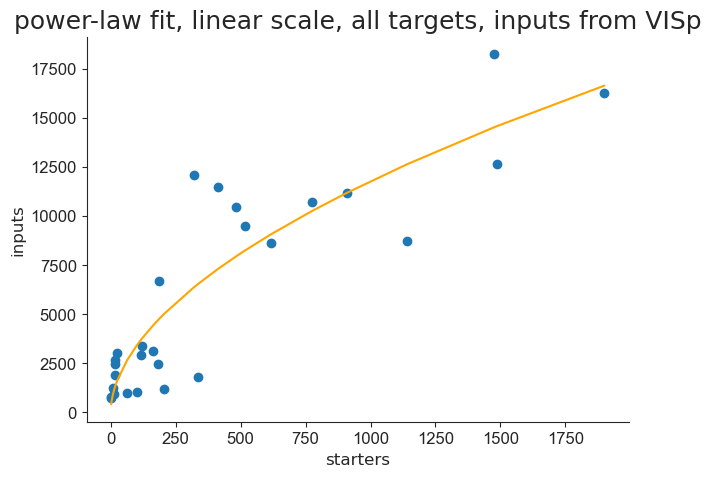

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


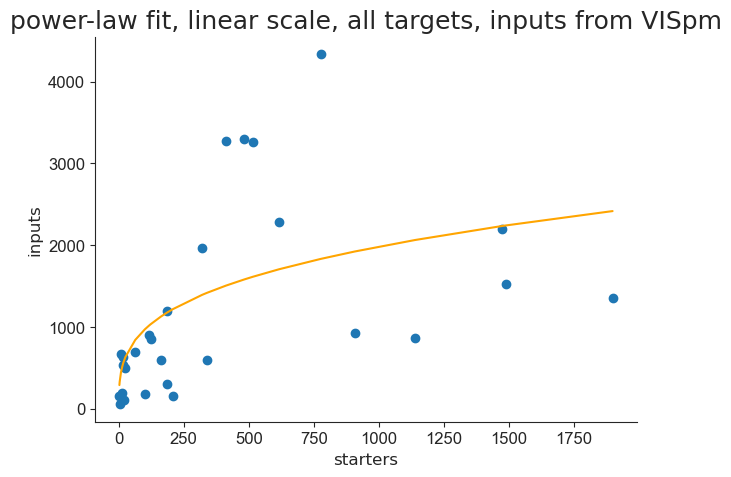

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


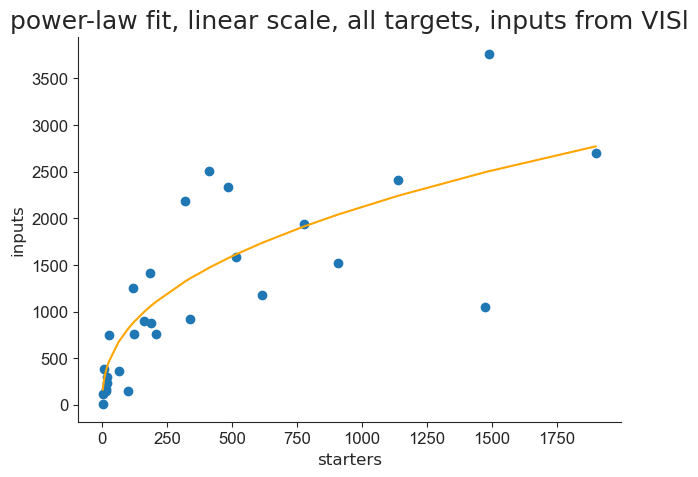

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


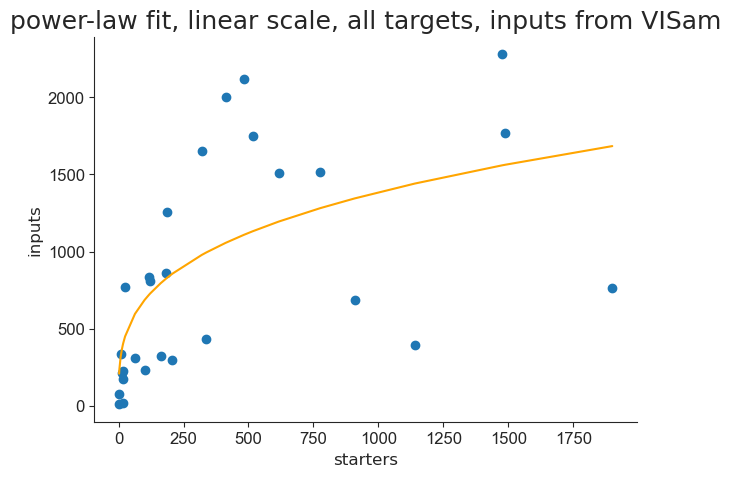

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


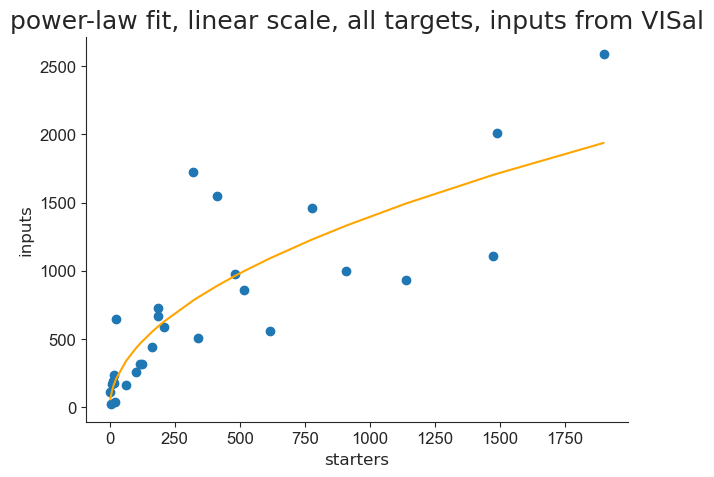

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


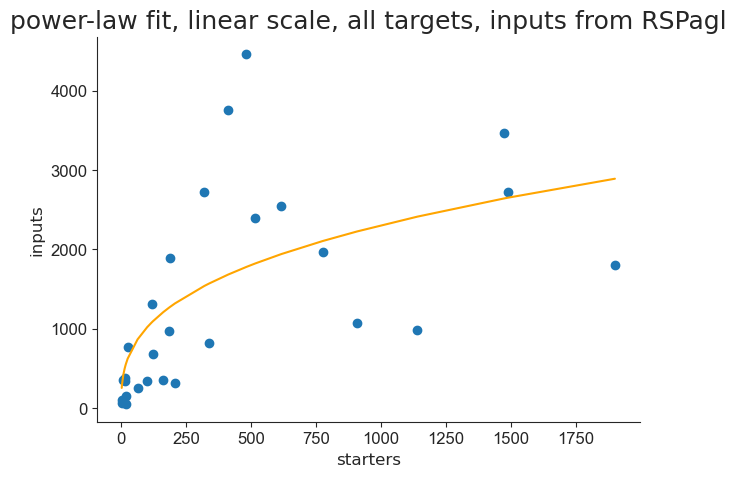

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


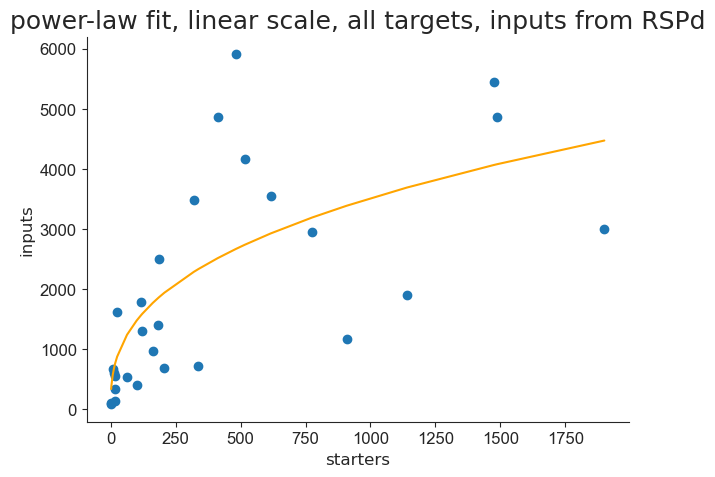

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


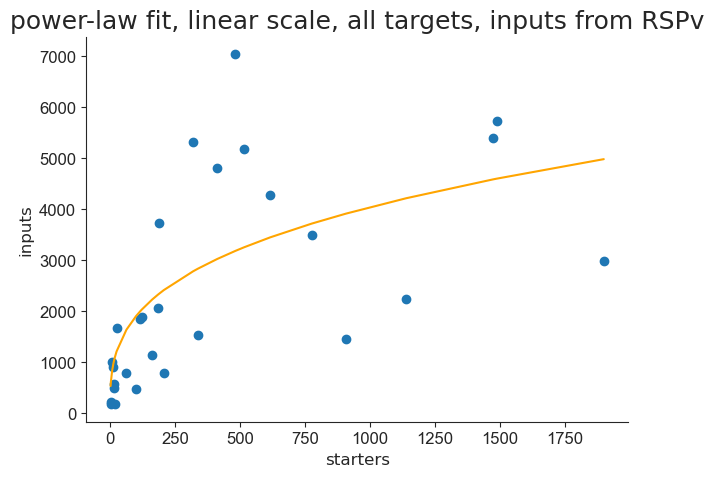

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


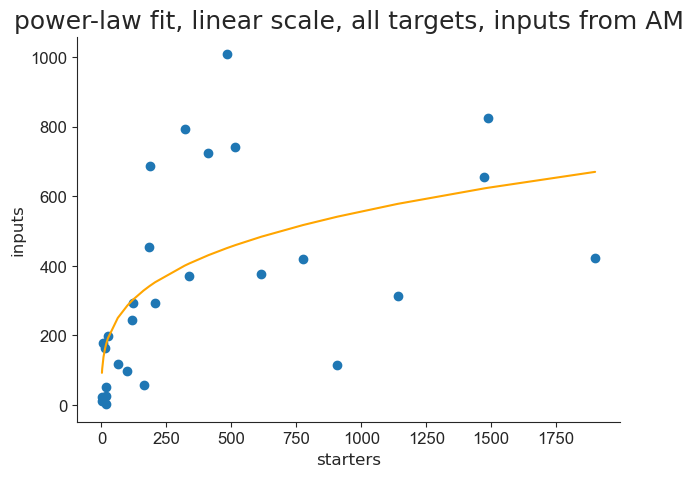

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


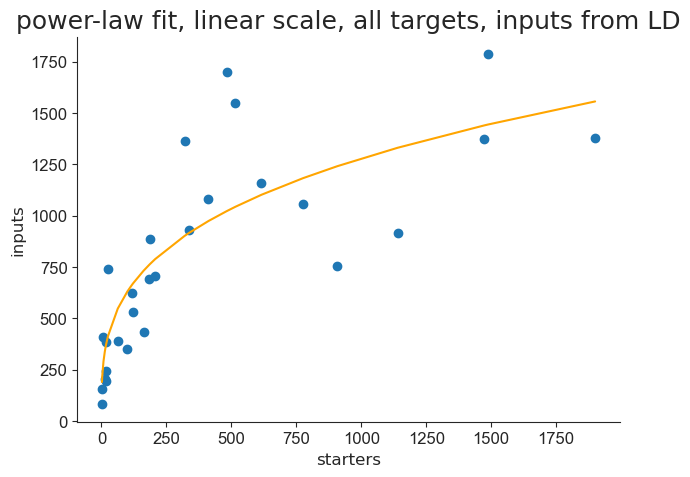

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


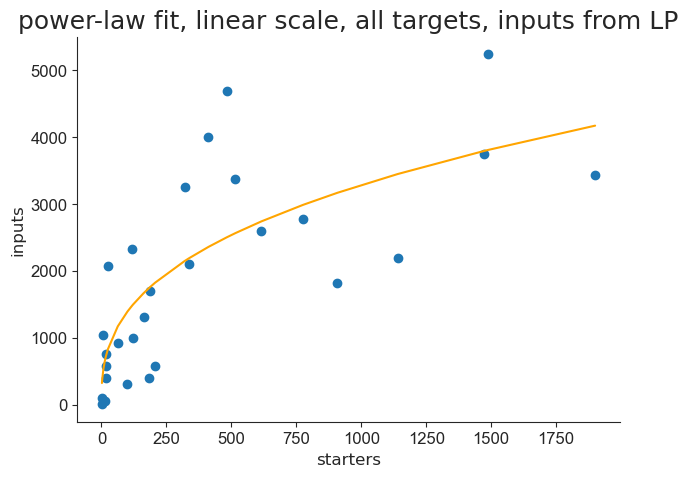

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


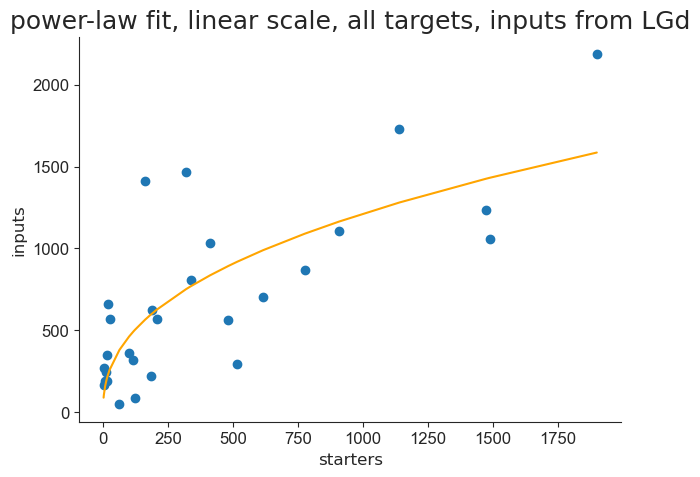

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


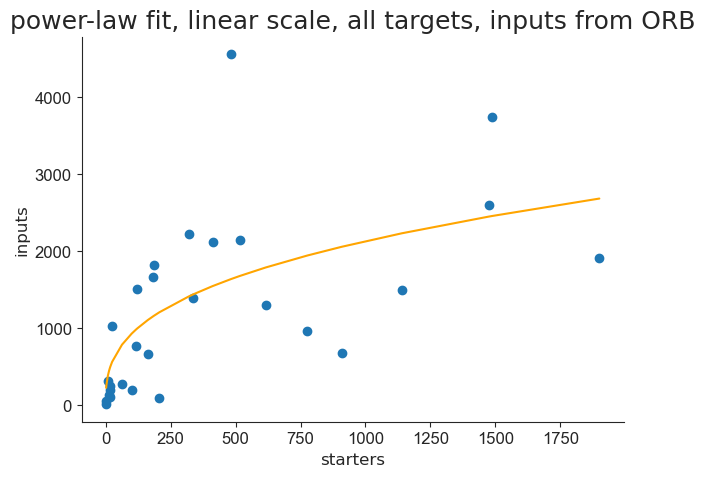

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


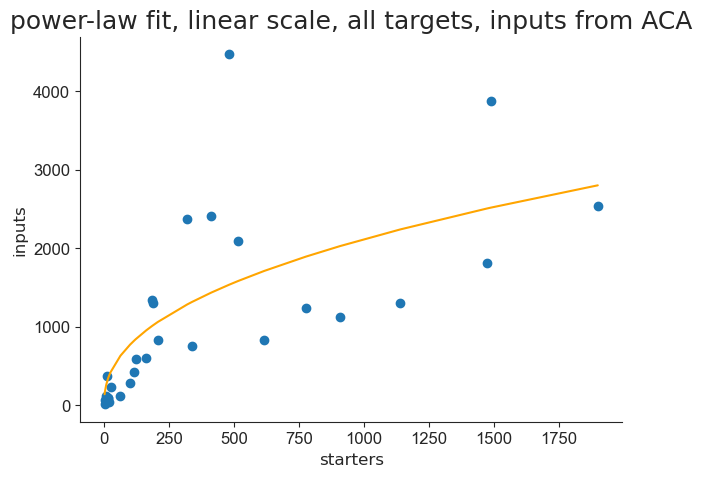

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


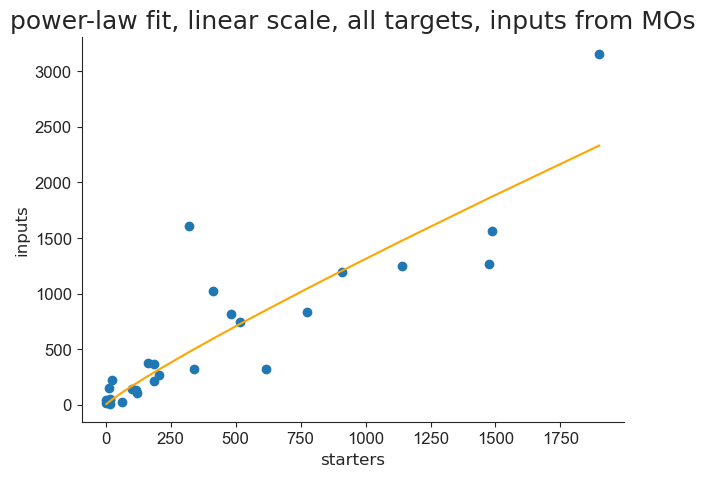

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


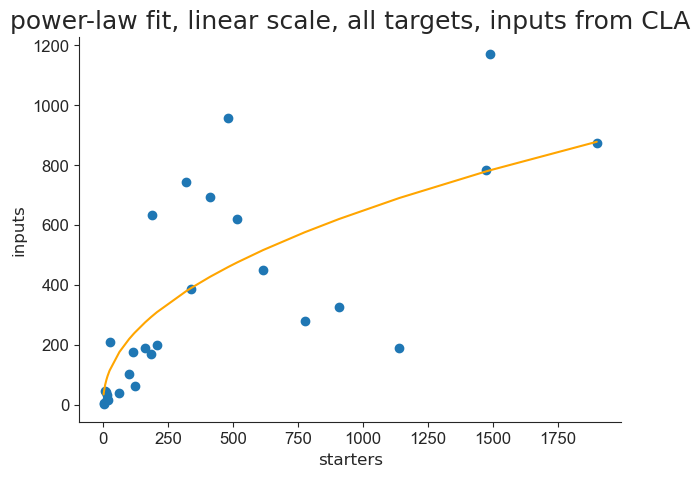

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


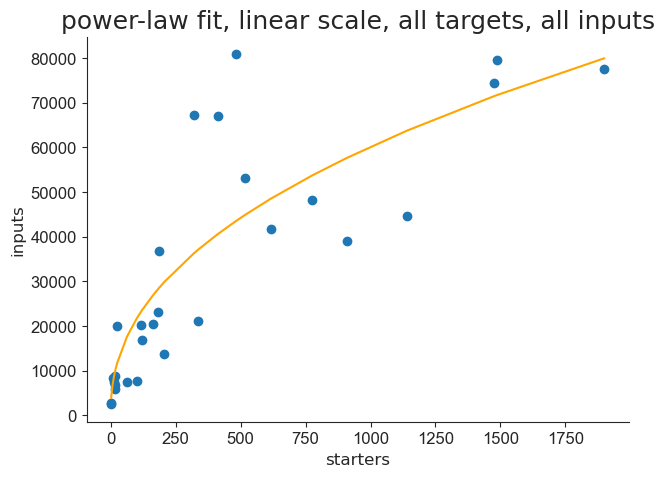

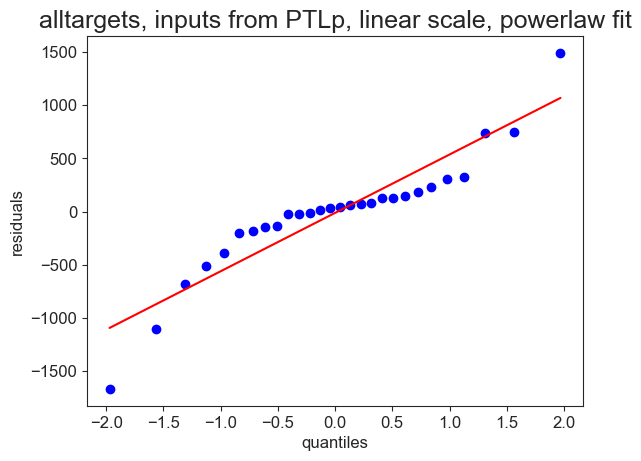

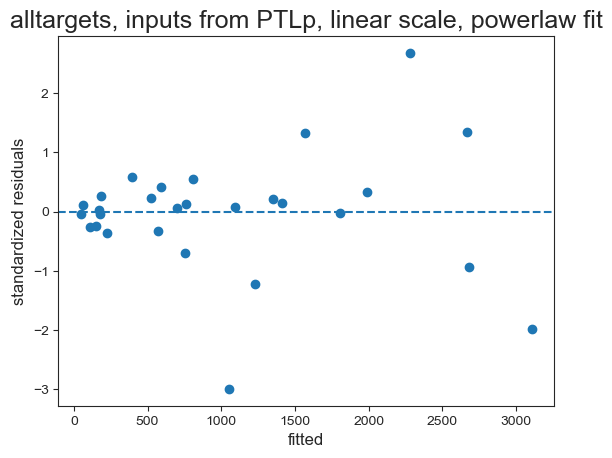

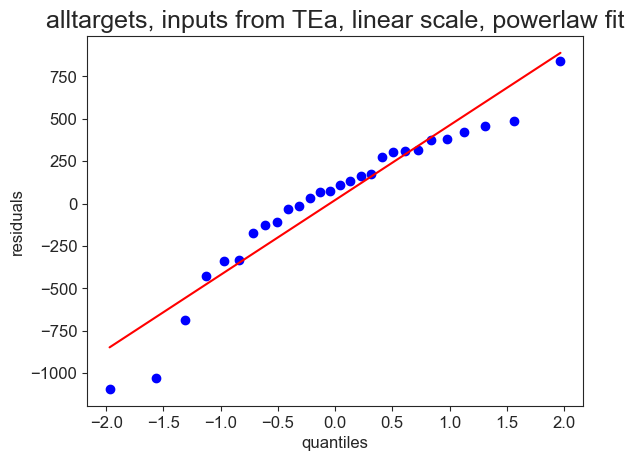

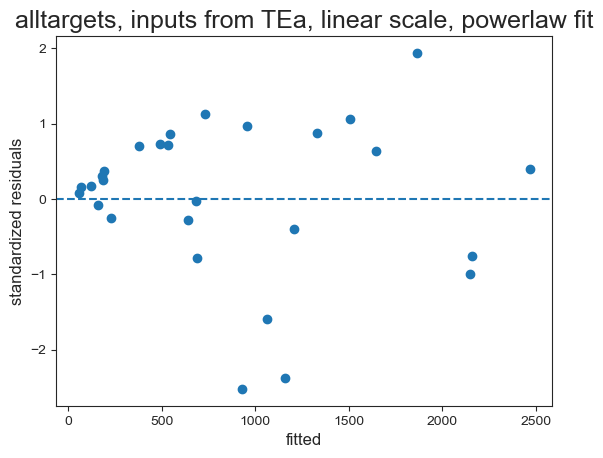

...

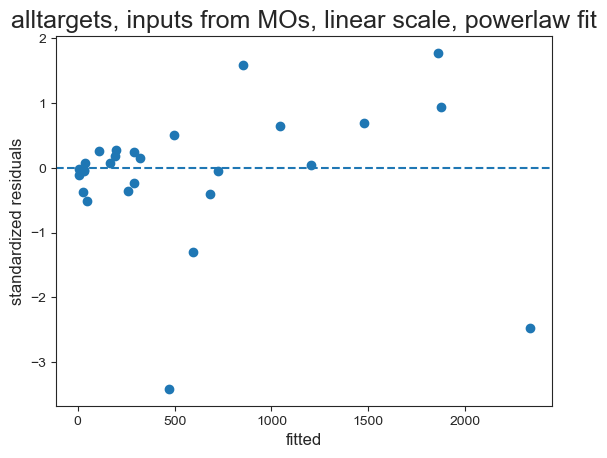

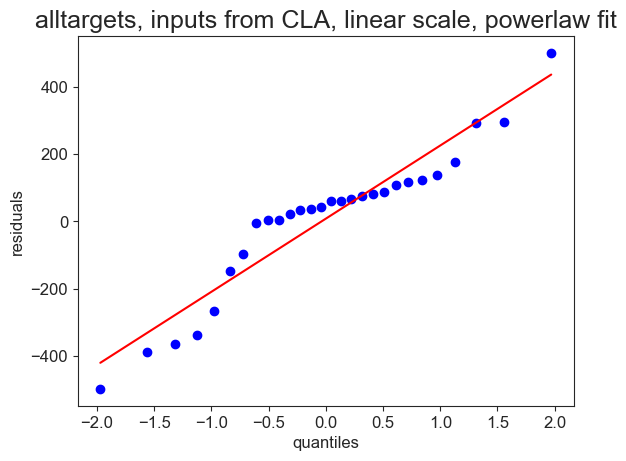

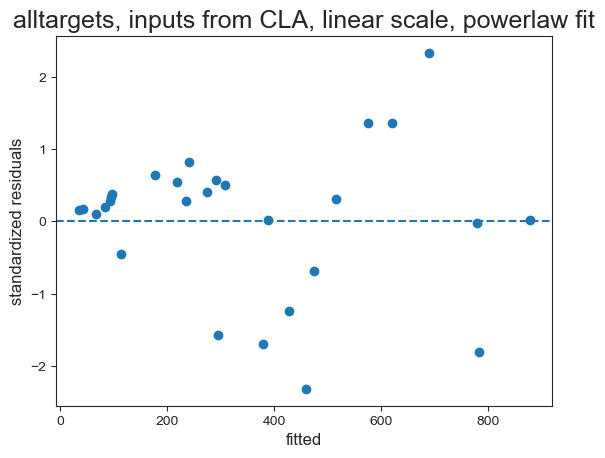

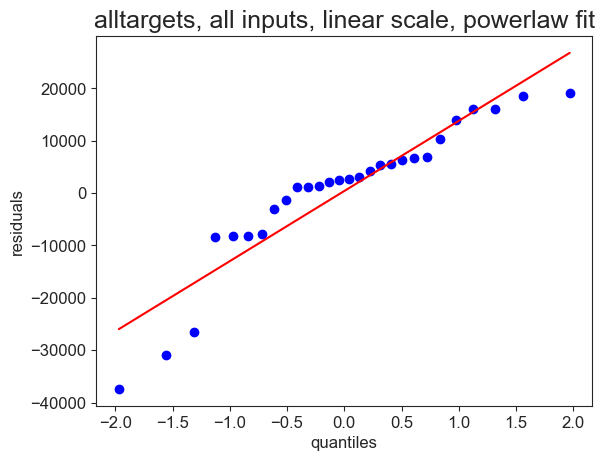

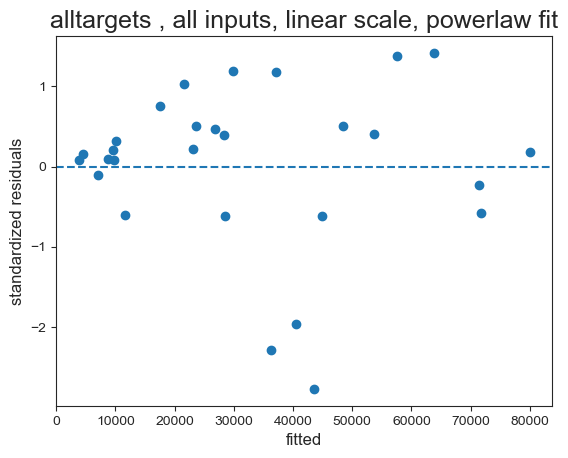

In [39]:
df_results_all_pl = aicfn.analyze_residuals(df_all, savepath_res_qq, savepath_res_plots, areas_with_pre, 1, 0)

/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize = (7,5))


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

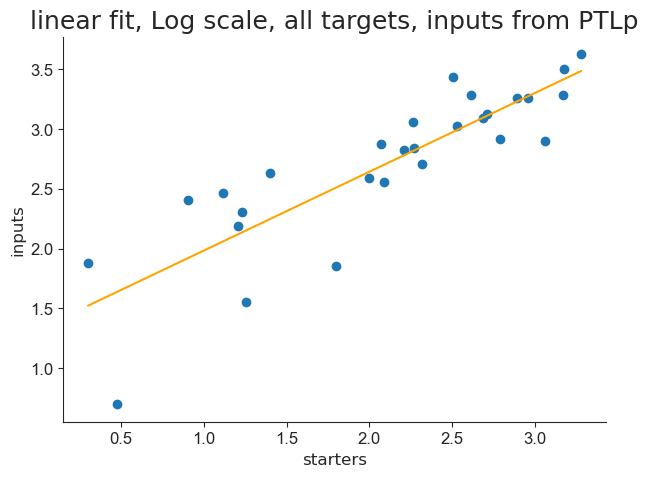

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


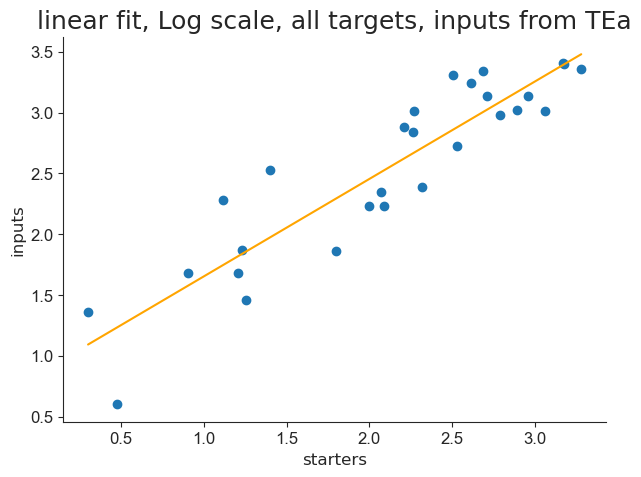

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


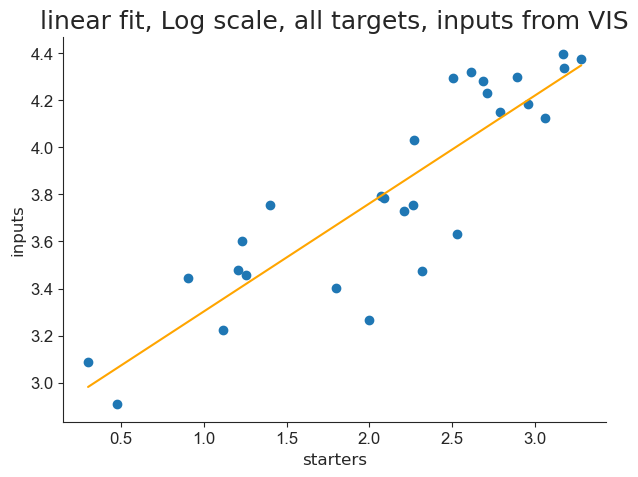

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


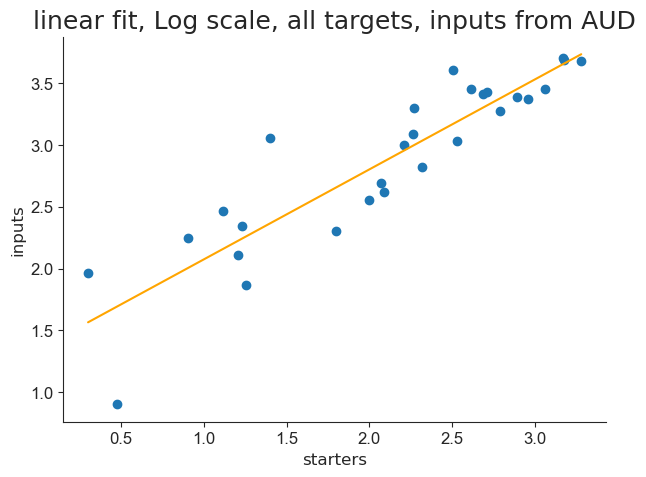

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


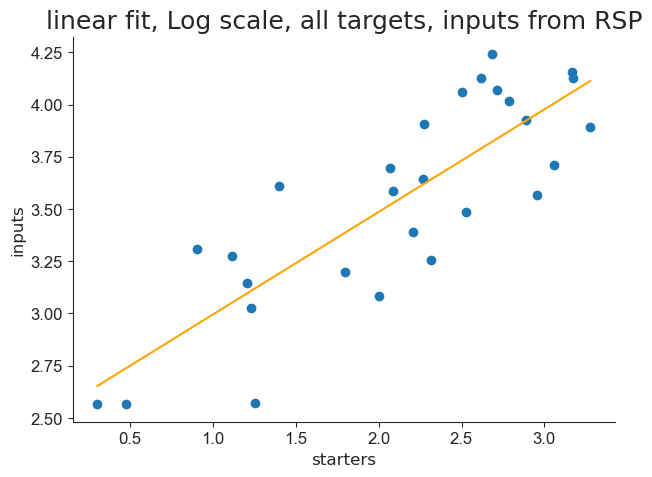

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


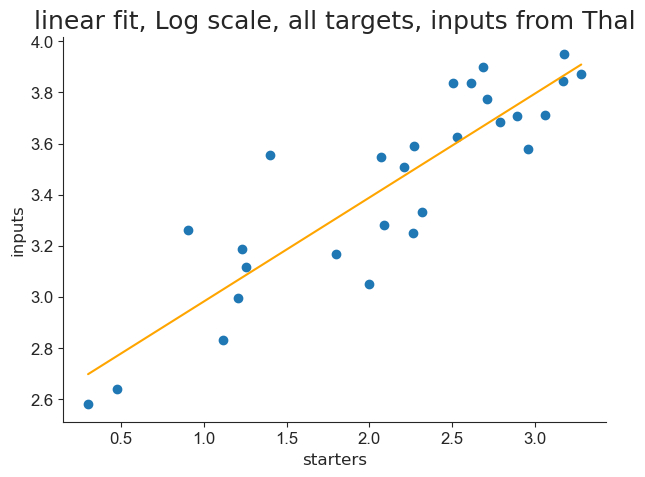

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


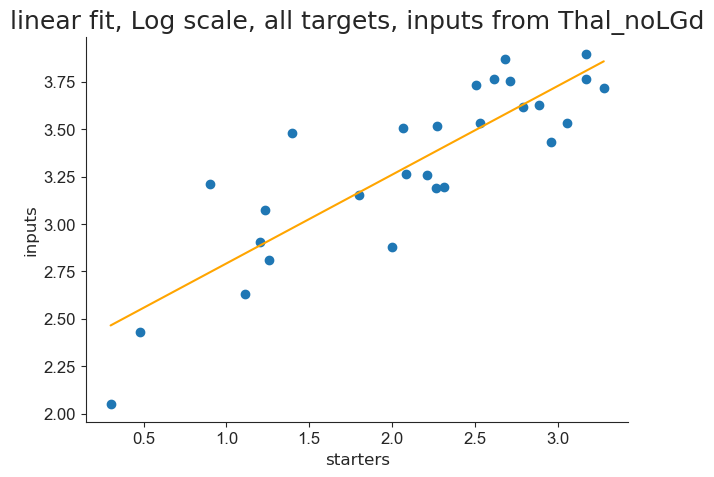

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


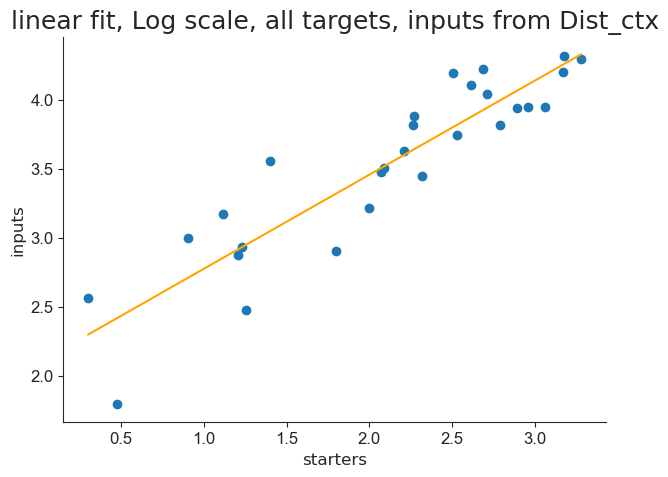

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


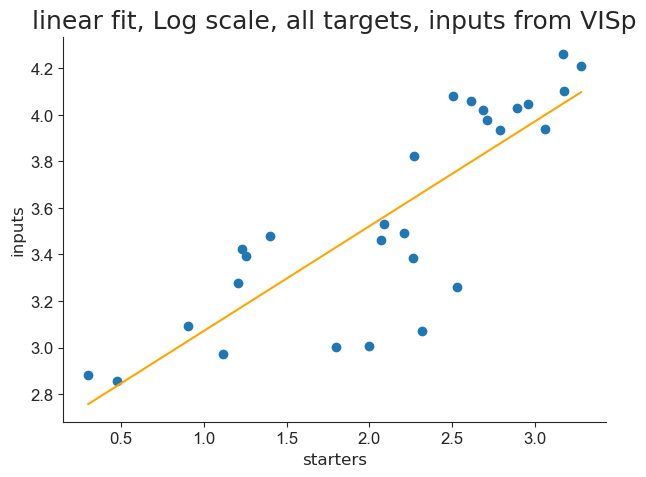

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


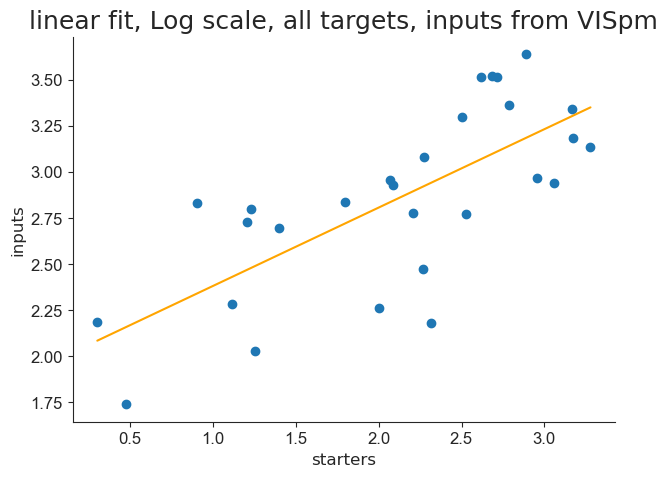

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


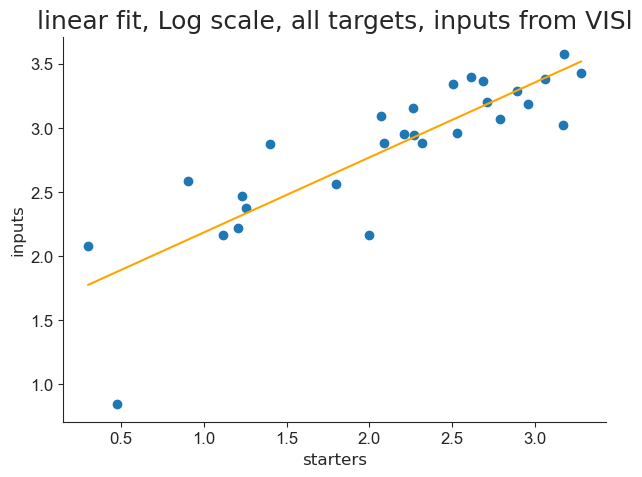

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


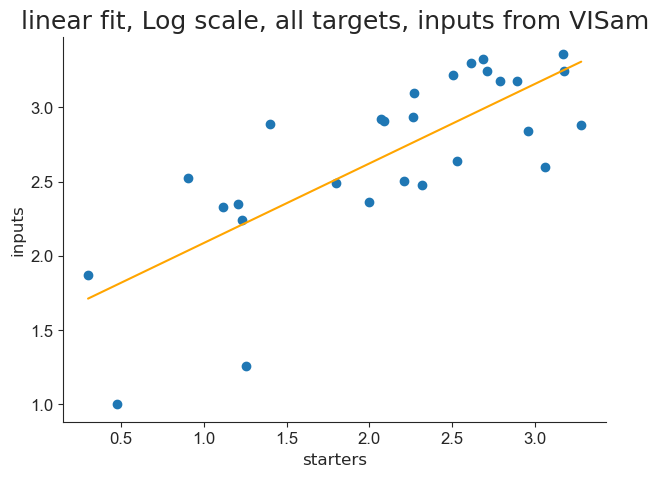

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


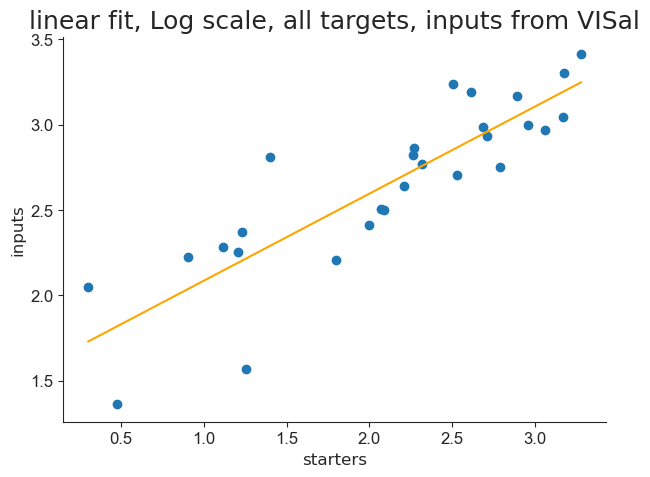

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


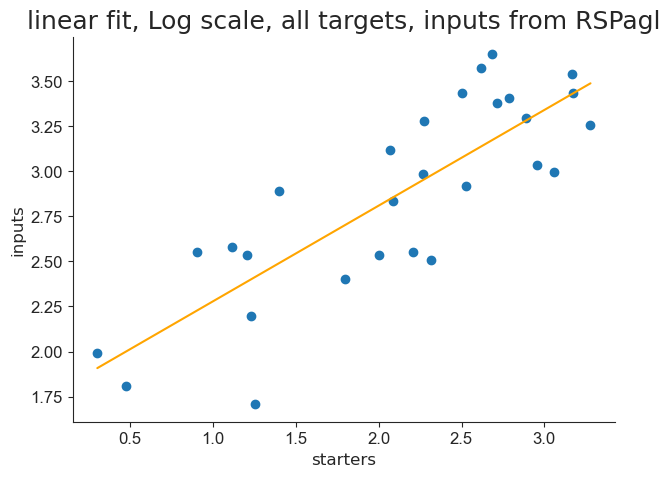

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


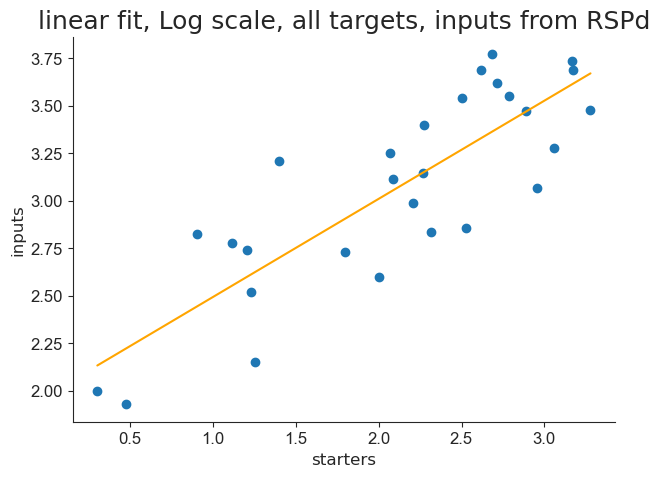

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


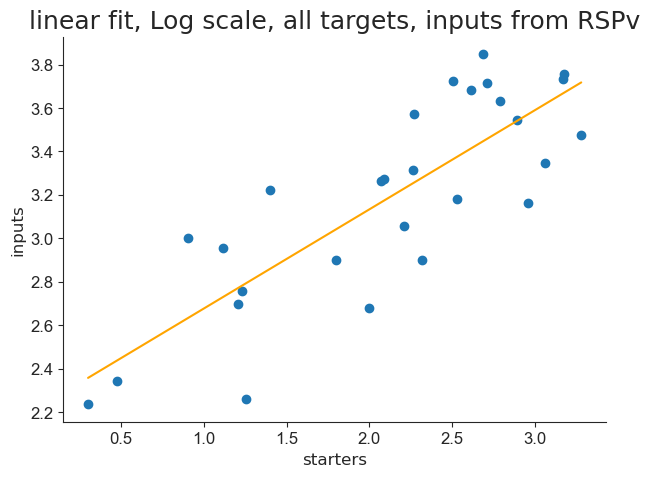

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


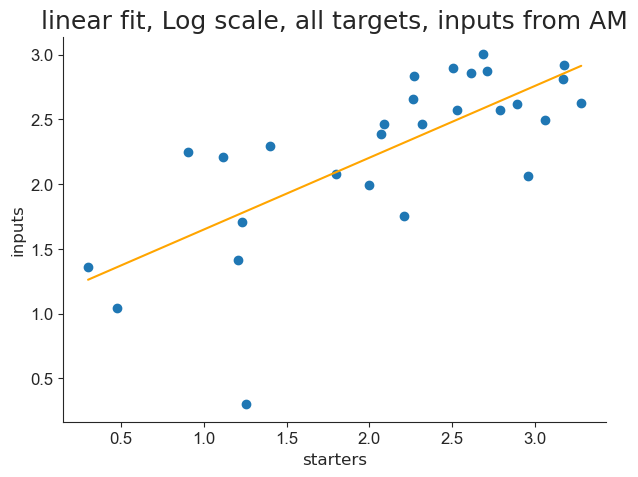

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


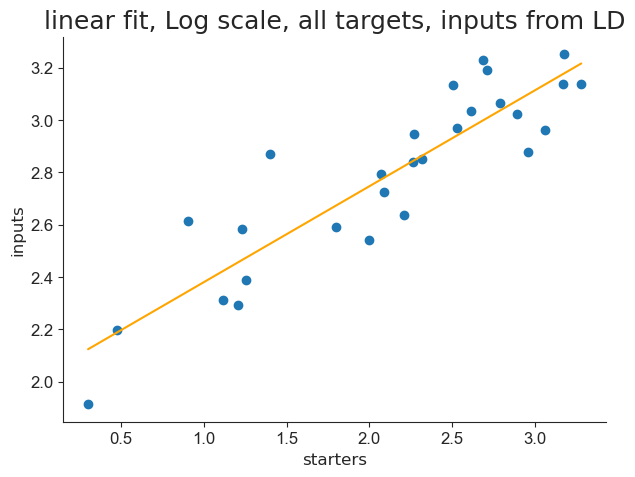

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


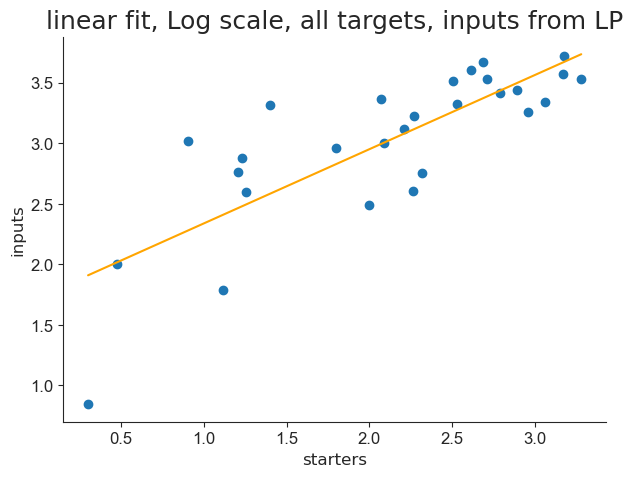

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


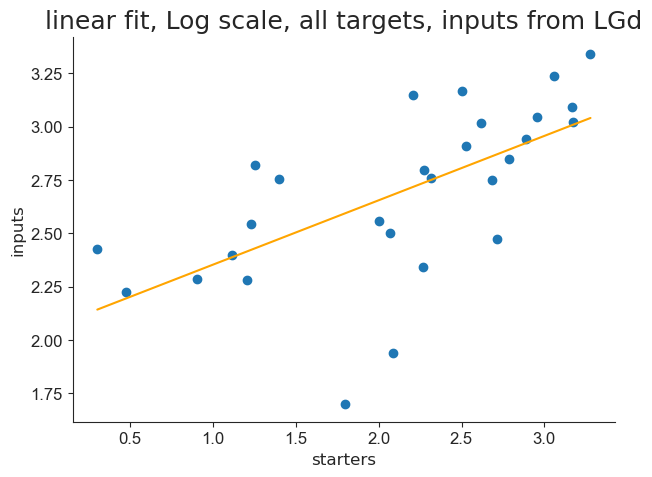

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


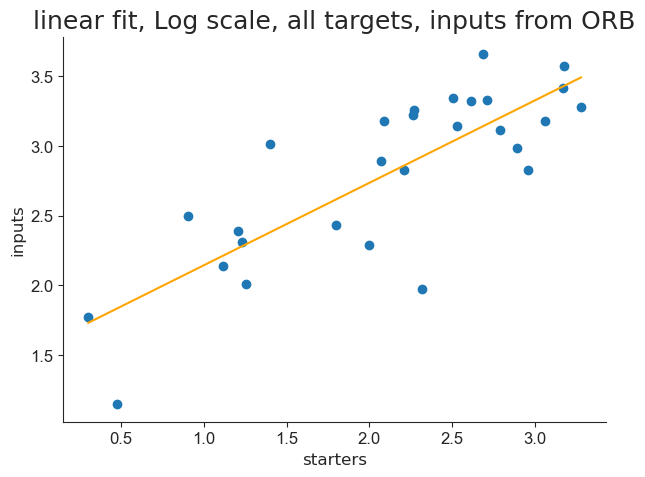

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


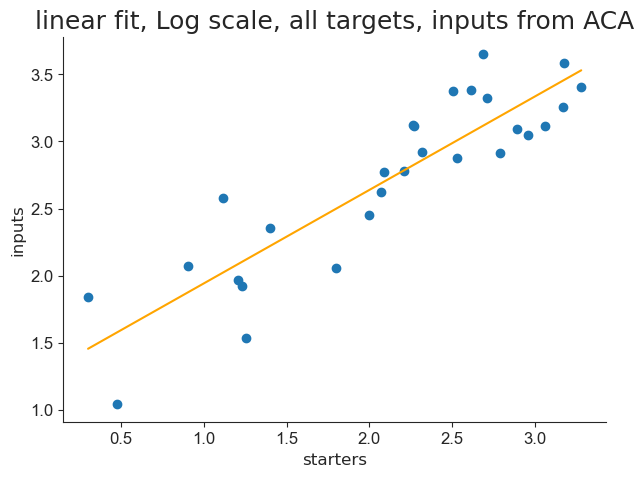

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


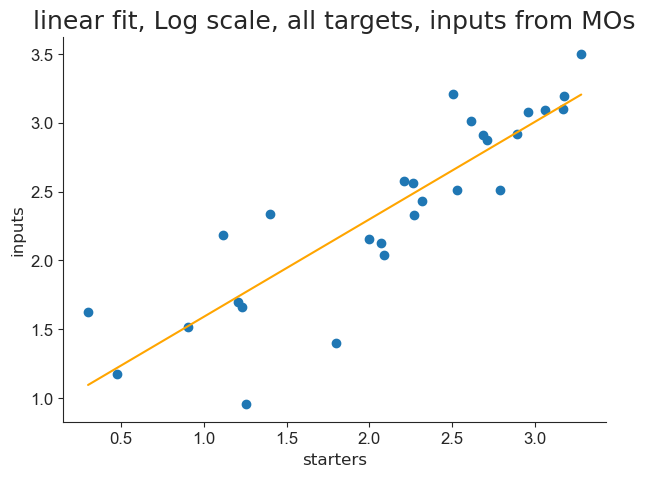

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


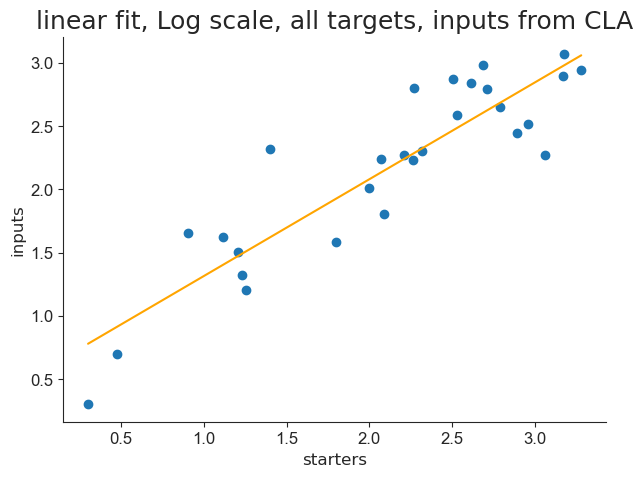

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


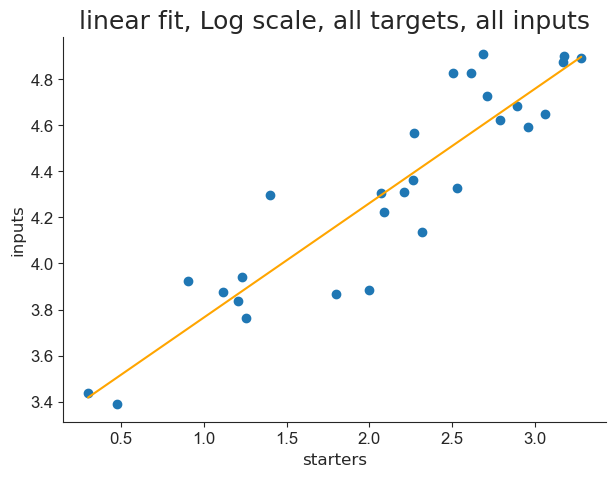

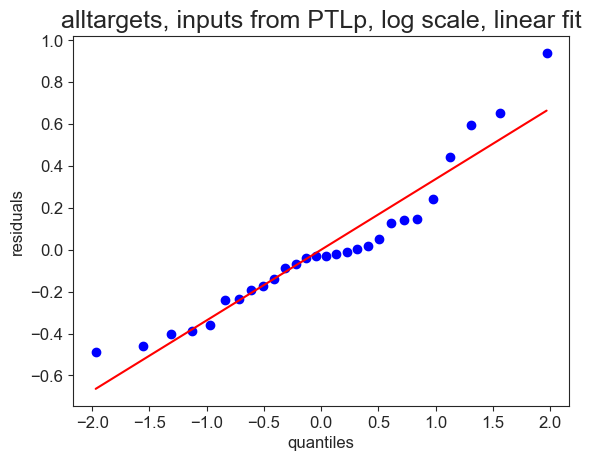

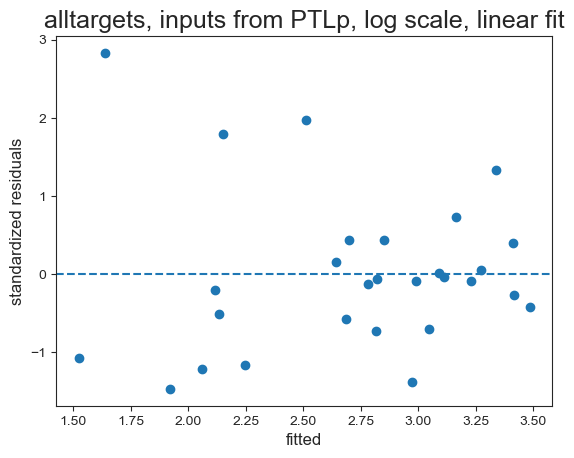

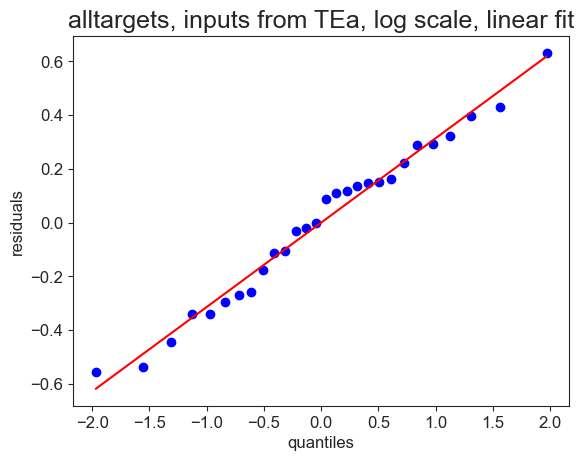

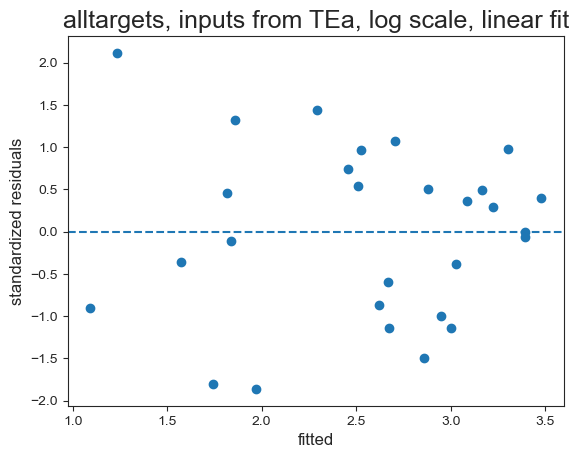

...

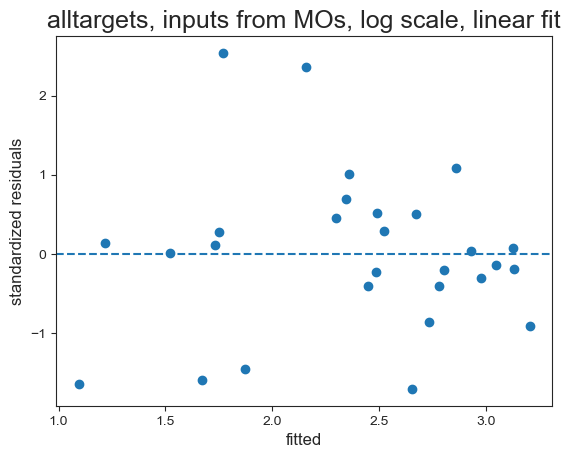

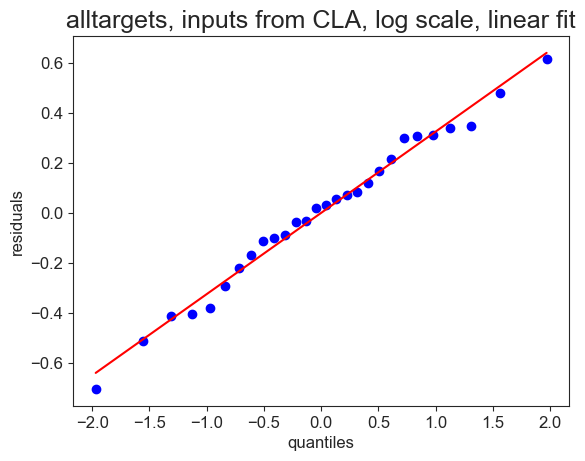

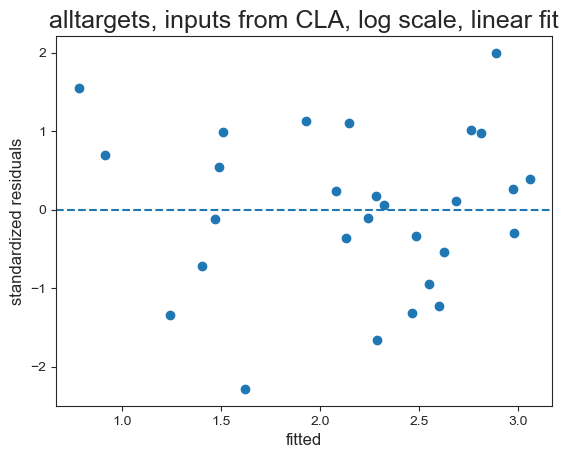

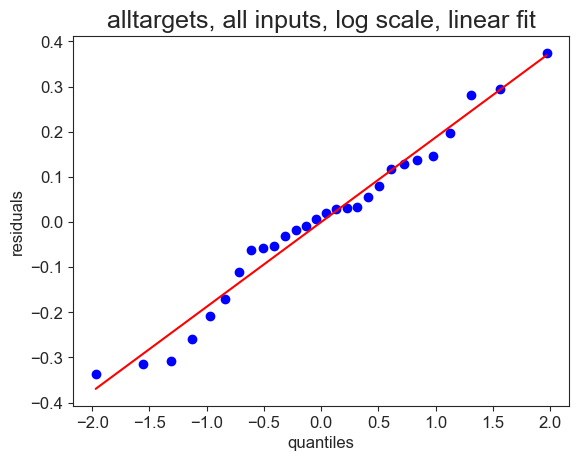

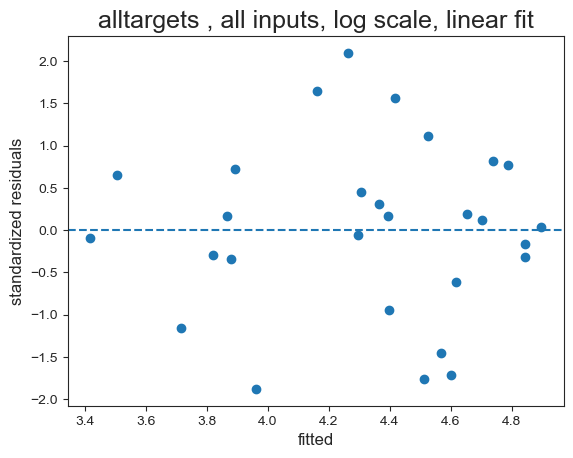

In [40]:
df_results_all_lm = aicfn.analyze_residuals(df_all, savepath_res_qq, savepath_res_plots, areas_with_pre, 0, 0)

In [41]:
# compare models
df_AIC_res = pd.concat([df_results_all_lm['area'], df_results_all_lm['AICc'], df_results_all_pl['AICc']], keys = ['area', 'log-normal res', 'normal res'], axis = 1)
df_AIC_res.set_index('area', inplace=True)
df_AIC_res['deltaAICc'] = df_AIC_res['log-normal res'].sub(df_AIC_res['normal res'], axis = 0)

In [42]:
df_AIC_res

,log-normal res,normal res,deltaAICc
area,,,
PTLp,422.030426,440.496744,-18.466319
TEa,394.033446,426.580614,-32.547168
VIS,536.335974,547.950242,-11.614268
AUD,435.927502,450.322924,-14.395422
RSP,516.788025,543.399146,-26.611121
Thal,478.738003,488.890658,-10.152654
Thal_noLGd,476.847447,489.188116,-12.340670
Dist_ctx,514.664309,537.676562,-23.012253
VISp,515.702772,521.127659,-5.424887


In [43]:
df_AIC_res.to_csv(os.path.join(savepath_res_distr, 'AICc_residual_distribution_all_targets.csv'))

# **4. Model selection per input area, for all targets. data = inputs per area vs starters**

## 4.1. Linear fit

In [44]:
df_fit_lm = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 8992666.64
    reduced chi-square = 345871.794
    Akaike info crit   = 359.032033
    Bayesian info crit = 361.696442
    R-squared          = 0.68969629
[[Variables]]
    slope:      1.64879340 +/- 0.21689229 (13.15%) (init = 1.648793)
    intercept:  345.961193 +/- 142.989697 (41.33%) (init = 345.9612)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 6653015.04
    reduced chi-square = 255885.194
    Akaike info crit   = 350.594533
    Bayesian info crit = 353.258942
    R-squared          = 0.65793562
[[Variables]]
    slope:      1.31926962 +/- 0.18655595 (14.14%) (init = 1.3

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 5.7329e+08
    reduced chi-square = 22049664.8
    Akaike info crit   = 475.371600
    Bayesian info crit = 478.036009
    R-squared          = 0.67291772
[[Variables]]
    slope:      12.6656266 +/- 1.73175931 (13.67%) (init = 12.66563)
    intercept:  4650.65758 +/- 1141.68992 (24.55%) (init = 4650.658)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 15181869.5
    reduced chi-square = 583918.057
    Akaike info crit   = 373.695423
    Bayesian info crit = 376.359832
    R-squared          = 0.77655547
[[Variables]]
    slope:      2.67886323 +/- 0.28181395 (10.52%) (init = 2.6

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 4.4900e+08
    reduced chi-square = 17269352.7
    Akaike info crit   = 468.529408
    Bayesian info crit = 471.193817
    R-squared          = 0.33372993
[[Variables]]
    slope:      5.53074542 +/- 1.53258499 (27.71%) (init = 5.530745)
    intercept:  3424.99724 +/- 1010.38108 (29.50%) (init = 3424.997)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 73015330.7
    reduced chi-square = 2808281.95
    Akaike info crit   = 417.671313
    Bayesian info crit = 420.335722
    R-squared          = 0.58077374
[[Variables]]
    slope:      3.70913650 +/- 0.61802620 (16.66%) (init = 3.709137)
    intercept:  2172.32459 +/- 407.443626 (18.76%) (init = 2172.325)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 69614637.1
    reduced chi-square = 2677486.04
    Akaike info crit   = 416.335865
    Bayesian info crit = 419.000274
    R-squared          = 0.47323566
[[Variables]]
    slope:      2.91653615 +/- 0.60346230 (20.69%) (init = 2.9

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3.5108e+08
    reduced chi-square = 13503184.1
    Akaike info crit   = 461.641187
    Bayesian info crit = 464.305596
    R-squared          = 0.67583468
[[Variables]]
    slope:      9.97765003 +/- 1.35520386 (13.58%) (init = 9.97765)
    intercept:  2636.09188 +/- 893.439736 (33.89%) (init = 2636.092)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.9089e+08
    reduced chi-square = 7342045.98
    Akaike info crit   = 444.580564
    Bayesian info crit = 447.244973
    R-squared          = 0.74270733
[[Variables]]
    slope:      8.65718917 +/- 0.99929817 (11.54%) (init = 8.65

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 29682477.0
    reduced chi-square = 1141633.73
    Akaike info crit   = 392.468162
    Bayesian info crit = 395.132571
    R-squared          = 0.17984910
[[Variables]]
    slope:      0.94090085 +/- 0.39404873 (41.88%) (init = 0.9409009)
    intercept:  809.620624 +/- 259.782906 (32.09%) (init = 809.6206)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 11038868.5
    reduced chi-square = 424571.864
    Akaike info crit   = 364.772400
    Bayesian info crit = 367.436810
    R-squared          = 0.55724093
[[Variables]]
    slope:      1.37463245 +/- 0.24030463 (17.48%) (init = 1.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 10075031.8
    reduced chi-square = 387501.222
    Akaike info crit   = 362.214257
    Bayesian info crit = 364.878666
    R-squared          = 0.25442970
[[Variables]]
    slope:      0.68383189 +/- 0.22957420 (33.57%) (init = 0.6838319)
    intercept:  560.034874 +/- 151.350448 (27.03%) (init = 560.0349)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3724598.57
    reduced chi-square = 143253.791
    Akaike info crit   = 334.351424
    Bayesian info crit = 337.015833
    R-squared          = 0.66777202
[[Variables]]
    slope:      1.00907228 +/- 0.13958527 (13.83%) (init = 1.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 29785262.8
    reduced chi-square = 1145587.03
    Akaike info crit   = 392.564954
    Bayesian info crit = 395.229363
    R-squared          = 0.29052392
[[Variables]]
    slope:      1.28798059 +/- 0.39473040 (30.65%) (init = 1.287981)
    intercept:  790.014049 +/- 260.232310 (32.94%) (init = 790.014)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 52690296.6
    reduced chi-square = 2026549.87
    Akaike info crit   = 408.536646
    Bayesian info crit = 411.201055
    R-squared          = 0.38147728
[[Variables]]
    slope:      2.10236619 +/- 0.52500710 (24.97%) (init = 2.10

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 75879896.6
    reduced chi-square = 2918457.56
    Akaike info crit   = 418.748819
    Bayesian info crit = 421.413228
    R-squared          = 0.30743341
[[Variables]]
    slope:      2.14039863 +/- 0.63003291 (29.44%) (init = 2.140399)
    intercept:  1516.87180 +/- 415.359229 (27.38%) (init = 1516.872)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1776014.53
    reduced chi-square = 68308.2510
    Akaike info crit   = 313.614980
    Bayesian info crit = 316.279389
    R-squared          = 0.22153221
[[Variables]]
    slope:      0.26218504 +/- 0.09638803 (36.76%) (init = 0.2

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3194275.98
    reduced chi-square = 122856.768
    Akaike info crit   = 330.050662
    Bayesian info crit = 332.715071
    R-squared          = 0.51203915
[[Variables]]
    slope:      0.67519909 +/- 0.12926653 (19.14%) (init = 0.6751991)
    intercept:  509.044204 +/- 85.2210178 (16.74%) (init = 509.0442)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 30852562.5
    reduced chi-square = 1186637.02
    Akaike info crit   = 393.550724
    Bayesian info crit = 396.215133
    R-squared          = 0.48279152
[[Variables]]
    slope:      1.97915201 +/- 0.40174038 (20.30%) (init = 1.979152)
    intercept:  1064.32602 +/- 264.853744 (24.88%) (init = 1064.326)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3290747.82
    reduced chi-square = 126567.224
    Akaike info crit   = 330.883785
    Bayesian info crit = 333.548194
    R-squared          = 0.58395599
[[Variables]]
    slope:      0.79260036 +/- 0.13120403 (16.55%) (init = 0.7

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 23946490.1
    reduced chi-square = 921018.852
    Akaike info crit   = 386.455579
    Bayesian info crit = 389.119988
    R-squared          = 0.32399951
[[Variables]]
    slope:      1.24941334 +/- 0.35393279 (28.33%) (init = 1.249413)
    intercept:  704.439766 +/- 233.335830 (33.12%) (init = 704.4398)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 21924701.2
    reduced chi-square = 843257.739
    Akaike info crit   = 383.985759
    Bayesian info crit = 386.650168
    R-squared          = 0.40273209
[[Variables]]
    slope:      1.41800220 +/- 0.33866218 (23.88%) (init = 1.4

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3048258.68
    reduced chi-square = 117240.718
    Akaike info crit   = 328.740543
    Bayesian info crit = 331.404952
    R-squared          = 0.77841885
[[Variables]]
    slope:      1.20684838 +/- 0.12627744 (10.46%) (init = 1.206848)
    intercept:  81.4165344 +/- 83.2504167 (102.25%) (init = 81.41653)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.629
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1551439.91
    reduced chi-square = 59670.7657
    Akaike info crit   = 309.829707
    Bayesian info crit = 312.494116
    R-squared          = 0.49683234
[[Variables]]
    slope:      0.45645986 +/- 0.09008808 (19.74%) (init = 0.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


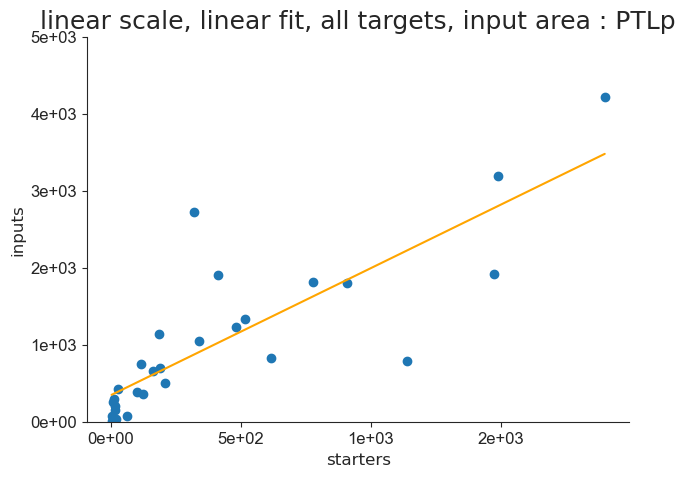

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


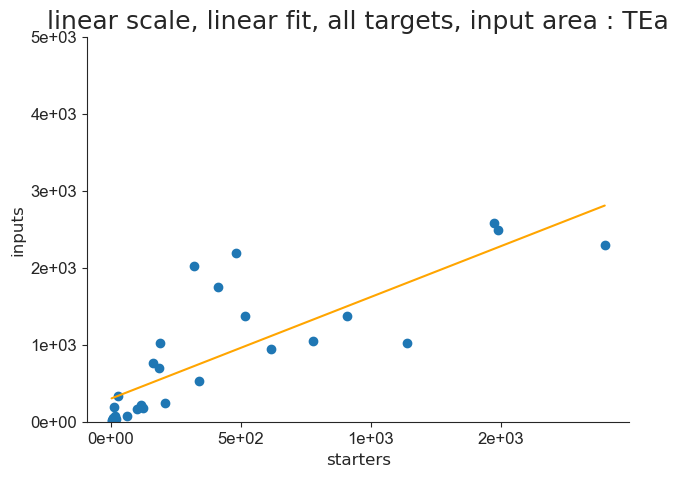

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


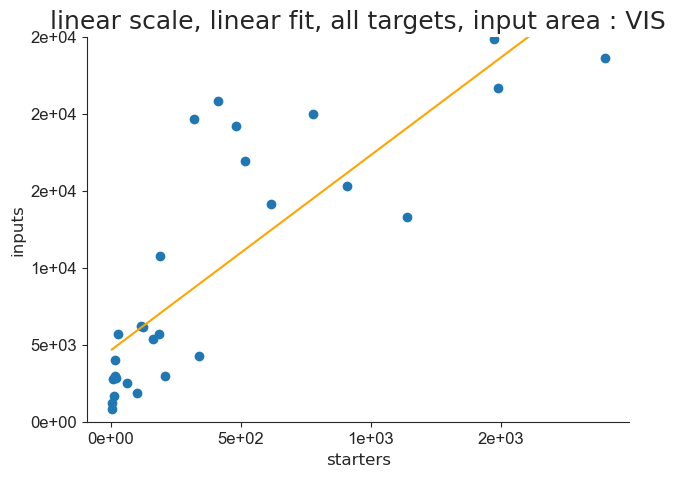

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


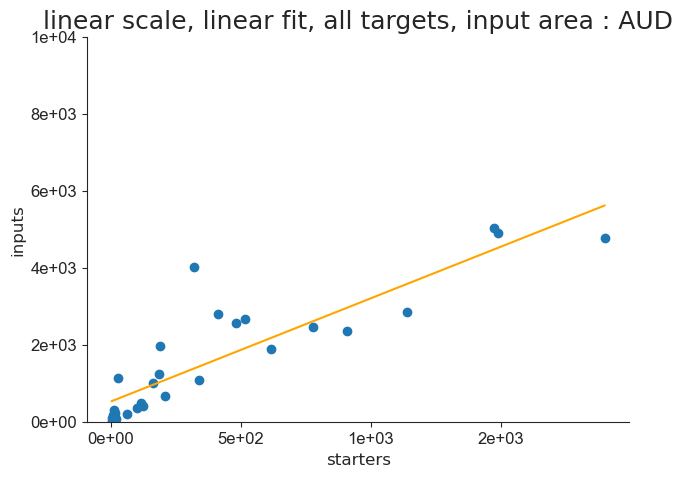

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


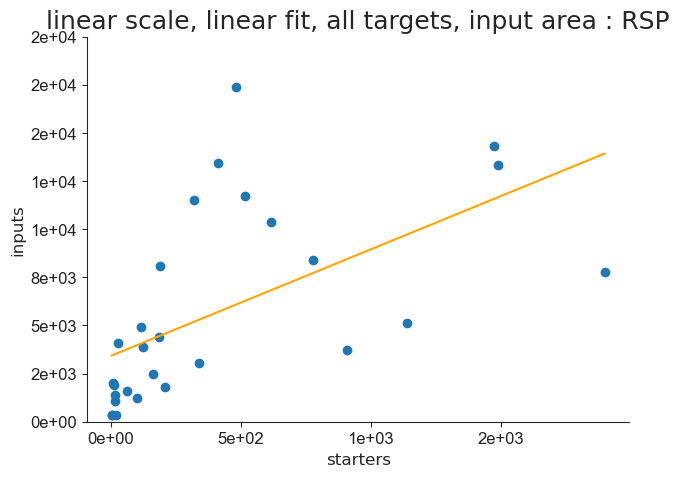

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


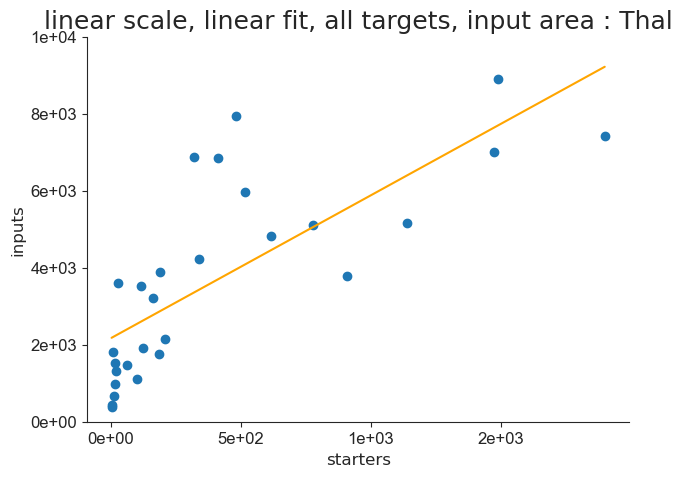

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


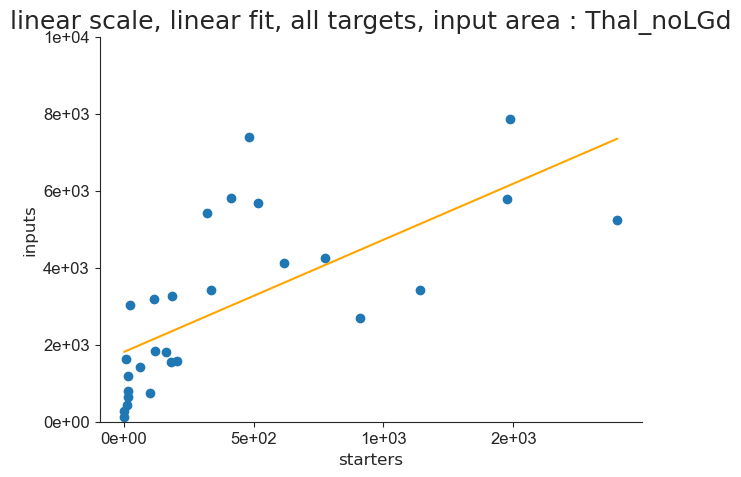

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


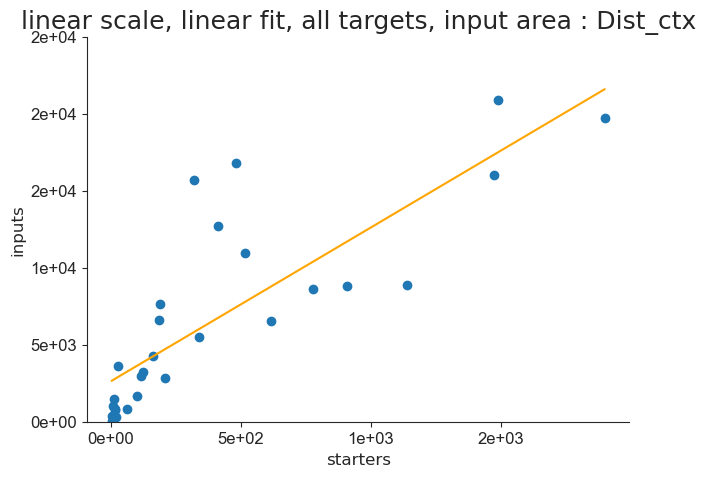

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


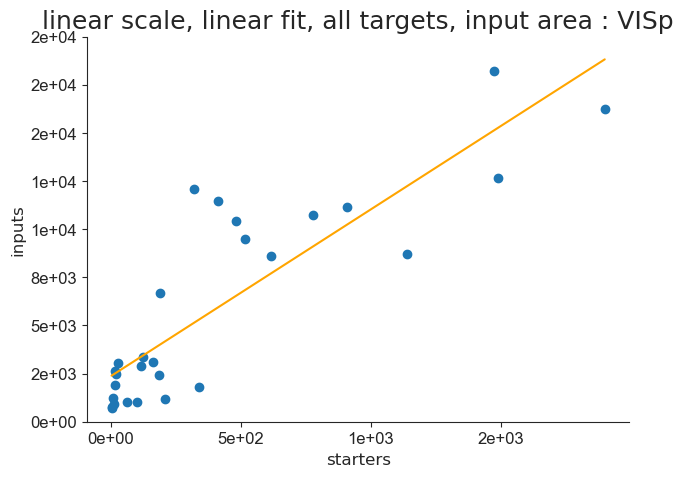

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


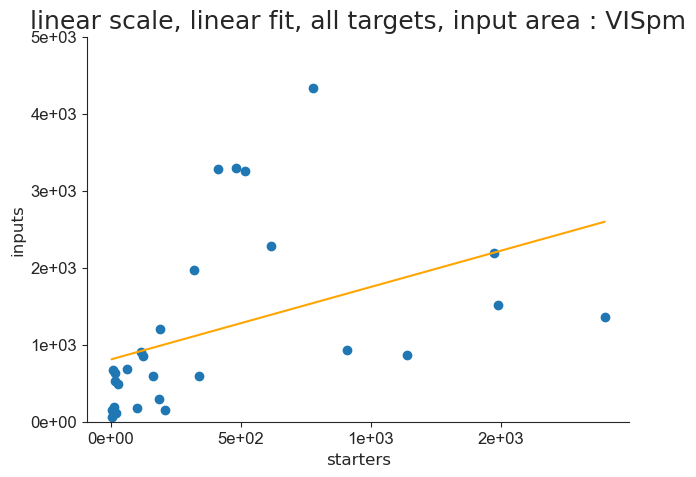

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


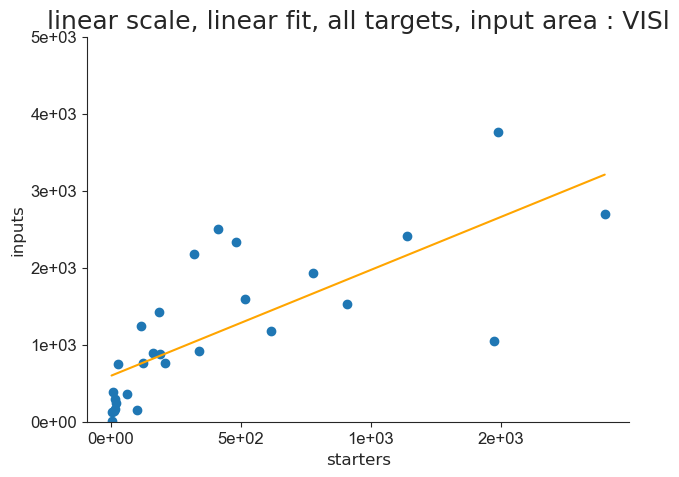

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


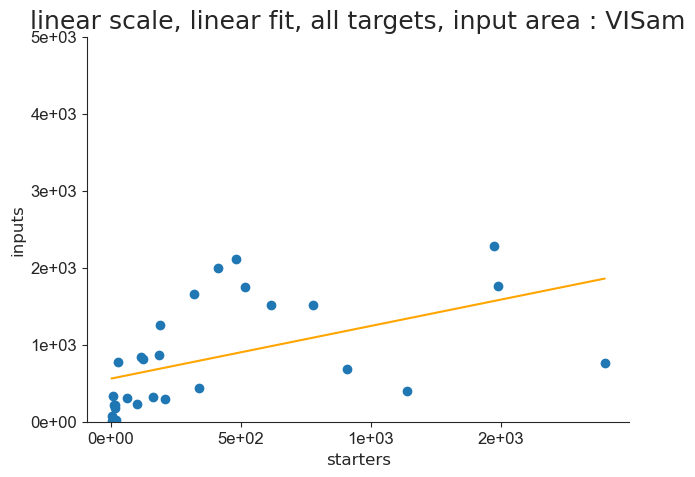

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


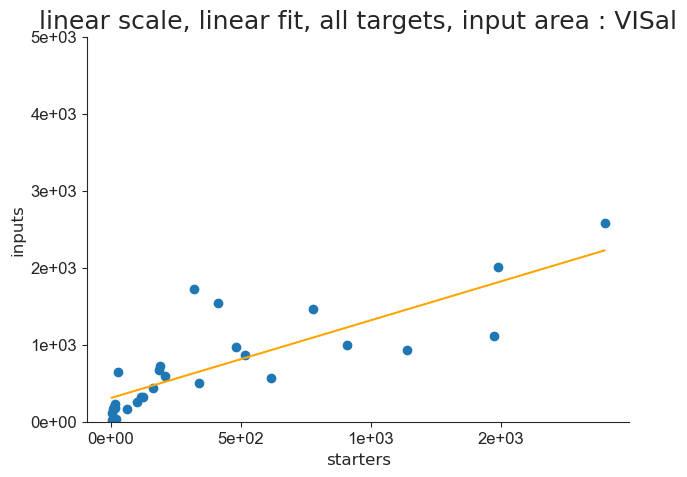

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


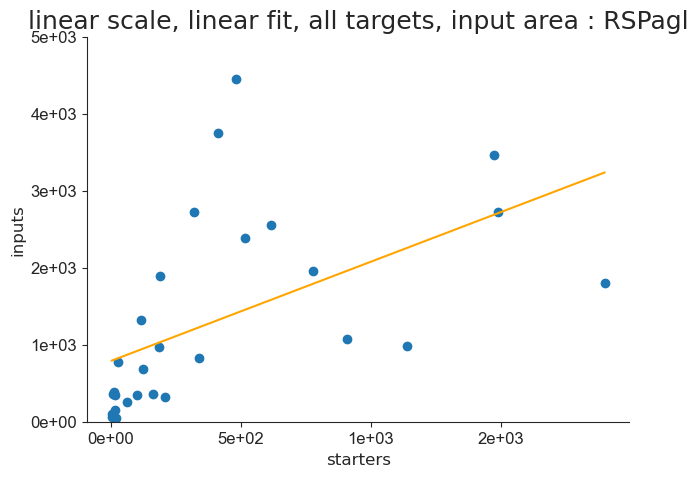

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


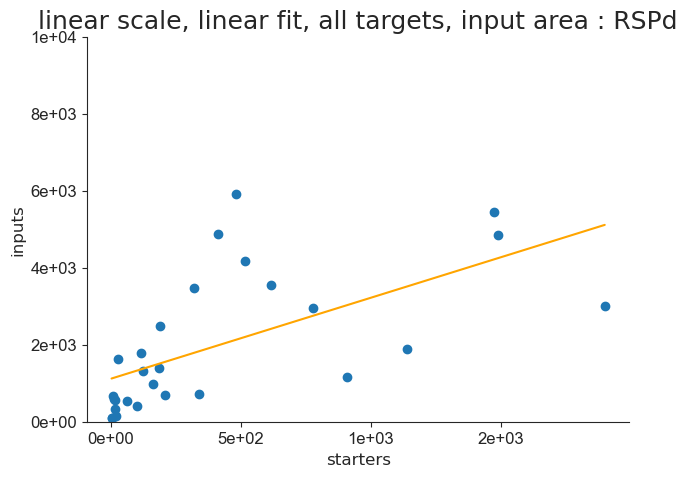

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


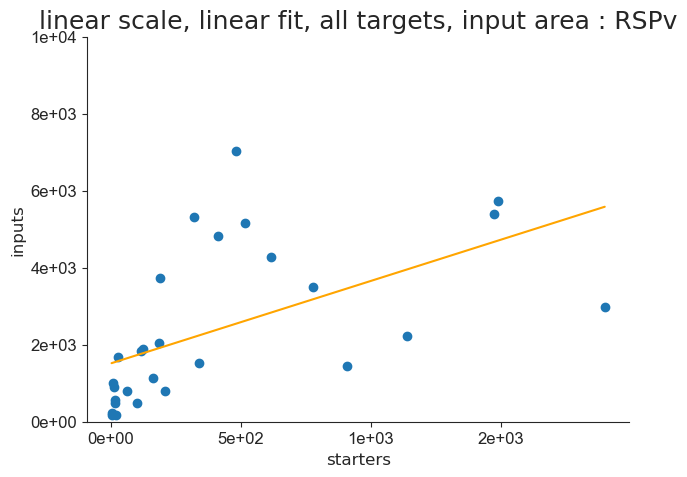

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


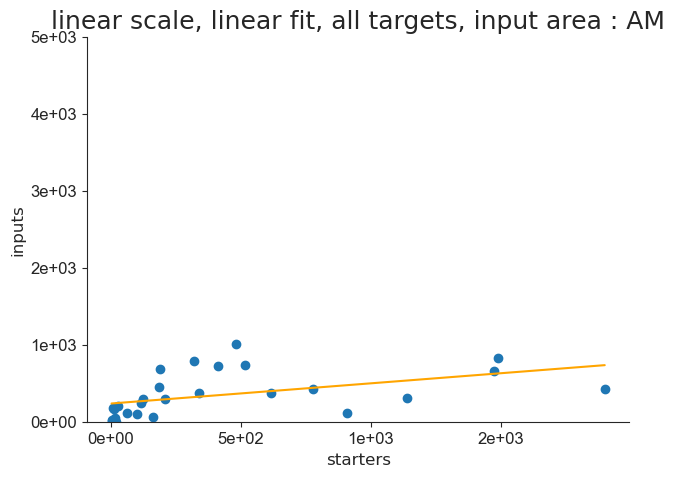

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


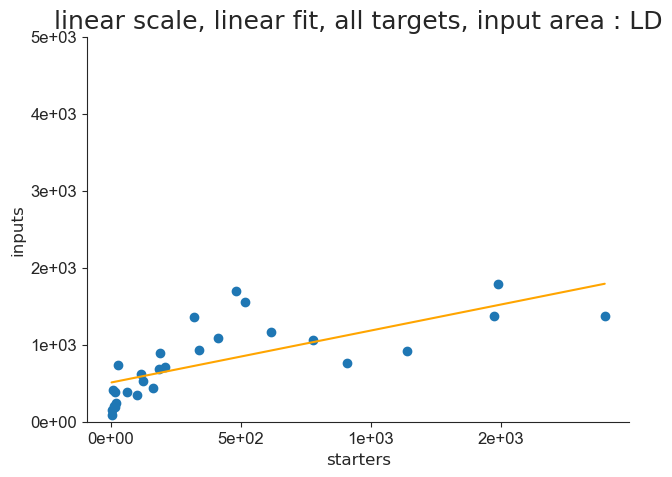

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


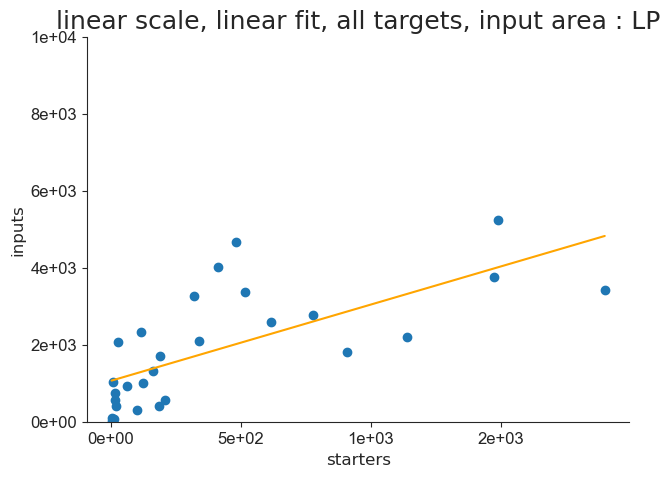

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


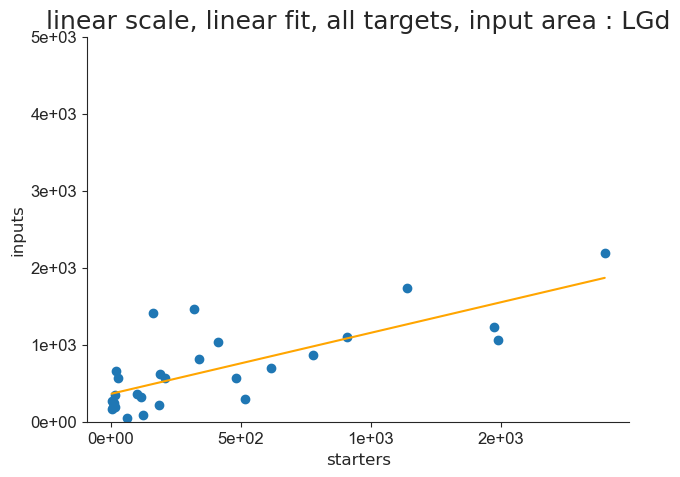

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


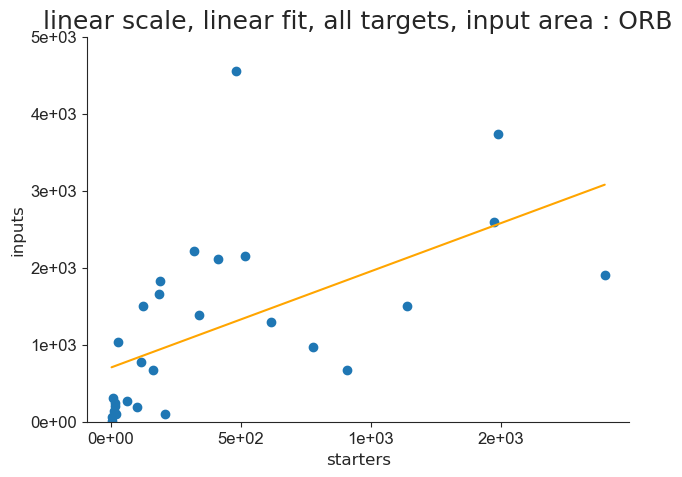

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


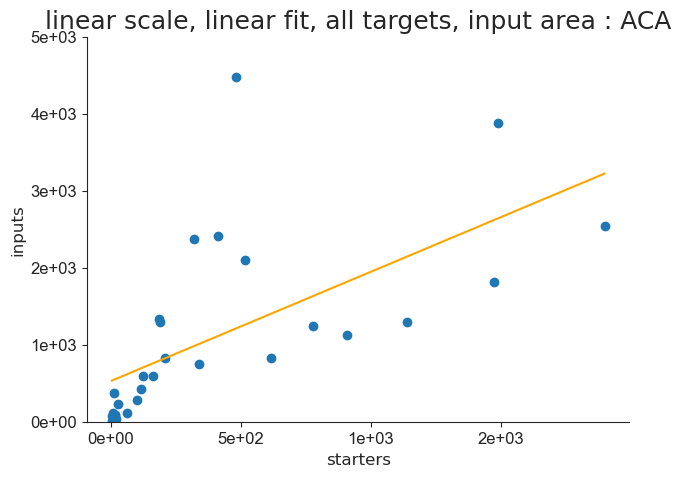

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


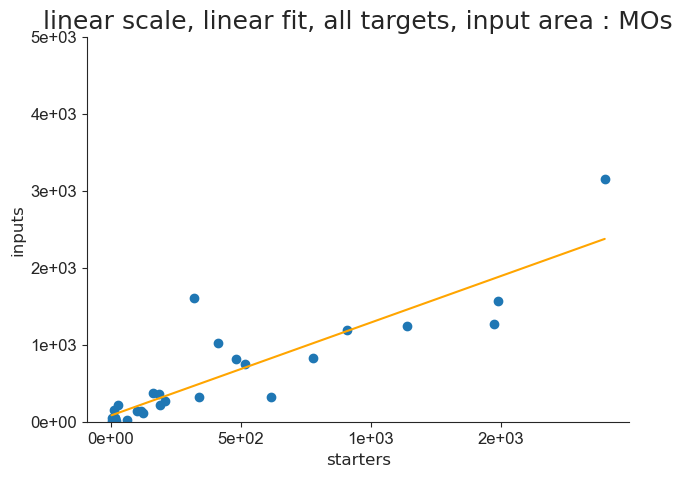

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


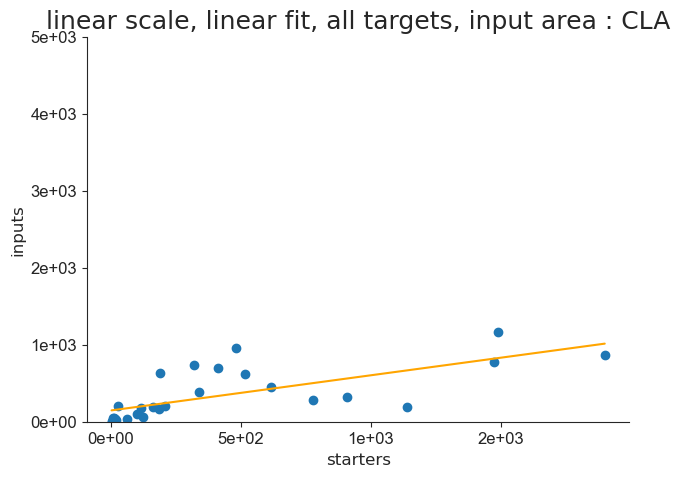

In [45]:
for area in areas:
    ymax_lin = math.ceil(df_all[area].max() / 5000.0) * 5000.0
    this_df_fit_lm, this_result_lm, this_pars_lm, this_AICc_lm, this_rsquare_lm = aicfn.fit_and_saveprms(df_all['starter'].values, df_all[area].values, area, model_lm, 'linear scale, linear fit, all targets, input area : ' + area, 'linscale_lmfit_alltargets_' + area, savepath_lin_nls, 0, ymax_lin, 0, 0)
    df_fit_lm = pd.concat([df_fit_lm, this_df_fit_lm], axis = 0).reset_index(drop = True)

## 4.2. Power-law fit

In [46]:
df_fit_pl = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 28
    # variables        = 2
    chi-square         = 8678453.13
    reduced chi-square = 333786.659
    Akaike info crit   = 358.036182
    Bayesian info crit = 360.700591
    R-squared          = 0.70053863
[[Variables]]
    amplitude:  32.0011920 +/- 23.9737208 (74.92%) (init = 21.10958)
    exponent:   0.60604768 +/- 0.10894975 (17.98%) (init = 0.6589329)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.994
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 28
    # variables        = 2
    chi-square         = 5279526.45
    reduced chi-square = 203058.710
    Akaike info crit   = 344.119989
    Bayesian info crit = 346.784398
    R-squared          = 0.72855345
[[Variables]]
    amplitude:  39.1127230 +/- 25.4660090 (65.11%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 10
    # data points      = 28
    # variables        = 2
    chi-square         = 4.0281e+08
    reduced chi-square = 15492744.5
    Akaike info crit   = 465.489683
    Bayesian info crit = 468.154092
    R-squared          = 0.77018235
[[Variables]]
    amplitude:  774.346549 +/- 351.531401 (45.40%) (init = 697.7881)
    exponent:   0.46021687 +/- 0.06776091 (14.72%) (init = 0.4588946)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.991
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 28
    # variables        = 2
    chi-square         = 12326832.9
    reduced chi-square = 474108.959
    Akaike info crit   = 367.862365
    Bayesian info crit = 370.526774
    R-squared          = 0.81857548
[[Variables]]
    amplitude:  53.3799789 +/- 29.2882656 (54.87%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 28
    # variables        = 2
    chi-square         = 3.4238e+08
    reduced chi-square = 13168555.6
    Akaike info crit   = 460.938564
    Bayesian info crit = 463.602973
    R-squared          = 0.49194306
[[Variables]]
    amplitude:  879.111826 +/- 547.932463 (62.33%) (init = 320.1671)
    exponent:   0.34982575 +/- 0.09571725 (27.36%) (init = 0.4904633)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.986
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 17
    # data points      = 28
    # variables        = 2
    chi-square         = 48871650.9
    reduced chi-square = 1879678.88
    Akaike info crit   = 406.430099
    Bayesian info crit = 409.094508
    R-squared          = 0.71939757
[[Variables]]
    amplitude:  546.988091 +/- 202.962418 (37.11%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 28
    # variables        = 2
    chi-square         = 49393599.0
    reduced chi-square = 1899753.81
    Akaike info crit   = 406.727553
    Bayesian info crit = 409.391962
    R-squared          = 0.62624546
[[Variables]]
    amplitude:  474.790448 +/- 213.486889 (44.96%) (init = 210.7502)
    exponent:   0.34410101 +/- 0.06918948 (20.11%) (init = 0.4677824)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.986
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 28
    # variables        = 2
    chi-square         = 2.7909e+08
    reduced chi-square = 10734408.5
    Akaike info crit   = 455.215994
    Bayesian info crit = 457.880403
    R-squared          = 0.74230352
[[Variables]]
    amplitude:  360.682396 +/- 210.945648 (58.49%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 16
    # data points      = 28
    # variables        = 2
    chi-square         = 1.5455e+08
    reduced chi-square = 5944238.52
    Akaike info crit   = 438.667101
    Bayesian info crit = 441.331510
    R-squared          = 0.79169171
[[Variables]]
    amplitude:  282.770557 +/- 144.627713 (51.15%) (init = 417.5305)
    exponent:   0.53968898 +/- 0.07517549 (13.93%) (init = 0.4506065)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.993
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 28
    # variables        = 2
    chi-square         = 23856667.6
    reduced chi-square = 917564.139
    Akaike info crit   = 386.350354
    Bayesian info crit = 389.014763
    R-squared          = 0.34082094
[[Variables]]
    amplitude:  233.230192 +/- 172.503820 (73.96%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 28
    # variables        = 2
    chi-square         = 8128531.18
    reduced chi-square = 312635.815
    Akaike info crit   = 356.203216
    Bayesian info crit = 358.867625
    R-squared          = 0.67397194
[[Variables]]
    amplitude:  121.356862 +/- 62.5095002 (51.51%) (init = 39.77872)
    exponent:   0.41439084 +/- 0.07772375 (18.76%) (init = 0.5853831)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.989
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 28
    # variables        = 2
    chi-square         = 7603528.74
    reduced chi-square = 292443.413
    Akaike info crit   = 354.333718
    Bayesian info crit = 356.998127
    R-squared          = 0.43732532
[[Variables]]
    amplitude:  168.319938 +/- 99.3564411 (59.03%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 10
    # data points      = 28
    # variables        = 2
    chi-square         = 3422984.83
    reduced chi-square = 131653.263
    Akaike info crit   = 331.986931
    Bayesian info crit = 334.651340
    R-squared          = 0.69467546
[[Variables]]
    amplitude:  41.4802104 +/- 25.2559265 (60.89%) (init = 37.60149)
    exponent:   0.50914178 +/- 0.08999119 (17.68%) (init = 0.5104135)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.992
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 28
    # variables        = 2
    chi-square         = 23135662.2
    reduced chi-square = 889833.163
    Akaike info crit   = 385.491076
    Bayesian info crit = 388.155485
    R-squared          = 0.44891542
[[Variables]]
    amplitude:  200.571748 +/- 140.135509 (69.87%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 28
    # variables        = 2
    chi-square         = 41286794.6
    reduced chi-square = 1587953.64
    Akaike info crit   = 401.707765
    Bayesian info crit = 404.372174
    R-squared          = 0.51534111
[[Variables]]
    amplitude:  260.780054 +/- 168.438718 (64.59%) (init = 95.02028)
    exponent:   0.37647244 +/- 0.09846889 (26.16%) (init = 0.5163552)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.988
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 28
    # variables        = 2
    chi-square         = 57018817.6
    reduced chi-square = 2193031.45
    Akaike info crit   = 410.747247
    Bayesian info crit = 413.411656
    R-squared          = 0.47958115
[[Variables]]
    amplitude:  421.575666 +/- 247.295381 (58.66%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 28
    # variables        = 2
    chi-square         = 1353004.61
    reduced chi-square = 52038.6390
    Akaike info crit   = 305.997747
    Bayesian info crit = 308.662156
    R-squared          = 0.40694713
[[Variables]]
    amplitude:  75.5052558 +/- 44.7814288 (59.31%) (init = 12.45578)
    exponent:   0.28927197 +/- 0.09296768 (32.14%) (init = 0.5547753)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.983
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 20
    # data points      = 28
    # variables        = 2
    chi-square         = 1960144.42
    reduced chi-square = 75390.1698
    Akaike info crit   = 316.377078
    Bayesian info crit = 319.041487
    R-squared          = 0.70056634
[[Variables]]
    amplitude:  153.884128 +/- 50.1079644 (32.56%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data points      = 28
    # variables        = 2
    chi-square         = 23584216.8
    reduced chi-square = 907085.260
    Akaike info crit   = 386.028745
    Bayesian info crit = 388.693154
    R-squared          = 0.60463715
[[Variables]]
    amplitude:  249.825846 +/- 129.472755 (51.83%) (init = 53.15468)
    exponent:   0.37286673 +/- 0.07906412 (21.20%) (init = 0.6133476)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.987
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 16
    # data points      = 28
    # variables        = 2
    chi-square         = 3444711.36
    reduced chi-square = 132488.898
    Akaike info crit   = 332.164093
    Bayesian info crit = 334.828502
    R-squared          = 0.56449063
[[Variables]]
    amplitude:  67.4187836 +/- 39.9525827 (59.26%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize = (7,5))
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont:

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 28
    # variables        = 2
    chi-square         = 19549672.3
    reduced chi-square = 751910.471
    Akaike info crit   = 380.775408
    Bayesian info crit = 383.439817
    R-squared          = 0.44812004
[[Variables]]
    amplitude:  177.101971 +/- 124.993670 (70.58%) (init = 35.60157)
    exponent:   0.36003988 +/- 0.10808888 (30.02%) (init = 0.5921145)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.987
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 28
    # variables        = 2
    chi-square         = 18096086.7
    reduced chi-square = 696003.333
    Akaike info crit   = 378.612049
    Bayesian info crit = 381.276458
    R-squared          = 0.50703037
[[Variables]]
    amplitude:  102.325871 +/- 83.0141508 (81.13%) (

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 28
    # variables        = 2
    chi-square         = 3114424.63
    reduced chi-square = 119785.563
    Akaike info crit   = 329.341813
    Bayesian info crit = 332.006222
    R-squared          = 0.77360917
[[Variables]]
    amplitude:  2.70154149 +/- 2.70219098 (100.02%) (init = 7.601142)
    exponent:   0.89551695 +/- 0.14089284 (15.73%) (init = 0.7090263)
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, exponent) = -0.997
[[Model]]
    Model(powerlaw)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 28
    # variables        = 2
    chi-square         = 1298265.20
    reduced chi-square = 49933.2768
    Akaike info crit   = 304.841379
    Bayesian info crit = 307.505788
    R-squared          = 0.57894273
[[Variables]]
    amplitude:  25.0646423 +/- 18.9116044 (75.45%) 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


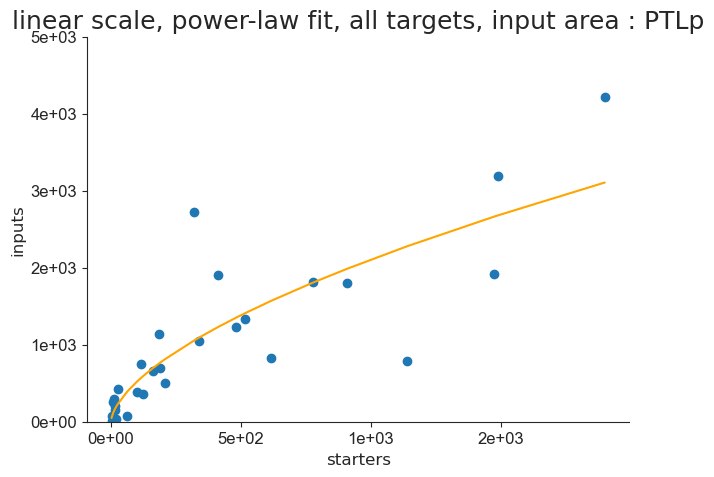

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


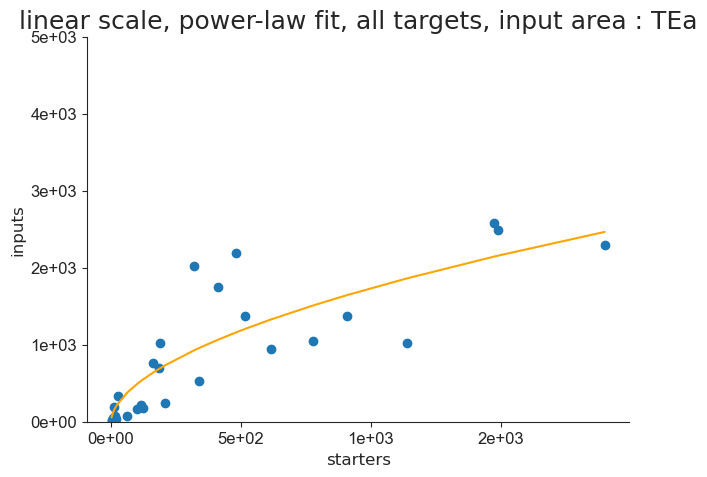

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


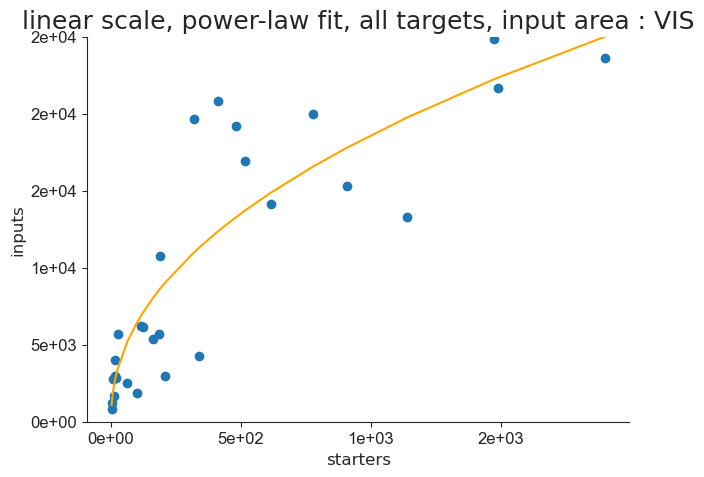

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


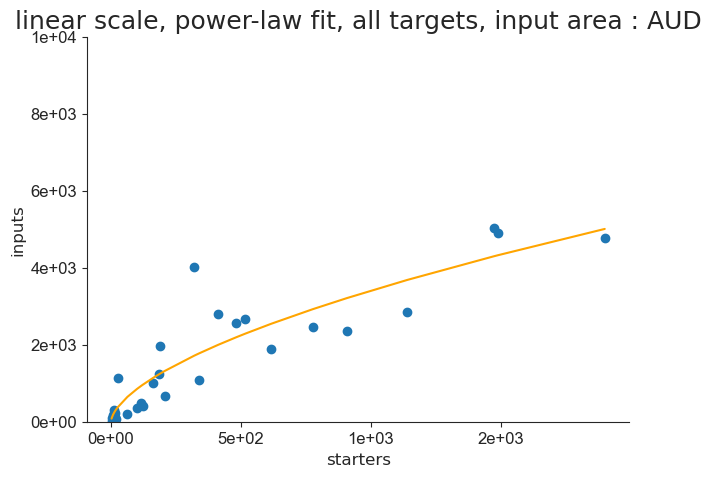

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


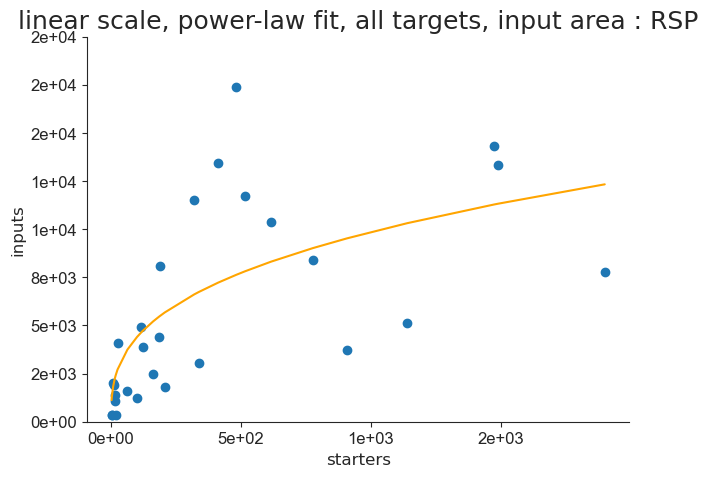

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


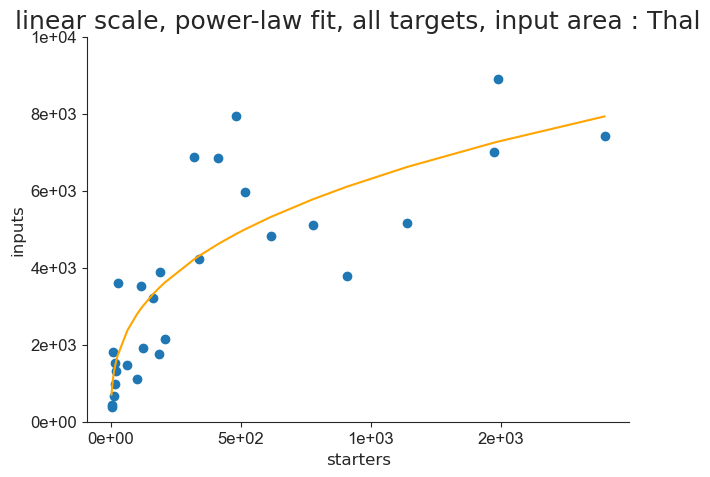

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


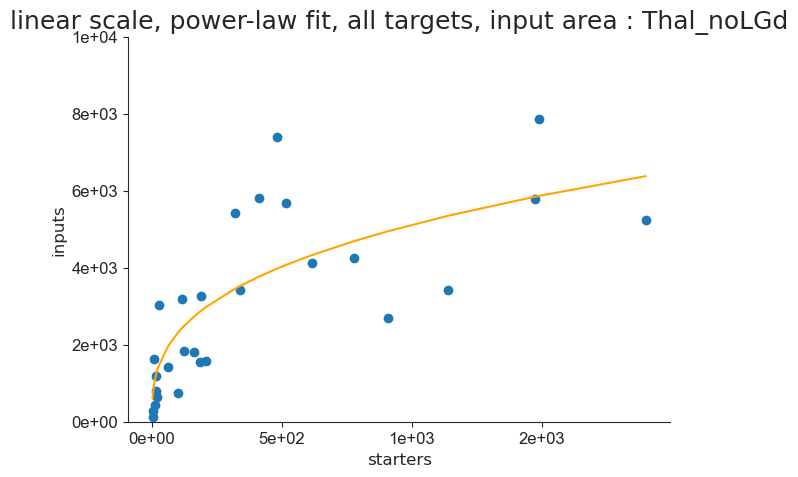

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


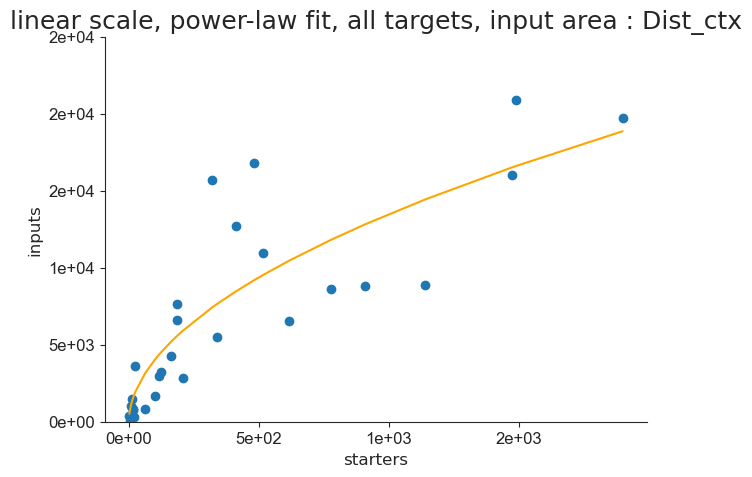

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


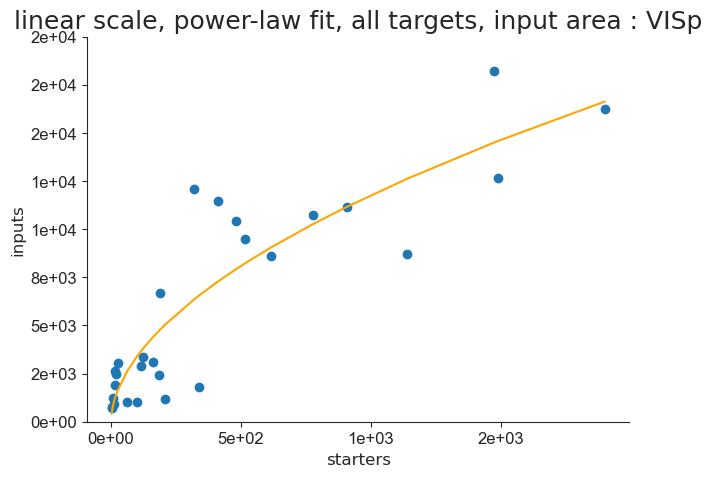

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


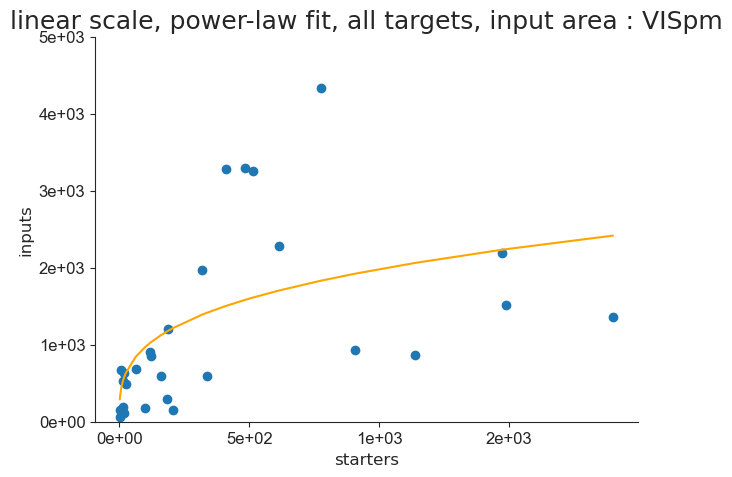

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


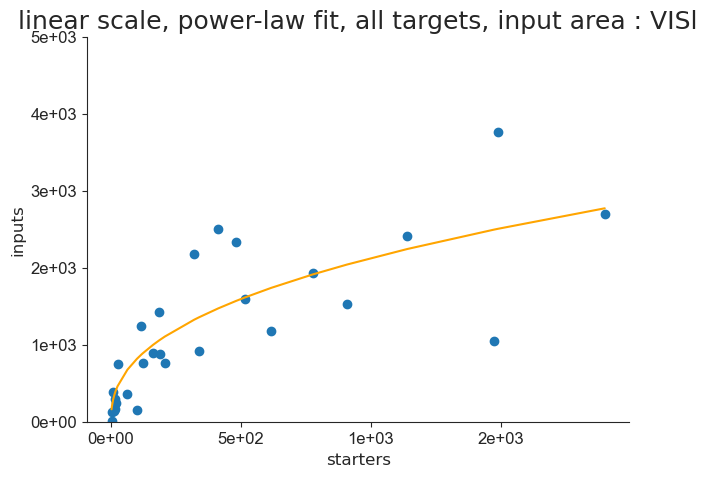

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


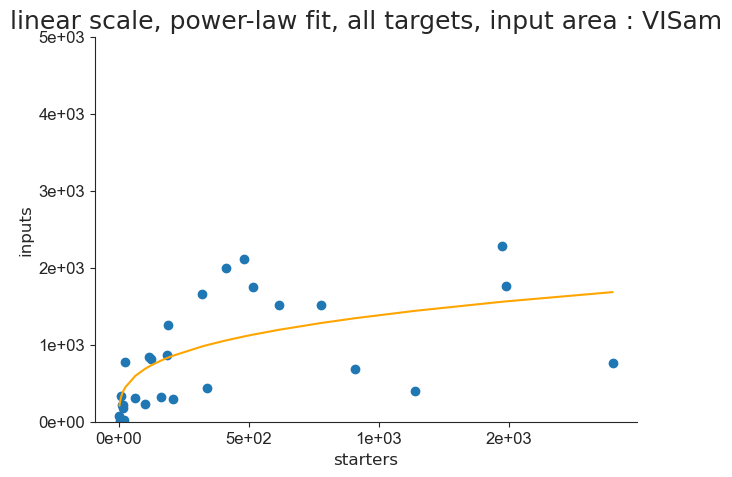

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


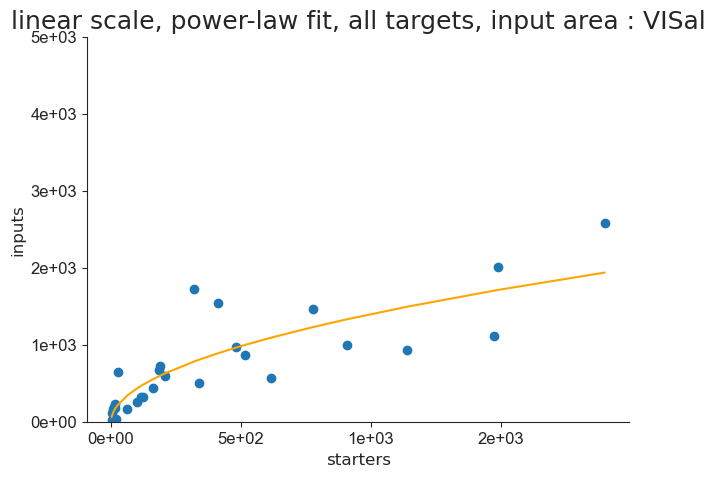

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


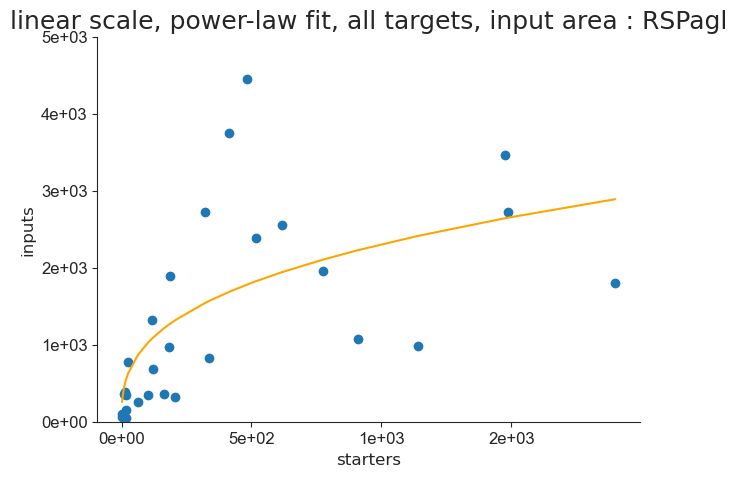

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


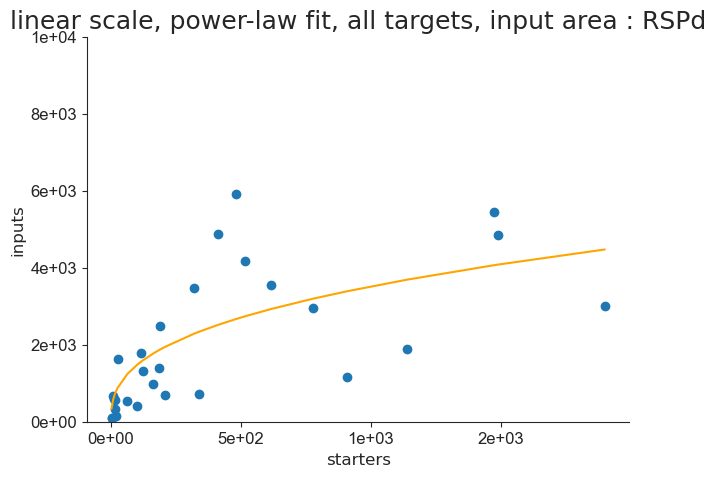

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


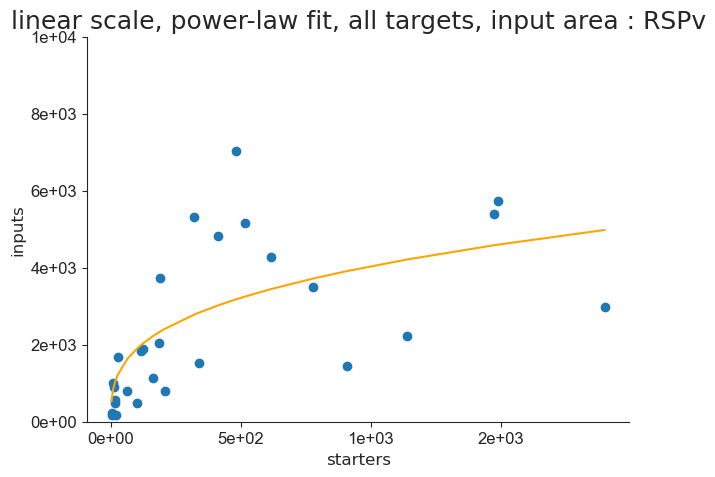

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


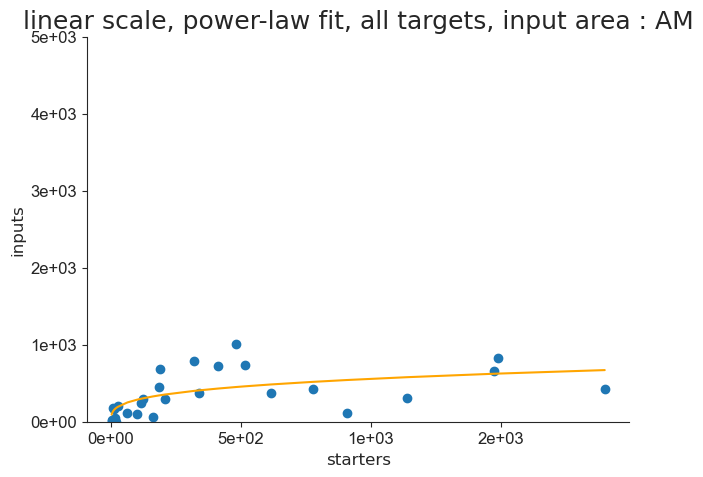

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


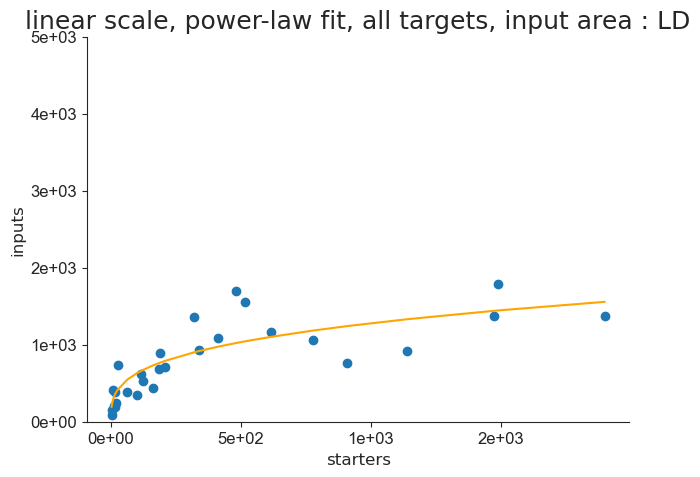

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


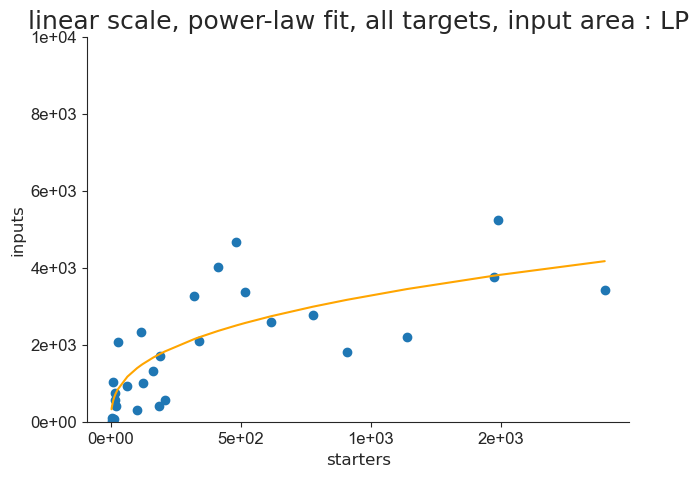

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


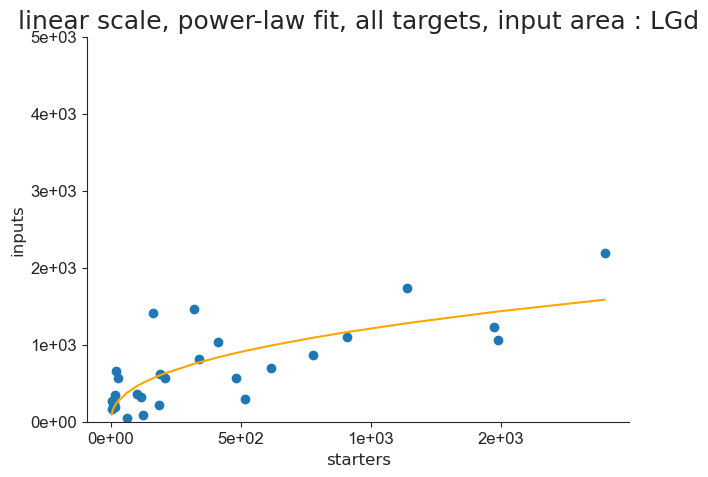

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


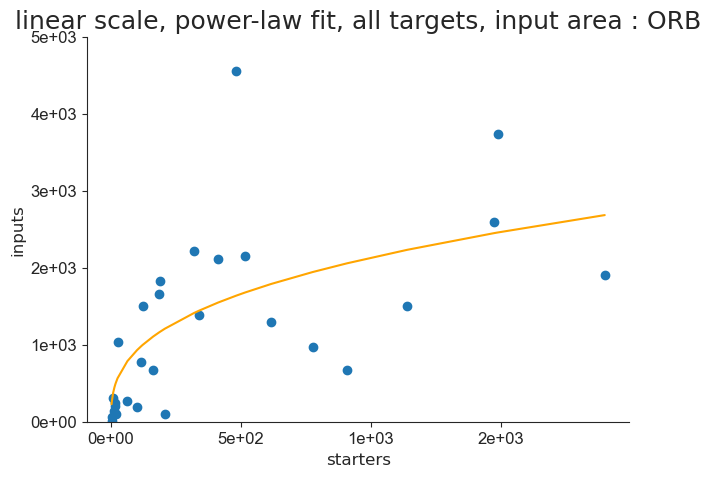

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


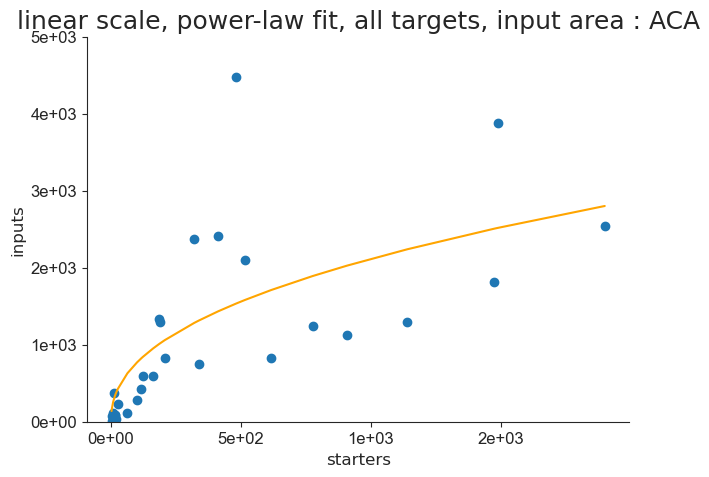

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


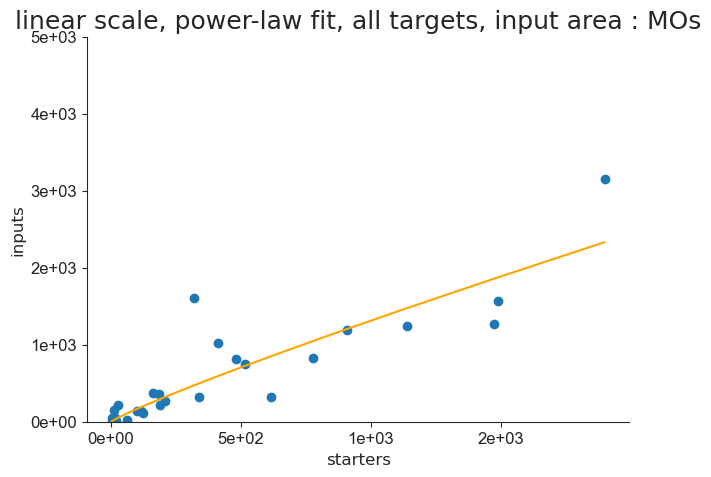

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


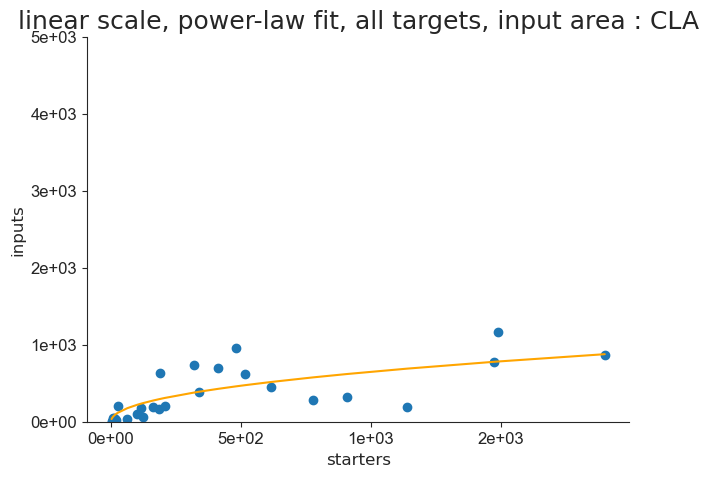

In [47]:
for area in areas:
    ymax_lin = math.ceil(df_all[area].max() / 5000.0) * 5000.0
    this_df_fit_pl, this_result_pl, this_pars_pl, this_AICc_pl, this_rsquare_pl = aicfn.fit_and_saveprms(df_all['starter'].values, df_all[area].values, area, model_pl, 'linear scale, power-law fit, all targets, input area : ' + area, 'linscale_plfit_alltargets_' + area, savepath_lin_nls, 0, ymax_lin, 0, 0)
    df_fit_pl= pd.concat([df_fit_pl, this_df_fit_pl], axis = 0).reset_index(drop = True)

## 4.3. Exponential fit

In [48]:
df_fit_exp = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 28
    # variables        = 2
    chi-square         = 9560838.79
    reduced chi-square = 367724.569
    Akaike info crit   = 360.747482
    Bayesian info crit = 363.411891
    R-squared          = 0.67009076
[[Variables]]
    a:  566.341978 +/- 109.973446 (19.42%) (init = 1000)
    b: -960.112628 +/- 125.554985 (13.08%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.895
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 8807425.65
    reduced chi-square = 338747.140
    Akaike info crit   = 358.449235
    Bayesian info crit = 361.113644
    R-squared          = 0.54716672
[[Variables]]
    a:  531.845459 +/- 111.244807 (20.92%) (init = 1000)
    b: -1109.67480 +/- 192.707356 (17

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 28
    # variables        = 2
    chi-square         = 7.8150e+08
    reduced chi-square = 30057849.6
    Akaike info crit   = 484.046740
    Bayesian info crit = 486.711149
    R-squared          = 0.55412520
[[Variables]]
    a:  6704.38832 +/- 1092.82622 (16.30%) (init = 1000)
    b: -1287.93418 +/- 216.715974 (16.83%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.834
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 22890283.4
    reduced chi-square = 880395.515
    Akaike info crit   = 385.192520
    Bayesian info crit = 387.856929
    R-squared          = 0.66310416
[[Variables]]
    a:  993.678992 +/- 176.289285 (17.74%) (init = 1000)
    b: -1053.84797 +/- 144.015465 (13

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 5.0137e+08
    reduced chi-square = 19283465.8
    Akaike info crit   = 471.618217
    Bayesian info crit = 474.282626
    R-squared          = 0.25602330
[[Variables]]
    a:  4321.02678 +/- 924.936091 (21.41%) (init = 1000)
    b: -1686.73072 +/- 550.887535 (32.66%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.783
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 88791951.6
    reduced chi-square = 3415075.06
    Akaike info crit   = 423.148858
    Bayesian info crit = 425.813267
    R-squared          = 0.49019039
[[Variables]]
    a:  2686.93751 +/- 382.270882 (14.23%) (init = 1000)
    b: -1525.14010 +/- 286.502029 (18

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 80905498.6
    reduced chi-square = 3111749.95
    Akaike info crit   = 420.544459
    Bayesian info crit = 423.208868
    R-squared          = 0.38779927
[[Variables]]
    a:  2231.97604 +/- 368.321543 (16.50%) (init = 1000)
    b: -1603.48008 +/- 375.616406 (23.43%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.792
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 28
    # variables        = 2
    chi-square         = 4.4870e+08
    reduced chi-square = 17257742.0
    Akaike info crit   = 468.510576
    Bayesian info crit = 471.174985
    R-squared          = 0.58570057
[[Variables]]
    a:  4227.70016 +/- 795.623921 (18.82%) (init = 1000)
    b: -1116.68449 +/- 176.102610 (15

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 28
    # variables        = 2
    chi-square         = 2.7693e+08
    reduced chi-square = 10651206.5
    Akaike info crit   = 454.998121
    Bayesian info crit = 457.662530
    R-squared          = 0.62674200
[[Variables]]
    a:  3815.62749 +/- 631.513829 (16.55%) (init = 1000)
    b: -1154.85691 +/- 168.224221 (14.57%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.857
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 28
    # variables        = 2
    chi-square         = 31686821.9
    reduced chi-square = 1218723.92
    Akaike info crit   = 394.297794
    Bayesian info crit = 396.962203
    R-squared          = 0.12446743
[[Variables]]
    a:  975.569724 +/- 241.045754 (24.71%) (init = 1000)
    b: -2173.15139 +/- 1169.06874 (53

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 13400774.1
    reduced chi-square = 515414.387
    Akaike info crit   = 370.201319
    Bayesian info crit = 372.865728
    R-squared          = 0.46250703
[[Variables]]
    a:  808.889393 +/- 145.000958 (17.93%) (init = 1000)
    b: -1361.25648 +/- 273.061079 (20.06%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.823
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 28
    # variables        = 2
    chi-square         = 10940733.8
    reduced chi-square = 420797.453
    Akaike info crit   = 364.522370
    Bayesian info crit = 367.186779
    R-squared          = 0.19036620
[[Variables]]
    a:  669.065052 +/- 140.043210 (20.93%) (init = 1000)
    b: -1988.15225 +/- 800.660524 (40

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 4152807.58
    reduced chi-square = 159723.368
    Akaike info crit   = 337.398539
    Bayesian info crit = 340.062948
    R-squared          = 0.62957649
[[Variables]]
    a:  439.496589 +/- 75.9302321 (17.28%) (init = 1000)
    b: -1089.22368 +/- 152.064237 (13.96%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.869
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 32849272.3
    reduced chi-square = 1263433.55
    Akaike info crit   = 395.306598
    Bayesian info crit = 397.971007
    R-squared          = 0.21754012
[[Variables]]
    a:  1006.35614 +/- 237.290217 (23.58%) (init = 1000)
    b: -1709.52526 +/- 627.235673 (36

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 59790463.1
    reduced chi-square = 2299633.20
    Akaike info crit   = 412.076262
    Bayesian info crit = 414.740671
    R-squared          = 0.29812959
[[Variables]]
    a:  1460.47466 +/- 314.715905 (21.55%) (init = 1000)
    b: -1551.66575 +/- 452.553387 (29.17%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.798


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 83787569.0
    reduced chi-square = 3222598.81
    Akaike info crit   = 421.524540
    Bayesian info crit = 424.188949
    R-squared          = 0.23525896
[[Variables]]
    a:  1855.25516 +/- 382.287535 (20.61%) (init = 1000)
    b: -1806.73541 +/- 626.383817 (34.67%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.772


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 1887063.37
    reduced chi-square = 72579.3605
    Akaike info crit   = 315.313181
    Bayesian info crit = 317.977590
    R-squared          = 0.17285696
[[Variables]]
    a:  274.331037 +/- 58.2962820 (21.25%) (init = 1000)
    b: -2023.37970 +/- 847.608377 (41.89%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.755
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 3748177.13
    reduced chi-square = 144160.659
    Akaike info crit   = 334.528119
    Bayesian info crit = 337.192528
    R-squared          = 0.42742465
[[Variables]]
    a:  598.429814 +/- 80.3843266 (13.43%) (init = 1000)
    b: -1740.18013 +/- 372.979189 (21

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 36041925.0
    reduced chi-square = 1386227.88
    Akaike info crit   = 397.903689
    Bayesian info crit = 400.568098
    R-squared          = 0.39579770
[[Variables]]
    a:  1361.32672 +/- 242.841007 (17.84%) (init = 1000)
    b: -1502.51254 +/- 346.320166 (23.05%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.804
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 28
    # variables        = 2
    chi-square         = 3470862.63
    reduced chi-square = 133494.717
    Akaike info crit   = 332.375858
    Bayesian info crit = 335.040267
    R-squared          = 0.56118436
[[Variables]]
    a:  450.288962 +/- 72.1541887 (16.02%) (init = 1000)
    b: -1242.04654 +/- 194.819477 (15

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize = (7,5))
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont:

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 26162550.7
    reduced chi-square = 1006251.95
    Akaike info crit   = 388.933782
    Bayesian info crit = 391.598191
    R-squared          = 0.26144094
[[Variables]]
    a:  894.865684 +/- 208.218962 (23.27%) (init = 1000)
    b: -1552.94534 +/- 489.759569 (31.54%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.798
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 28
    # variables        = 2
    chi-square         = 24703607.1
    reduced chi-square = 950138.734
    Akaike info crit   = 387.327149
    Bayesian info crit = 389.991558
    R-squared          = 0.32702974
[[Variables]]
    a:  761.928543 +/- 194.949779 (25.59%) (init = 1000)
    b: -1305.54671 +/- 351.770420 (26

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 28
    # variables        = 2
    chi-square         = 3005812.45
    reduced chi-square = 115608.171
    Akaike info crit   = 328.347910
    Bayesian info crit = 331.012319
    R-squared          = 0.78150431
[[Variables]]
    a:  264.165148 +/- 55.6197847 (21.05%) (init = 1000)
    b: -783.904103 +/- 83.6679987 (10.67%) (init = -500)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.933
[[Model]]
    Model(expfunc)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 1766299.61
    reduced chi-square = 67934.6005
    Akaike info crit   = 313.461398
    Bayesian info crit = 316.125807
    R-squared          = 0.42714840
[[Variables]]
    a:  217.201390 +/- 50.8655976 (23.42%) (init = 1000)
    b: -1189.26140 +/- 255.855968 (21

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


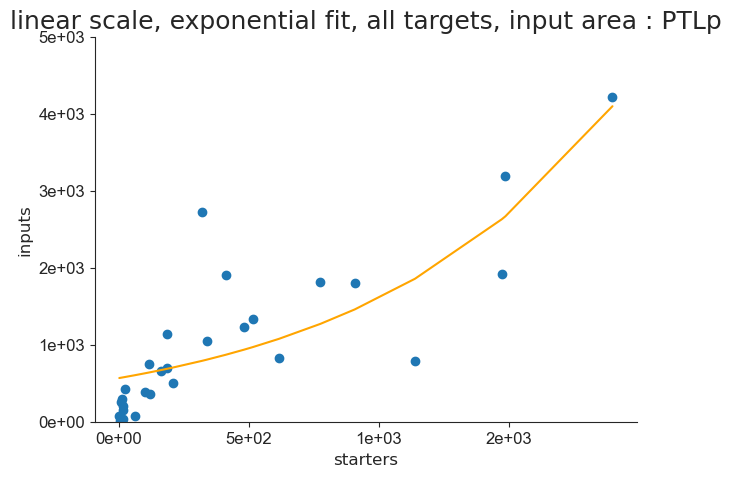

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


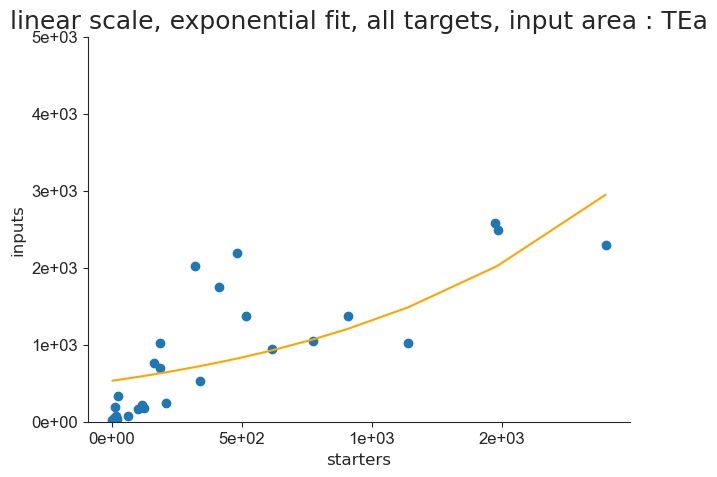

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


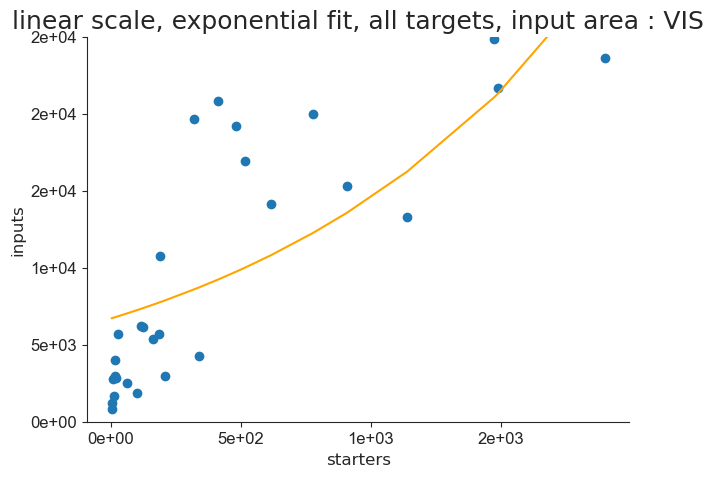

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


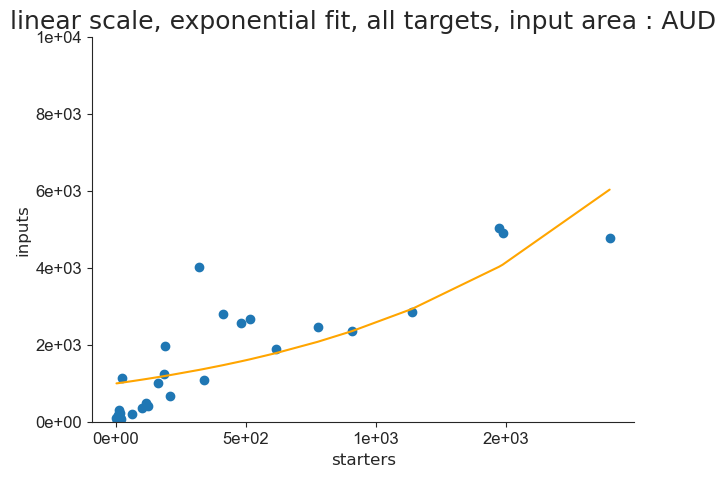

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


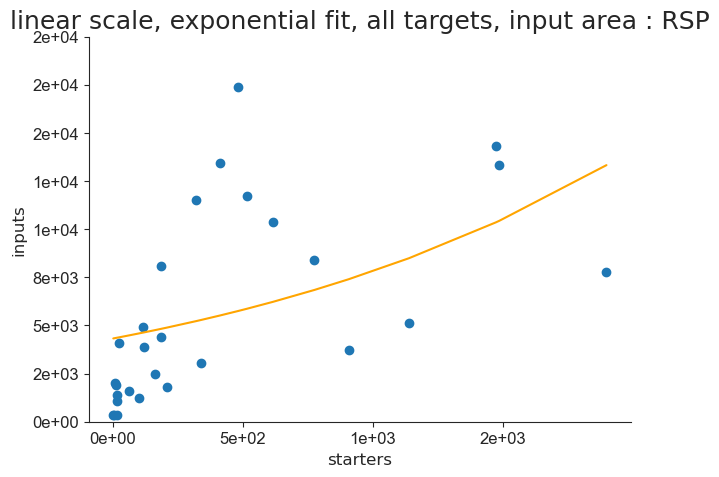

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


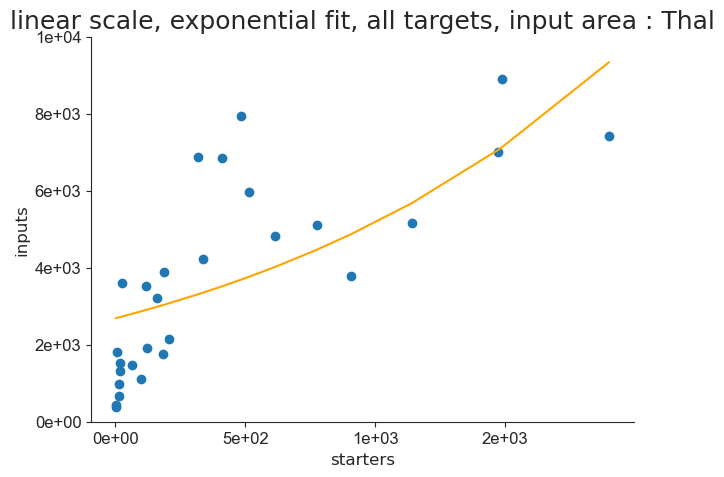

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


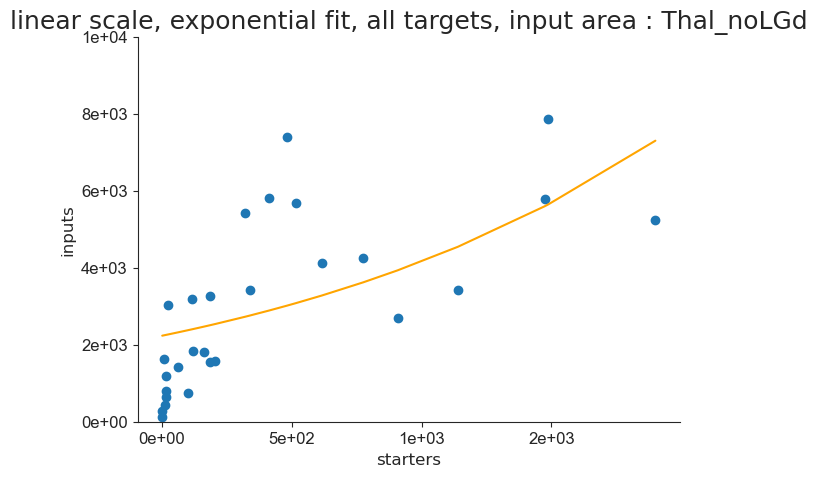

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


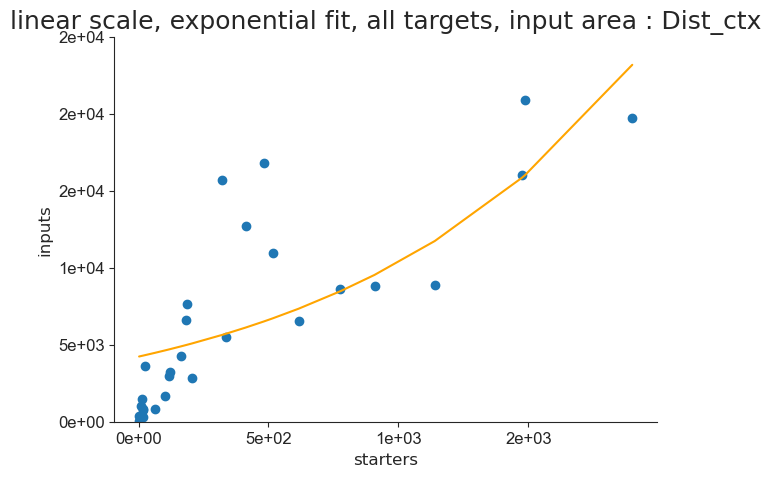

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


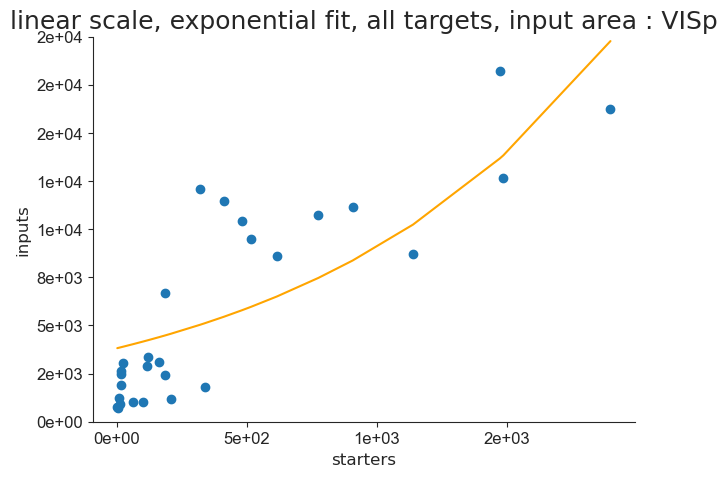

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


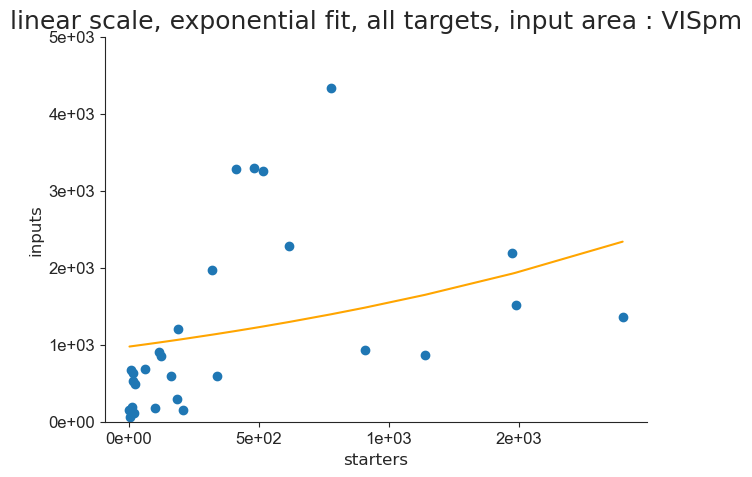

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


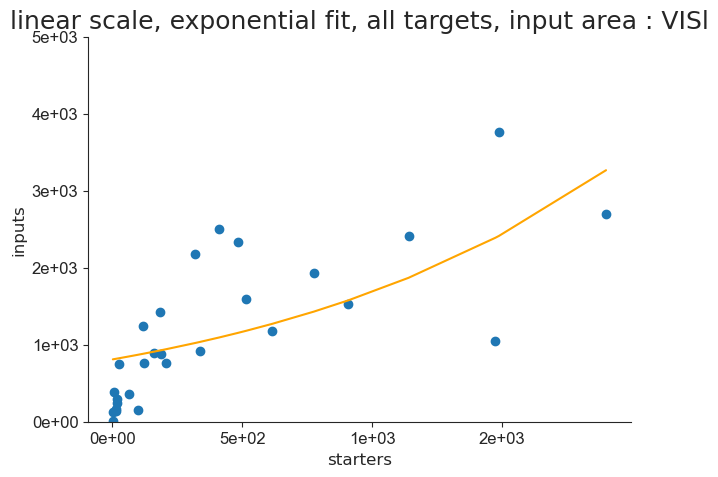

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


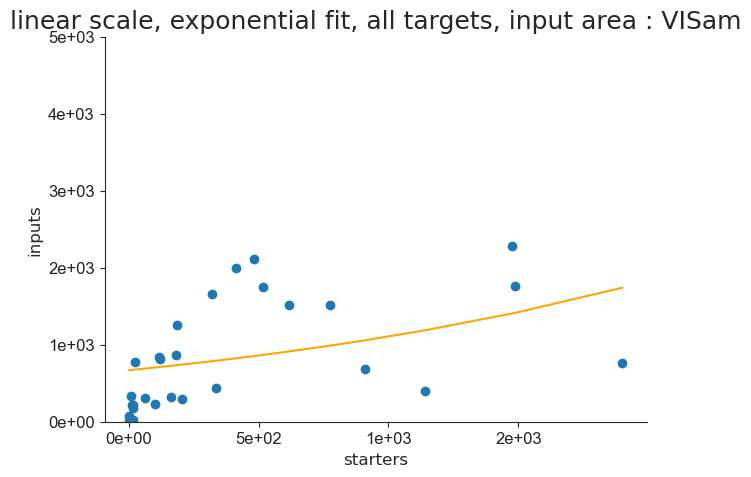

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


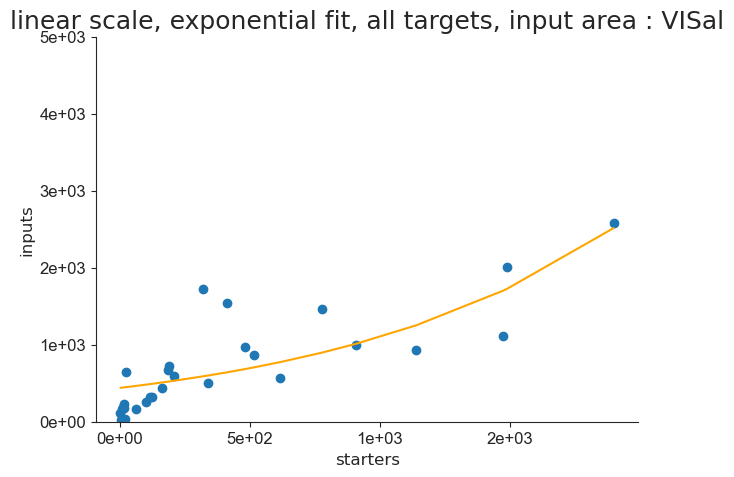

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


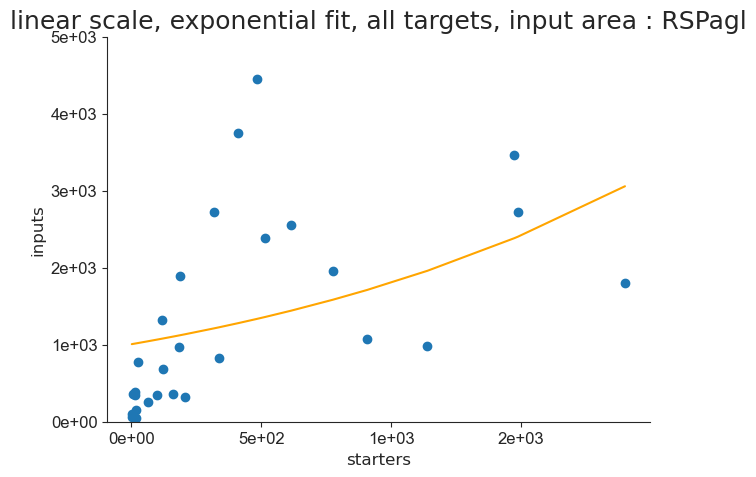

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


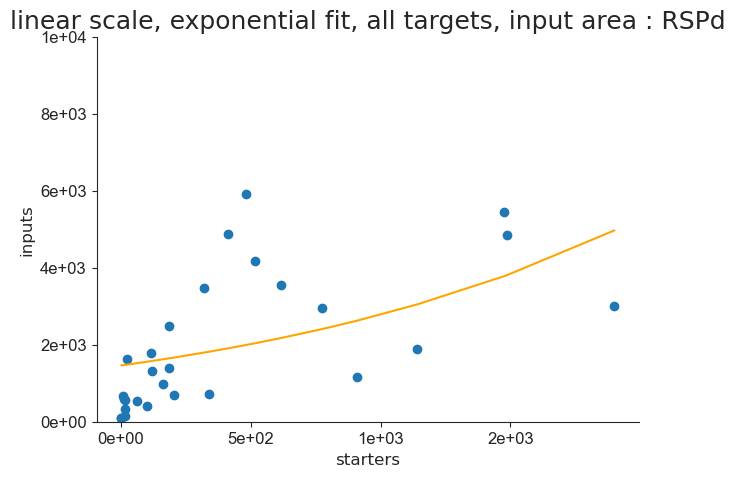

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


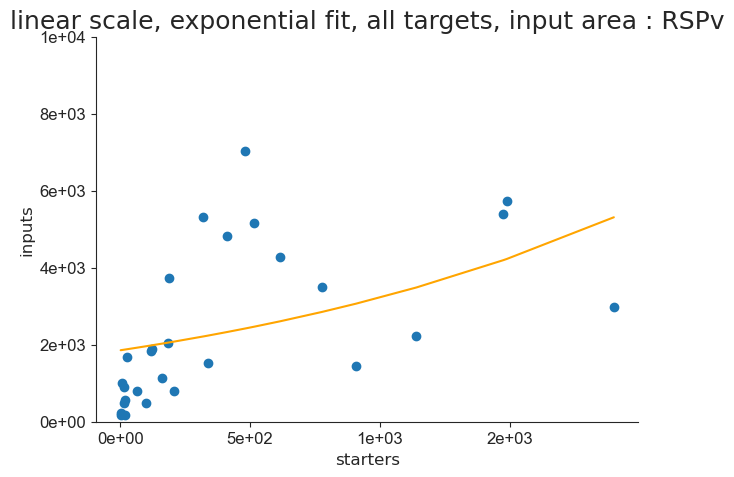

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


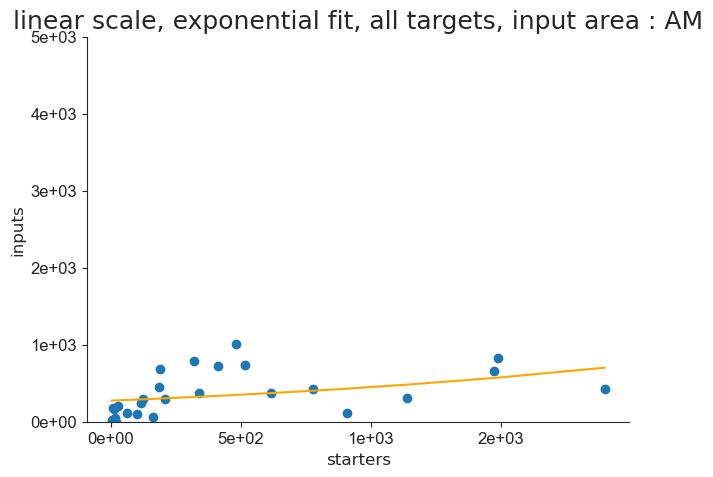

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


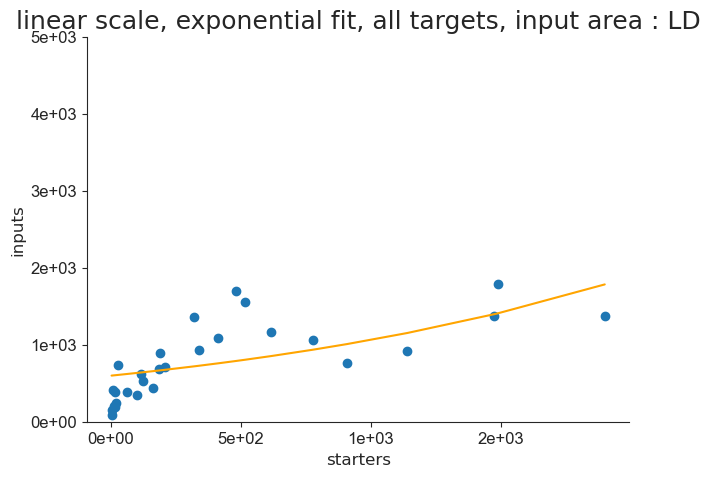

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


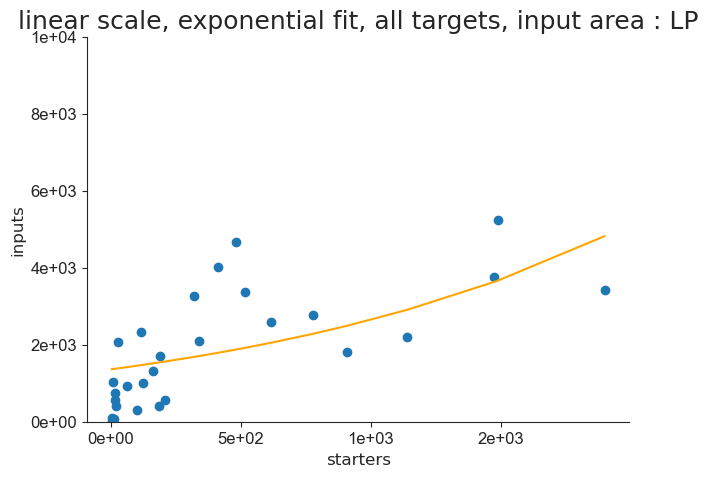

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


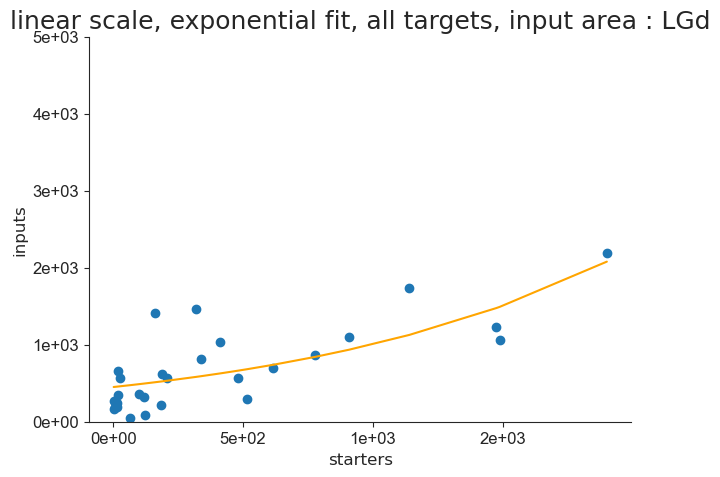

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


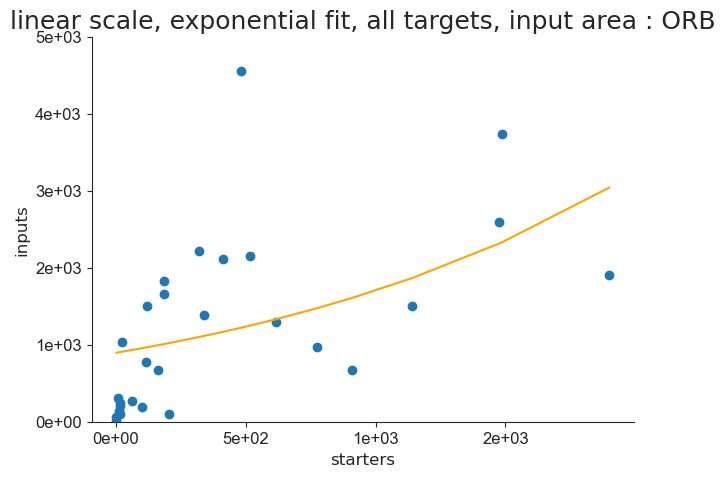

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


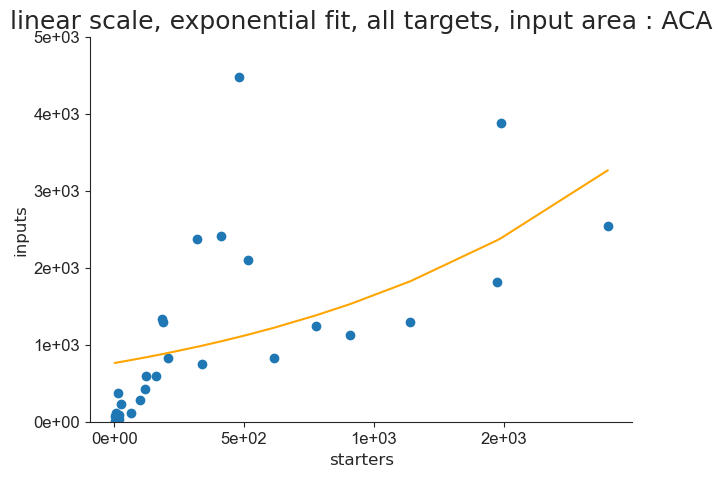

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


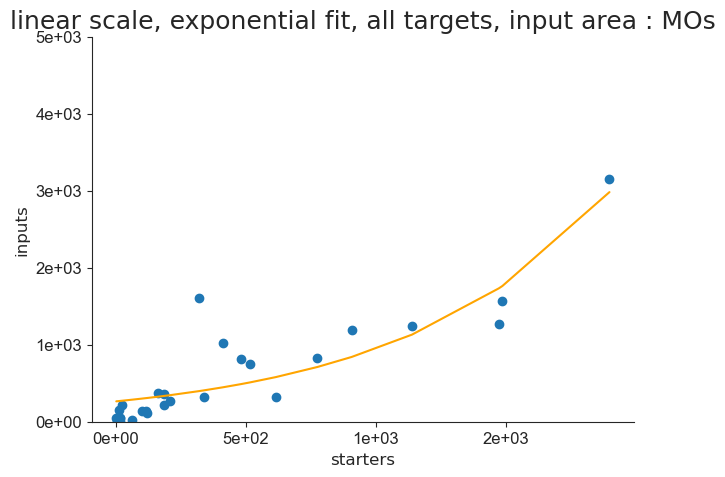

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


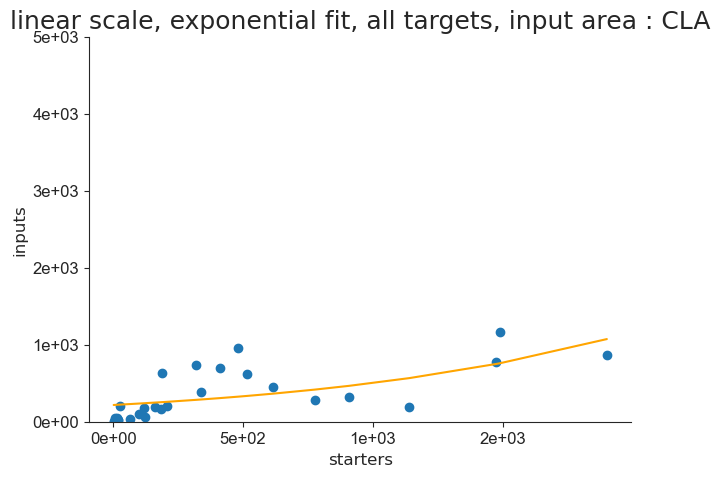

In [49]:
for area in areas:
    ymax_lin = math.ceil(df_all[area].max() / 5000.0) * 5000.0
    this_df_fit_exp, this_result_exp, this_pars_exp, this_AICc_exp, this_rsquare_exp = aicfn.fit_and_saveprms(df_all['starter'].values, df_all[area].values, area, model_exp, 'linear scale, exponential fit, all targets, input area : ' + area, 'linscale_expfit_alltargets_' + area, savepath_lin_nls, 0, ymax_lin, 1, 0)
    df_fit_exp= pd.concat([df_fit_exp, this_df_fit_exp], axis = 0).reset_index(drop = True)

## 4.4. Lognormal fit

In [50]:
df_fit_ln = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 8000
    # data points      = 28
    # variables        = 3
    chi-square         = 8735488.07
    reduced chi-square = 349419.523
    Akaike info crit   = 360.219596
    Bayesian info crit = 364.216210
    R-squared          = 0.69857057
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amplitude:  1.5079e+40 (init = 6000)
    center:     101.080298 (init = 18)
    sigma:      7.68955155 (init = 5)
    height:     68313627.0 == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       1.4162e+22 == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 362
    # data points      = 28
    # variables        = 3
    chi-square         = 5101686.13
    reduced chi-square = 204067.445
    Akaike info crit   = 345.160560
    Bayesian info crit = 349.157174
    R-squared          = 0.73769710
[[Variables]]
    amplitude:  3.8424e+09 +/- 3.4462e+10 (896.90%) (init = 6000)
    center:     15.1634502 +/- 11.0530339 (72.89%) (init = 18)
    sigma:      2.40945822 +/- 1.50908155 (62.63%) (init = 5)
    height:     3011.83864 +/- 2839.31550 (94.27%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       197094.976 +/- 1101104.13 (558.67%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.999
    C(center, sigma)     = 0.998
    C(amplitude, sigma)  = 0.995


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 657
    # data points      = 28
    # variables        = 3
    chi-square         = 3.9286e+08
    reduced chi-square = 15714299.5
    Akaike info crit   = 466.789083
    Bayesian info crit = 470.785697
    R-squared          = 0.77586137
[[Variables]]
    amplitude:  3.0032e+11 +/- 2.9941e+12 (996.98%) (init = 6000)
    center:     18.1546748 +/- 13.0509015 (71.89%) (init = 18)
    sigma:      2.86747846 +/- 1.56442568 (54.56%) (init = 5)
    height:     33265.7308 +/- 29075.1771 (87.40%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       601553.780 +/- 3575412.16 (594.36%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.999
    C(center, sigma)     = 0.999
    C(amplitude, sigma)  = 0.996


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 8000
    # data points      = 28
    # variables        = 3
    chi-square         = 12306839.4
    reduced chi-square = 492273.577
    Akaike info crit   = 369.816914
    Bayesian info crit = 373.813527
    R-squared          = 0.81886974
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amplitude:  1.4016e+26 (init = 6000)
    center:     60.6380261 (init = 18)
    sigma:      5.82951878 (init = 5)
    height:     1062998.65 == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       3.6048e+14 == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 170
    # data points      = 28
    # variables        = 3
    chi-square         = 2.9569e+08
    reduced chi-square = 11827420.3
    Akaike info cr

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1734
    # data points      = 28
    # variables        = 3
    chi-square         = 48176509.0
    reduced chi-square = 1927060.36
    Akaike info crit   = 408.028972
    Bayesian info crit = 412.025586
    R-squared          = 0.72338881
[[Variables]]
    amplitude:  1.2010e+16 +/- 4.2477e+17 (3536.83%) (init = 6000)
    center:     35.9430335 +/- 51.2432890 (142.57%) (init = 18)
    sigma:      4.72388088 +/- 4.01221754 (84.93%) (init = 5)
    height:     17455.7309 +/- 39185.3985 (224.48%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       2.1581e+08 +/- 3.9050e+09 (1809.47%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 1.000
    C(center, sigma)     = 1.000
    C(amplitude, sigma)  = 0.999
[[Model]]
    Model(lognorma

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1442
    # data points      = 28
    # variables        = 3
    chi-square         = 2.7655e+08
    reduced chi-square = 11061819.9
    Akaike info crit   = 456.959079
    Bayesian info crit = 460.955693
    R-squared          = 0.74465721
[[Variables]]
    amplitude:  1.2474e+15 +/- 4.9246e+16 (3947.80%) (init = 6000)
    center:     28.7999659 +/- 50.9057973 (176.76%) (init = 18)
    sigma:      3.86281713 +/- 4.35150685 (112.65%) (init = 5)
    height:     69580.5650 +/- 297233.049 (427.18%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       1.0060e+08 +/- 2.2569e+09 (2243.59%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 1.000
    C(center, sigma)     = 1.000
    C(amplitude, sigma)  = 0.999


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 8000
    # data points      = 28
    # variables        = 3
    chi-square         = 1.5455e+08
    reduced chi-square = 6181916.81
    Akaike info crit   = 440.666687
    Bayesian info crit = 444.663301
    R-squared          = 0.79169479
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amplitude:  1.1072e+28 (init = 6000)
    center:     66.7274123 (init = 18)
    sigma:      6.26849247 (init = 5)
    height:     2518988.03 == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       1.3168e+15 == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 286
    # data points      = 28
    # variables        = 3
    chi-square         = 14643012.2
    reduced chi-square = 585720.488
    Akaike info cr

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 593
    # data points      = 28
    # variables        = 3
    chi-square         = 7893059.66
    reduced chi-square = 315722.386
    Akaike info crit   = 357.380117
    Bayesian info crit = 361.376731
    R-squared          = 0.68341649
[[Variables]]
    amplitude:  6.0525e+10 +/- 7.5737e+11 (1251.33%) (init = 6000)
    center:     19.4119234 +/- 17.0434439 (87.80%) (init = 18)
    sigma:      3.08866433 +/- 1.97117162 (63.82%) (init = 5)
    height:     3420.87634 +/- 3210.34637 (93.85%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       735279.716 +/- 5307709.12 (721.86%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.999
    C(center, sigma)     = 0.999
    C(amplitude, sigma)  = 0.996
[[Model]]
    Model(lognormal)
[

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 8000
    # data points      = 28
    # variables        = 3
    chi-square         = 3443905.22
    reduced chi-square = 137756.209
    Akaike info crit   = 334.157539
    Bayesian info crit = 338.154153
    R-squared          = 0.69280940
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amplitude:  3.9400e+38 (init = 6000)
    center:     102.844387 (init = 18)
    sigma:      8.01046442 (init = 5)
    height:     3645901.76 == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       7.8205e+20 == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 304
    # data points      = 28
    # variables        = 3
    chi-square         = 18513110.0
    reduced chi-square = 740524.399
    Akaike info cr

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 171
    # data points      = 28
    # variables        = 3
    chi-square         = 38068993.5
    reduced chi-square = 1522759.74
    Akaike info crit   = 401.435773
    Bayesian info crit = 405.432387
    R-squared          = 0.55311435
[[Variables]]
    amplitude:  47991240.2 +/- 77392135.8 (161.26%) (init = 6000)
    center:     9.26586668 +/- 2.03818041 (22.00%) (init = 18)
    sigma:      1.50970517 +/- 0.51057687 (33.82%) (init = 5)
    height:     3749.63699 +/- 445.674002 (11.89%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       6218.00052 +/- 7154.56940 (115.06%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.995
    C(center, sigma)     = 0.989
    C(amplitude, sigma)  = 0.972
[[Model]]
    Model(lognormal)
[[

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 167
    # data points      = 28
    # variables        = 3
    chi-square         = 1107240.47
    reduced chi-square = 44289.6188
    Akaike info crit   = 302.384953
    Bayesian info crit = 306.381567
    R-squared          = 0.51467117
[[Variables]]
    amplitude:  3041745.65 +/- 2551123.86 (83.87%) (init = 6000)
    center:     8.21682489 +/- 1.09761406 (13.36%) (init = 18)
    sigma:      1.34364920 +/- 0.34529866 (25.70%) (init = 5)
    height:     601.535830 +/- 75.5177857 (12.55%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       2836.38291 +/- 1792.09346 (63.18%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.988
    C(center, sigma)     = 0.977
    C(amplitude, sigma)  = 0.944


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 712
    # data points      = 28
    # variables        = 3
    chi-square         = 1873291.10
    reduced chi-square = 74931.6439
    Akaike info crit   = 317.108081
    Bayesian info crit = 321.104694
    R-squared          = 0.71383415
[[Variables]]
    amplitude:  3.6456e+11 +/- 4.3636e+12 (1196.95%) (init = 6000)
    center:     23.9045674 +/- 17.7153734 (74.11%) (init = 18)
    sigma:      3.74126373 +/- 1.82047872 (48.66%) (init = 5)
    height:     1767.90383 +/- 1048.75648 (59.32%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       1643543.70 +/- 10304837.1 (626.99%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.999
    C(center, sigma)     = 0.999
    C(amplitude, sigma)  = 0.997


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 841
    # data points      = 28
    # variables        = 3
    chi-square         = 23179553.6
    reduced chi-square = 927182.142
    Akaike info crit   = 387.544146
    Bayesian info crit = 391.540759
    R-squared          = 0.61142087
[[Variables]]
    amplitude:  1.8349e+12 +/- 3.7306e+13 (2033.13%) (init = 6000)
    center:     23.9576928 +/- 28.6676206 (119.66%) (init = 18)
    sigma:      3.63261399 +/- 2.88555794 (79.43%) (init = 5)
    height:     5821.88210 +/- 7986.27255 (137.18%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       3397980.37 +/- 37852002.9 (1113.96%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.999
    C(center, sigma)     = 0.999
    C(amplitude, sigma)  = 0.997


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 8000
    # data points      = 28
    # variables        = 3
    chi-square         = 3482263.00
    reduced chi-square = 139290.520
    Akaike info crit   = 334.467676
    Bayesian info crit = 338.464289
    R-squared          = 0.55974303
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amplitude:  1.0348e+45 (init = 6000)
    center:     129.858021 (init = 18)
    sigma:      9.34837591 (init = 5)
    height:     1680247.80 == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       1.6708e+23 == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 259
    # data points      = 28
    # variables        = 3
    chi-square         = 18523276.9
    reduced chi-square = 740931.076
    Akaike info cr

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 183
    # data points      = 28
    # variables        = 3
    chi-square         = 16790571.6
    reduced chi-square = 671622.864
    Akaike info crit   = 378.515460
    Bayesian info crit = 382.512073
    R-squared          = 0.54259492
[[Variables]]
    amplitude:  50423796.2 +/- 1.2868e+08 (255.20%) (init = 6000)
    center:     9.94411155 +/- 3.23532337 (32.54%) (init = 18)
    sigma:      1.64538253 +/- 0.72432086 (44.02%) (init = 5)
    height:     2272.40182 +/- 354.060712 (15.58%) == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       9444.01157 +/- 16637.4392 (176.17%) == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Correlations]] (unreported correlations are < 0.100)
    C(amplitude, center) = 0.996
    C(center, sigma)     = 0.992
    C(amplitude, sigma)  = 0.980


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 8000
    # data points      = 28
    # variables        = 3
    chi-square         = 3143799.62
    reduced chi-square = 125751.985
    Akaike info crit   = 331.604669
    Bayesian info crit = 335.601283
    R-squared          = 0.77147388
##  Warning: uncertainties could not be estimated:
[[Variables]]
    amplitude:  4.5900e+41 (init = 6000)
    center:     90.7281228 (init = 18)
    sigma:      6.66747683 (init = 5)
    height:     4.8908e+10 == 'amplitude/max(1e-15, (sigma*sqrt(2*pi)))*exp(sigma**2/2-center)'
    fwhm:       3.2020e+23 == 'exp(center-sigma**2+sigma*sqrt(2*log(2)))-exp(center-sigma**2-sigma*sqrt(2*log(2)))'
[[Model]]
    Model(lognormal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 293
    # data points      = 28
    # variables        = 3
    chi-square         = 1266318.66
    reduced chi-square = 50652.7465
    Akaike info cr

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

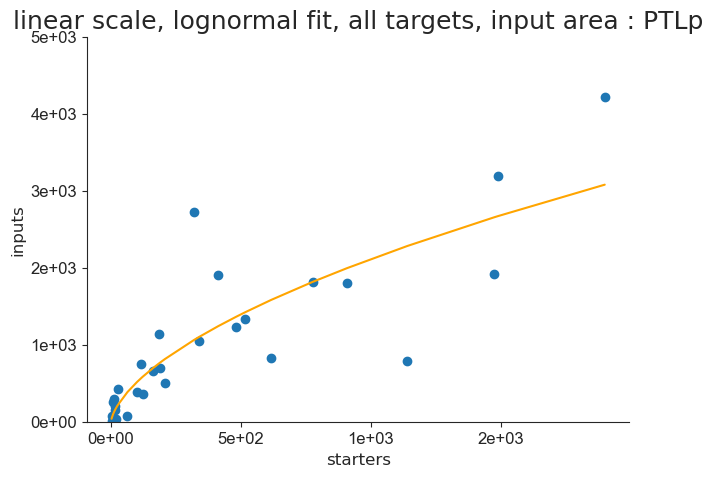

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


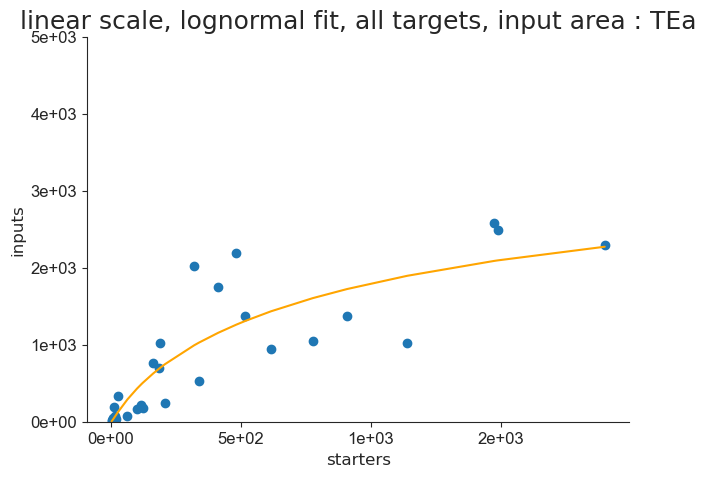

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


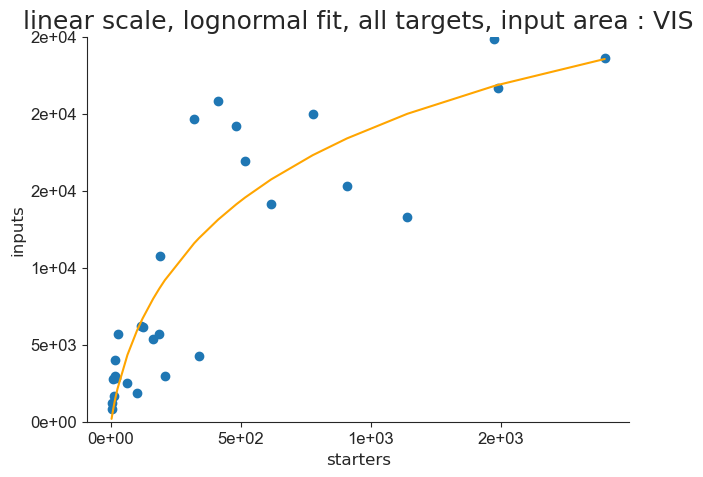

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


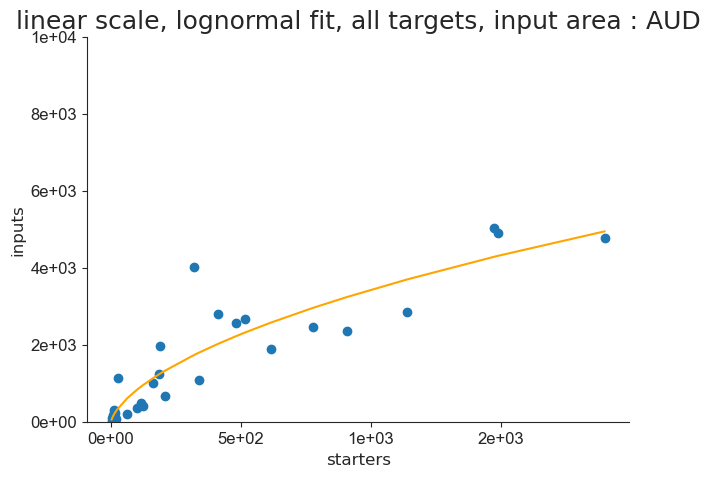

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


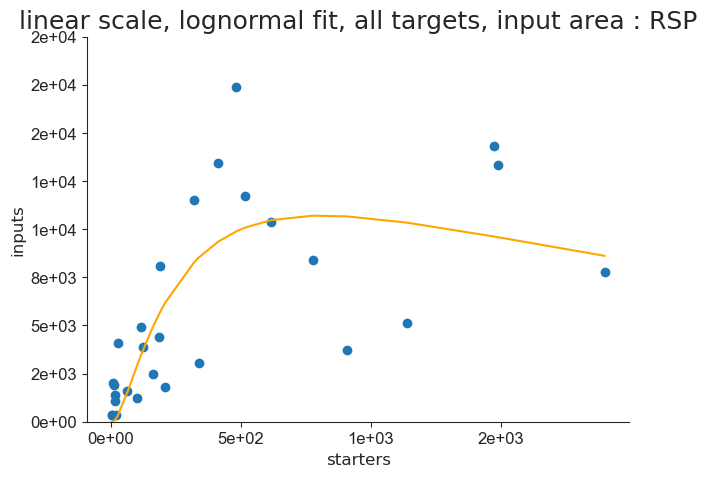

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


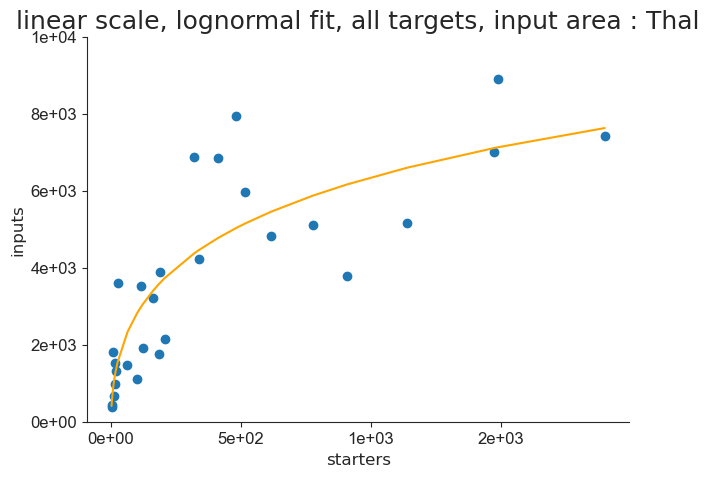

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


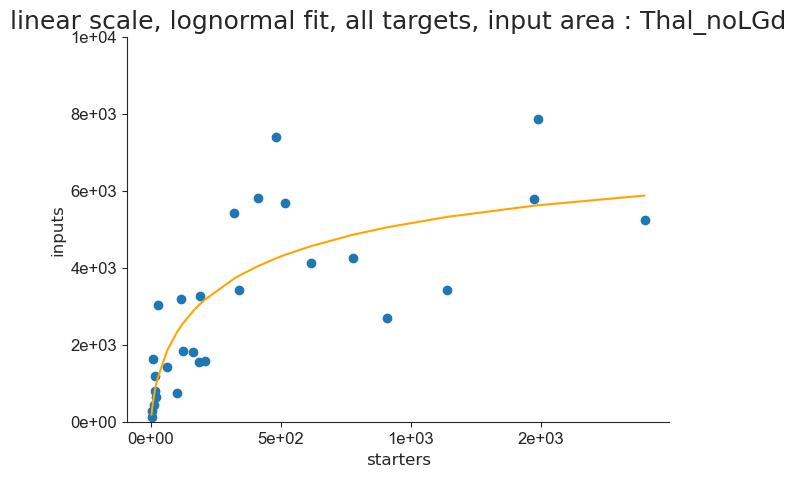

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


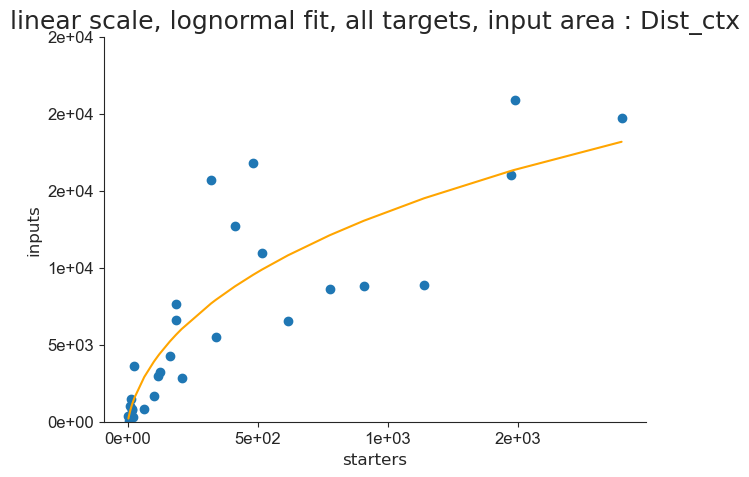

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


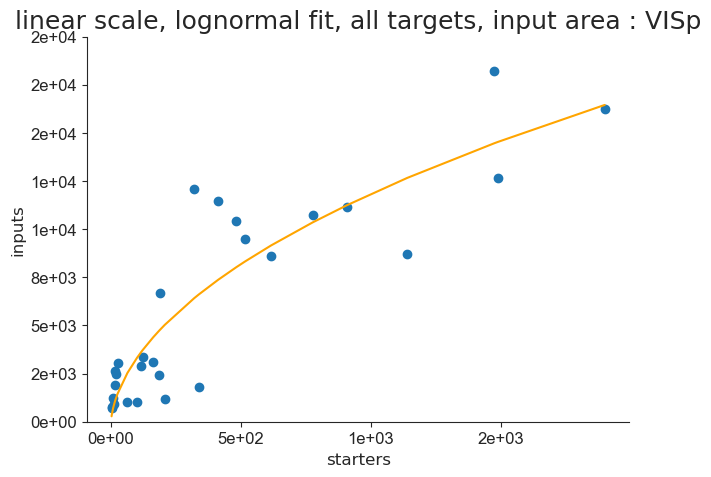

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


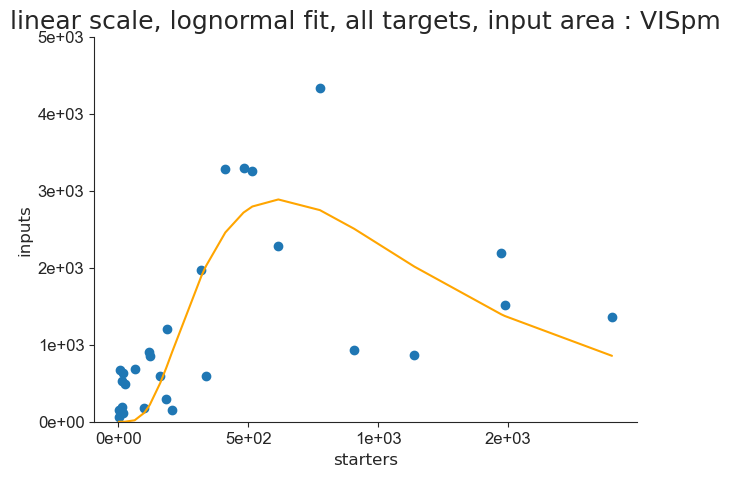

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


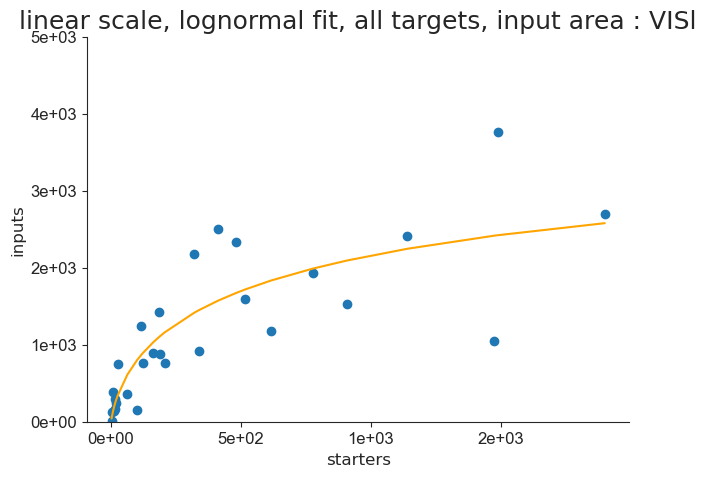

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


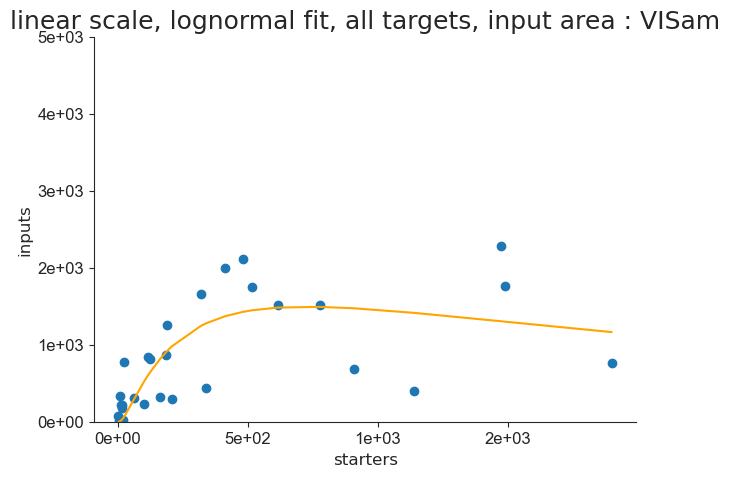

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


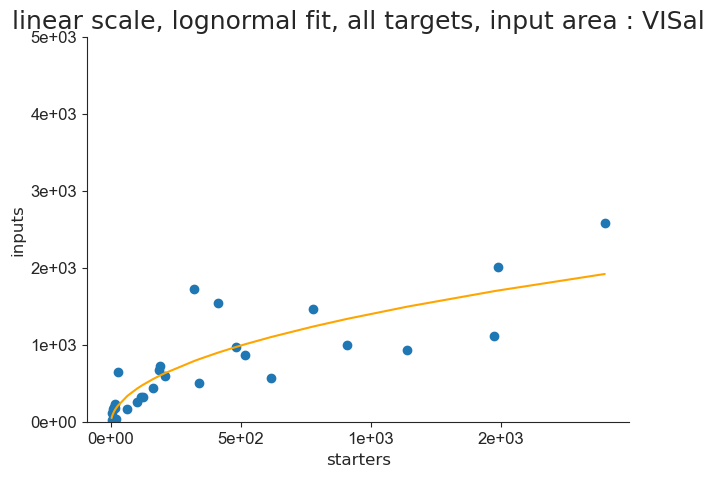

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


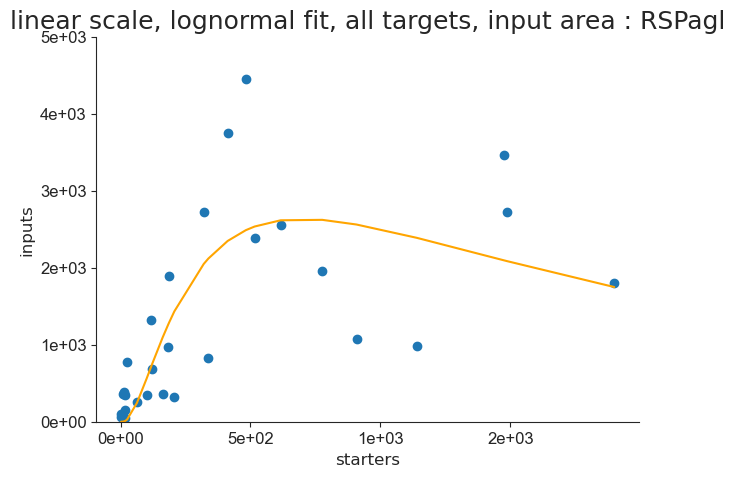

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


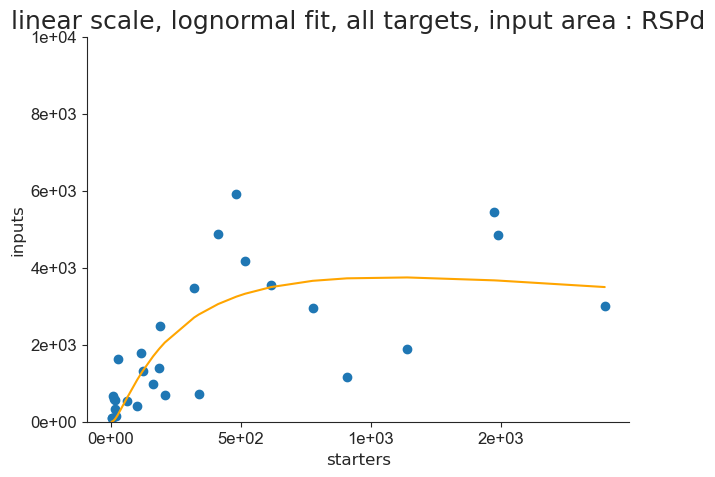

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


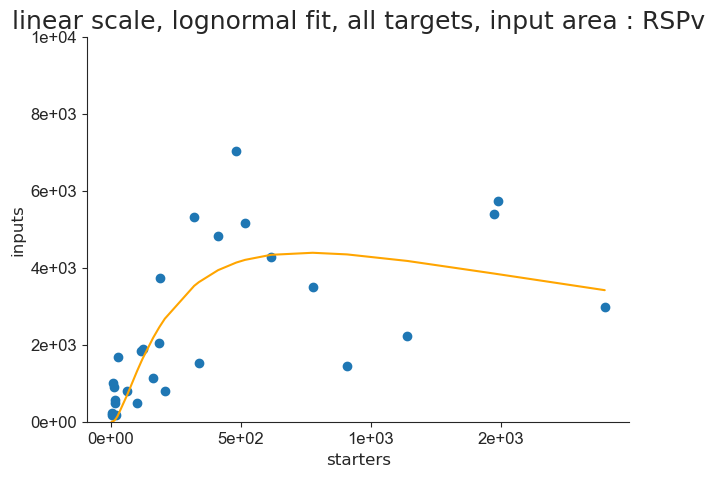

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


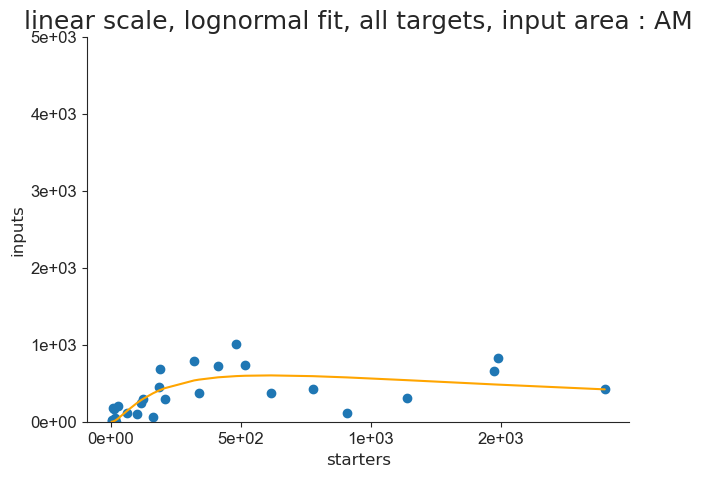

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


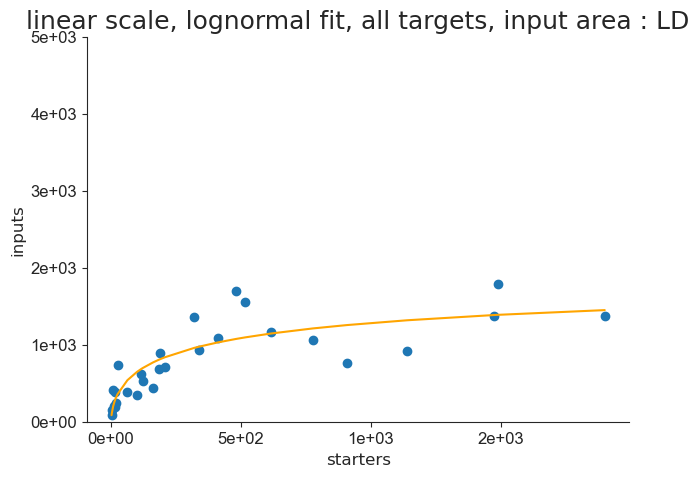

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


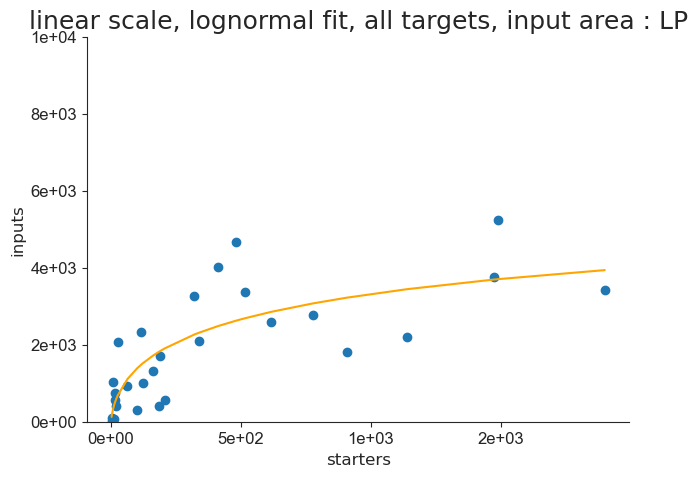

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


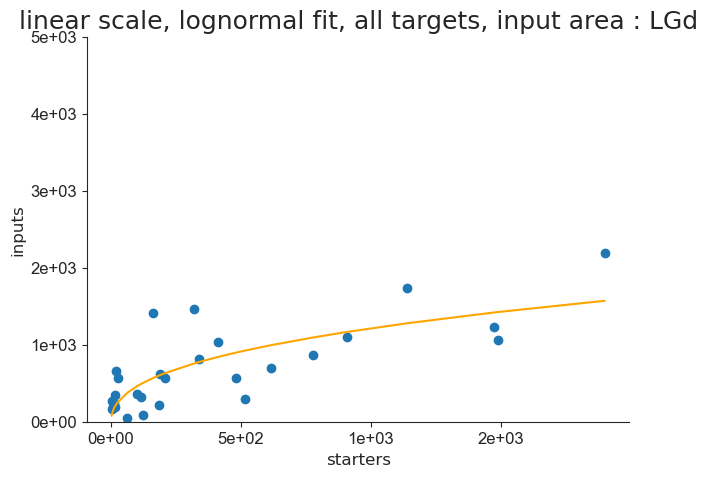

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


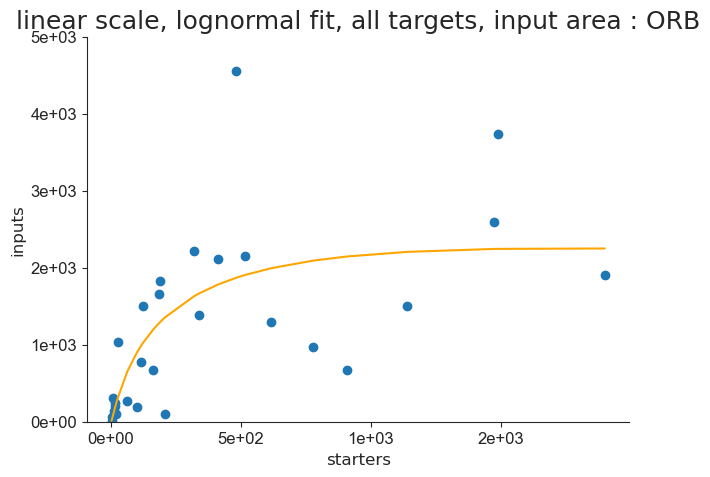

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


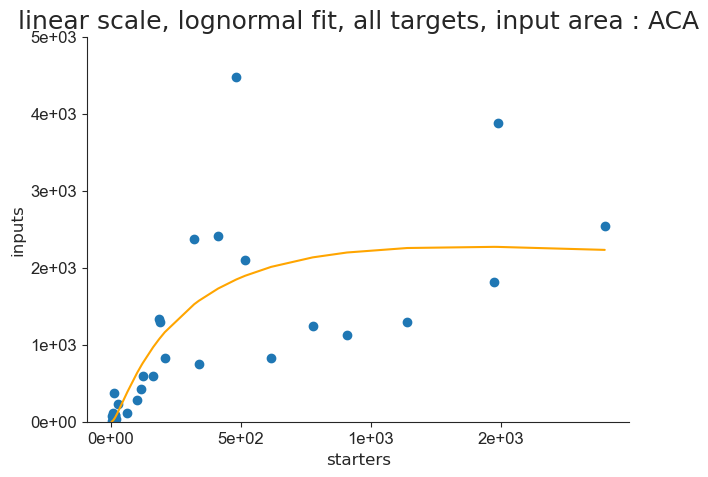

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


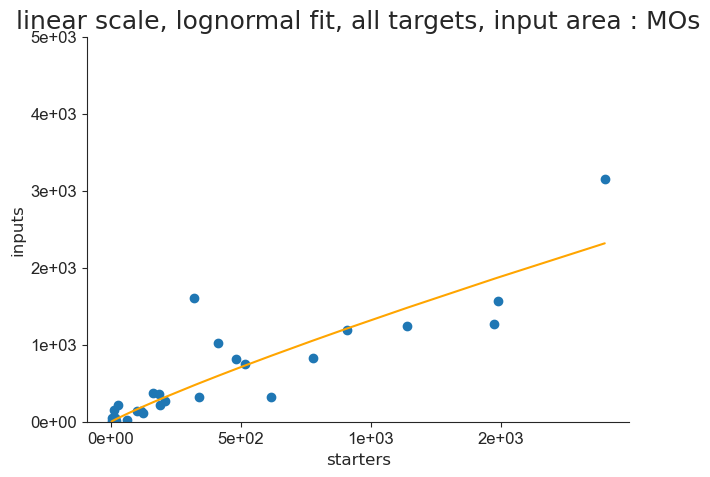

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


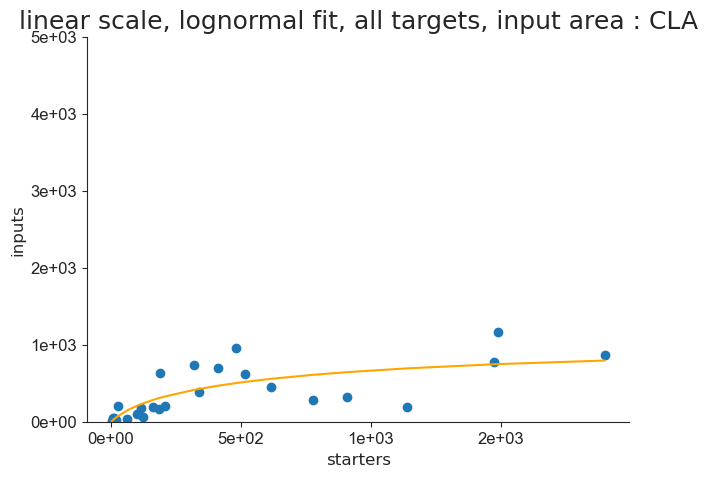

In [51]:
for area in areas:
    ymax_lin = math.ceil(df_all[area].max() / 5000.0) * 5000.0
    this_df_fit_ln, this_result_ln, this_pars_ln, this_AICc_ln, this_rsquare_ln = aicfn.fit_and_saveprms(df_all['starter'].values, df_all[area].values, area, model_ln, 'linear scale, lognormal fit, all targets, input area : ' + area, 'linscale_lnfit_alltargets_' + area, savepath_lin_nls, 0, ymax_lin, 0, 0)
    df_fit_ln = pd.concat([df_fit_ln, this_df_fit_ln], axis = 0).reset_index(drop = True)

## 4.5 Quadratic fit

In [52]:
df_fit_quad = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 8988278.16
    reduced chi-square = 359531.126
    Akaike info crit   = 361.018366
    Bayesian info crit = 365.014979
    R-squared          = 0.68984772
[[Variables]]
    a:  4.7689e-05 +/- 4.3165e-04 (905.13%) (init = 4.768925e-05)
    b:  1.57315838 +/- 0.71942378 (45.73%) (init = 1.573158)
    c:  356.606264 +/- 174.748878 (49.00%) (init = 356.6063)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 5714259.97
    reduced chi-square = 228570.399
    Akaike info crit   = 348.335584
    Bayesian info crit = 352.332197
    R-squared          = 0.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 4.1557e+08
    reduced chi-square = 16622742.2
    Akaike info crit   = 468.362702
    Bayesian info crit = 472.359316
    R-squared          = 0.76290393
[[Variables]]
    a: -0.00904087 +/- 0.00293504 (32.46%) (init = -0.009040871)
    b:  27.0044230 +/- 4.89179069 (18.11%) (init = 27.00442)
    c:  2632.57784 +/- 1188.22172 (45.14%) (init = 2632.578)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 13374215.2
    reduced chi-square = 534968.608
    Akaike info crit   = 372.145771
    Bayesian info crit = 376.142384
    R-squared          = 0.8

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3.3244e+08
    reduced chi-square = 13297681.9
    Akaike info crit   = 462.113605
    Bayesian info crit = 466.110218
    R-squared          = 0.50669349
[[Variables]]
    a: -0.00777213 +/- 0.00262513 (33.78%) (init = -0.007772129)
    b:  17.8573203 +/- 4.37526635 (24.50%) (init = 17.85732)
    c:  1690.12282 +/- 1062.75735 (62.88%) (init = 1690.123)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 56329945.7
    reduced chi-square = 2253197.83
    Akaike info crit   = 412.406905
    Bayesian info crit = 416.403519
    R-squared          = 0.6

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 53305439.7
    reduced chi-square = 2132217.59
    Akaike info crit   = 410.861644
    Bayesian info crit = 414.858258
    R-squared          = 0.59664510
[[Variables]]
    a: -0.00290723 +/- 0.00105118 (36.16%) (init = -0.00290723)
    b:  7.52739516 +/- 1.75199272 (23.27%) (init = 7.527395)
    c:  1160.92524 +/- 425.561091 (36.66%) (init = 1160.925)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 28
    # variables        = 3
    chi-square         = 3.1902e+08
    reduced chi-square = 12760720.2
    Akaike info crit   = 460.959501
    Bayesian info crit = 464.956114
    R-squared          = 0.70544106
[[Variables]]
    a: -0.00407640 +/- 0.00257158 (63.08%) (init = -0.004076405)
    b:  16.4428160 +/- 4.28601938 (26.07%) (init = 16.44282)
    c:  1726.16750 +/- 1041.07914 (60.31%) (init = 1726.167)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.5596e+08
    reduced chi-square = 6238470.30
    Akaike info crit   = 440.921673
    Bayesian info crit = 444.918286
    R-squared          = 0.78978917
[[Variables]]
    a: -0.00425472 +/- 0.00179805 (42.26%) (init = -0.004254724)
    b:  15.4051691 +/- 2.99678505 (19.45%) (init = 15.40517)
    c:  1425.53610 +/- 727.922603 (51.06%) (init = 1425.536)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 18702840.2
    reduced chi-square = 748113.607
    Akaike info crit   = 381.535480
    Bayesian info crit = 385.532094
    R-squared          = 0.48322537
[[Variables]]
    a: -0.00238538 +/- 6.2265e-04 (26.10%) (init = -0.002385378)
    b:  4.72410294 +/- 1.03776808 (21.97%) (init = 4.724103)
    c:  277.162858 +/- 252.075088 (90.95%) (init = 277.1629)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 8987030.32
    reduced chi-square = 359481.213
    Akaike info crit   = 361.014478
    Bayesian info crit = 365.011092
    R-squared          = 0.63953831
[[Variables]]
    a: -0.00103118 +/- 4.3162e-04 (41.86%) (init = -0.001031181)
    b:  3.01008181 +/- 0.71937383 (23.90%) (init = 3.010082)
    c:  367.037530 +/- 174.736749 (47.61%) (init = 367.0375)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 7065045.96
    reduced chi-square = 282601.839
    Akaike info crit   = 354.277036
    Bayesian info crit = 358.273649
    R-squared          = 0.47717401
[[Variables]]
    a: -0.00124895 +/- 3.8269e-04 (30.64%) (init = -0.001248951)
    b:  2.66466449 +/- 0.63782866 (23.94%) (init = 2.664664)
    c:  281.247306 +/- 154.929330 (55.09%) (init = 281.2473)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3696515.43
    reduced chi-square = 147860.617
    Akaike info crit   = 336.139506
    Bayesian info crit = 340.136120
    R-squared          = 0.6

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 21913149.1
    reduced chi-square = 876525.963
    Akaike info crit   = 385.971002
    Bayesian info crit = 389.967615
    R-squared          = 0.47803532
[[Variables]]
    a: -0.00201980 +/- 6.7398e-04 (33.37%) (init = -0.002019802)
    b:  4.49138104 +/- 1.12330817 (25.01%) (init = 4.491381)
    c:  339.159083 +/- 272.852879 (80.45%) (init = 339.1591)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 40966407.8
    reduced chi-square = 1638656.31
    Akaike info crit   = 403.489637
    Bayesian info crit = 407.486250
    R-squared          = 0.5

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 55026037.7
    reduced chi-square = 2201041.51
    Akaike info crit   = 411.751151
    Bayesian info crit = 415.747764
    R-squared          = 0.49776954
[[Variables]]
    a: -0.00328743 +/- 0.00106801 (32.49%) (init = -0.003287429)
    b:  7.35425144 +/- 1.78004368 (24.20%) (init = 7.354251)
    c:  783.060501 +/- 432.374699 (55.22%) (init = 783.0605)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1408563.90
    reduced chi-square = 56342.5559
    Akaike info crit   = 309.124548
    Bayesian info crit = 313.121162
    R-squared          = 0.3

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2295152.78
    reduced chi-square = 91806.1113
    Akaike info crit   = 322.794953
    Bayesian info crit = 326.791566
    R-squared          = 0.64939013
[[Variables]]
    a: -6.8261e-04 +/- 2.1812e-04 (31.95%) (init = -0.0006826102)
    b:  1.75781687 +/- 0.36354011 (20.68%) (init = 1.757817)
    c:  356.673744 +/- 88.3043195 (24.76%) (init = 356.6737)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 24681975.6
    reduced chi-square = 987279.024
    Akaike info crit   = 389.302620
    Bayesian info crit = 393.299234
    R-squared          = 0.

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3288603.20
    reduced chi-square = 131544.128
    Akaike info crit   = 332.865531
    Bayesian info crit = 336.862144
    R-squared          = 0.58422713
[[Variables]]
    a: -3.3338e-05 +/- 2.6110e-04 (783.18%) (init = -3.33379e-05)
    b:  0.84547417 +/- 0.43516329 (51.47%) (init = 0.8454742)
    c:  355.013383 +/- 105.701680 (29.77%) (init = 355.0134)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 20745118.8
    reduced chi-square = 829804.754
    Akaike info crit   = 384.437277
    Bayesian info crit = 388.433890
    R-squared          = 0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 19230143.6
    reduced chi-square = 769205.742
    Akaike info crit   = 382.313982
    Bayesian info crit = 386.310596
    R-squared          = 0.47613664
[[Variables]]
    a: -0.00118170 +/- 6.3137e-04 (53.43%) (init = -0.001181699)
    b:  3.29217354 +/- 1.05229570 (31.96%) (init = 3.292174)
    c:  265.807163 +/- 255.603860 (96.16%) (init = 265.8072)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2931671.11
    reduced chi-square = 117266.844
    Akaike info crit   = 329.648602
    Bayesian info crit = 333.645216
    R-squared          = 0.7

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1445072.84
    reduced chi-square = 57802.9137
    Akaike info crit   = 309.841042
    Bayesian info crit = 313.837655
    R-squared          = 0.53132963
[[Variables]]
    a: -2.3478e-04 +/- 1.7308e-04 (73.72%) (init = -0.000234783)
    b:  0.82882510 +/- 0.28846386 (34.80%) (init = 0.8288251)
    c:  94.3307412 +/- 70.0682096 (74.28%) (init = 94.33074)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.952
    C(b, c) = -0.686
    C(a, c) = 0.551


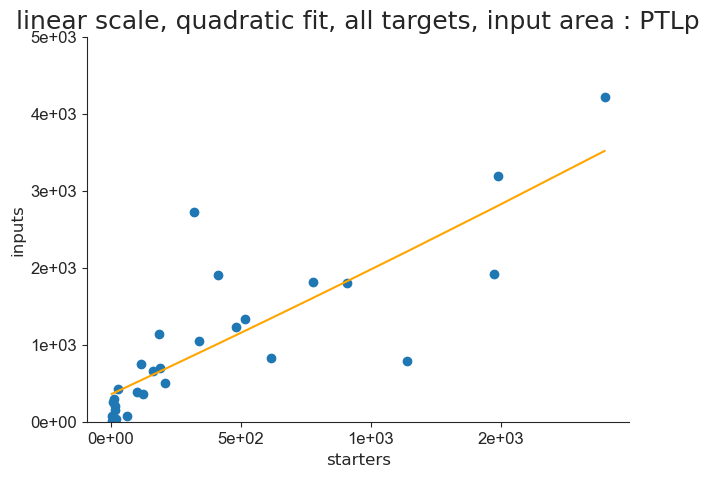

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


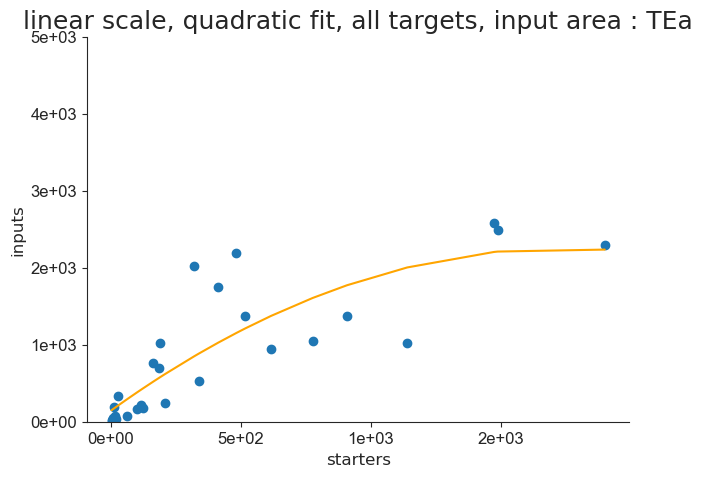

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


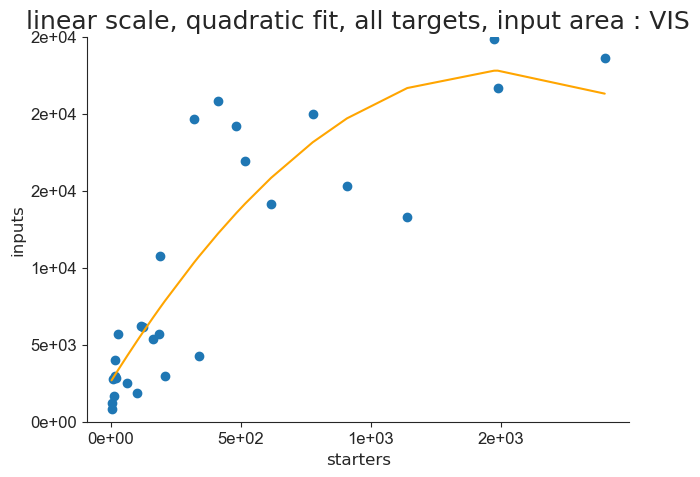

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


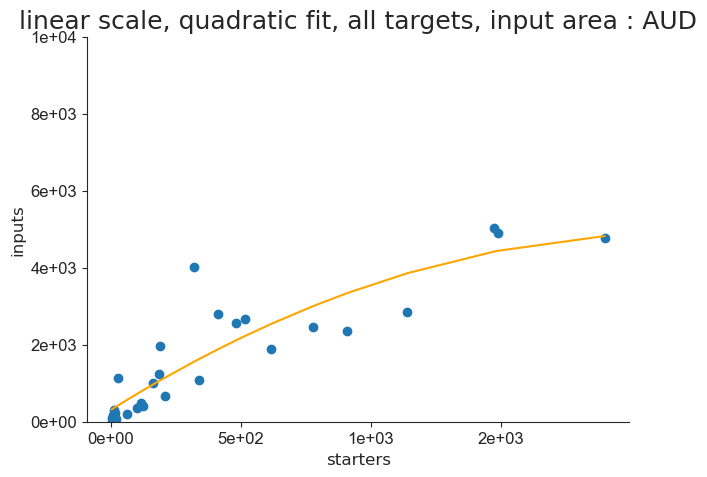

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


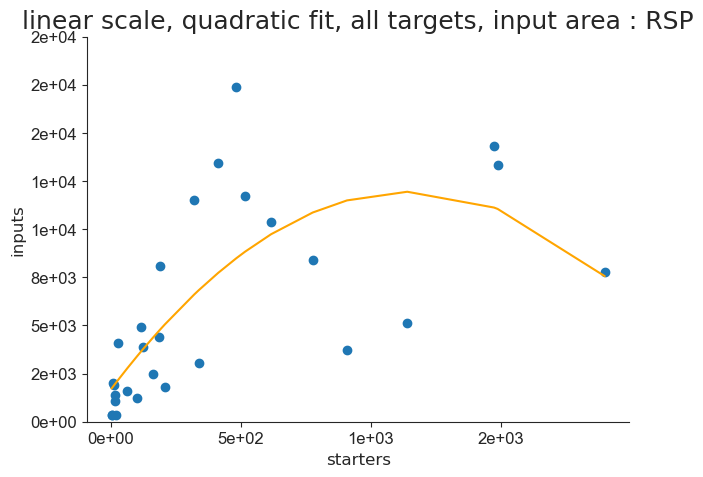

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


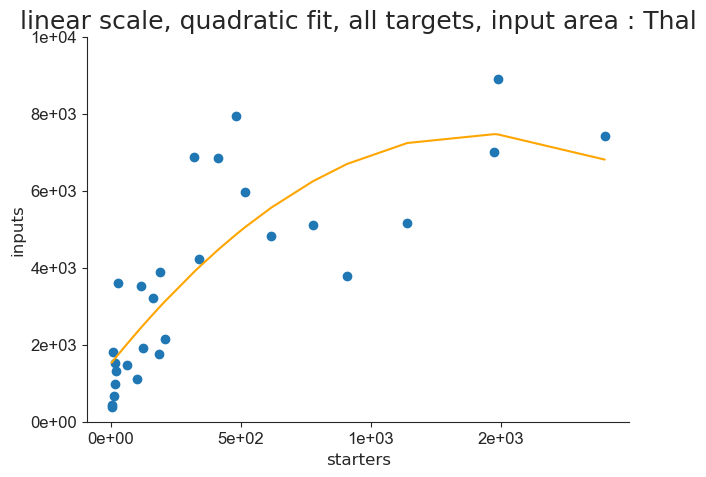

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


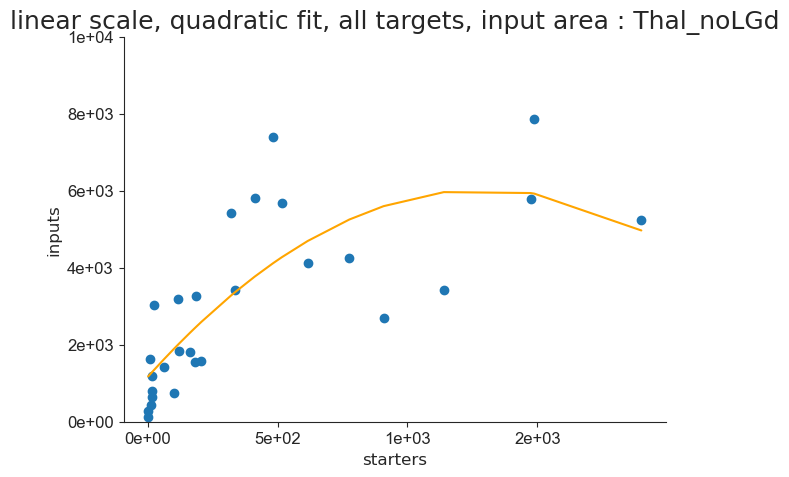

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


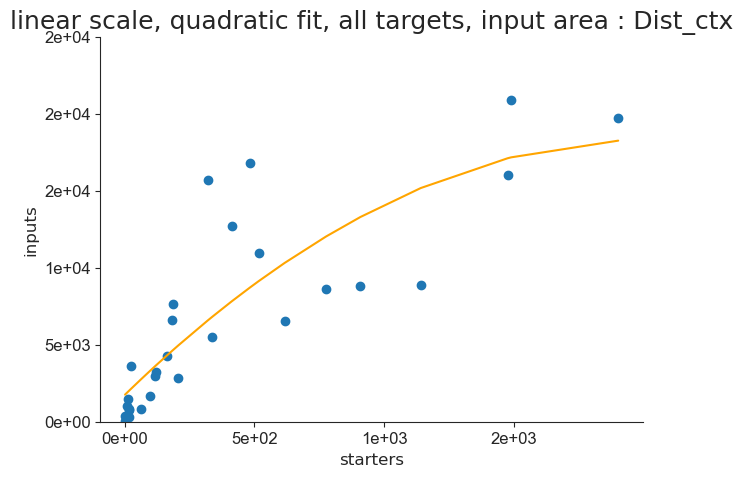

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


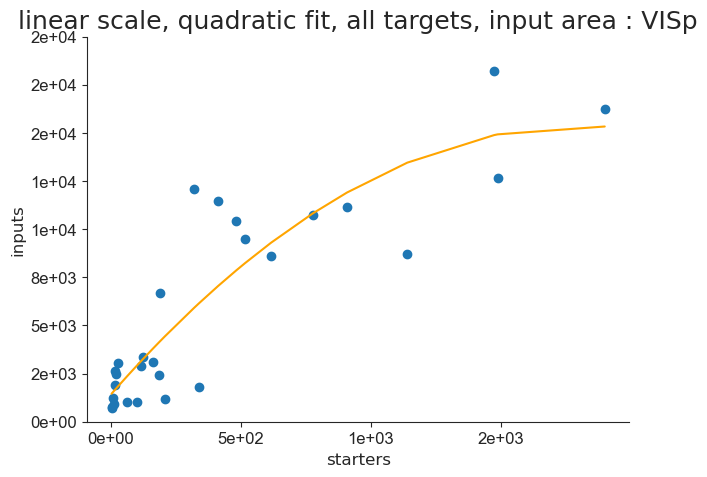

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


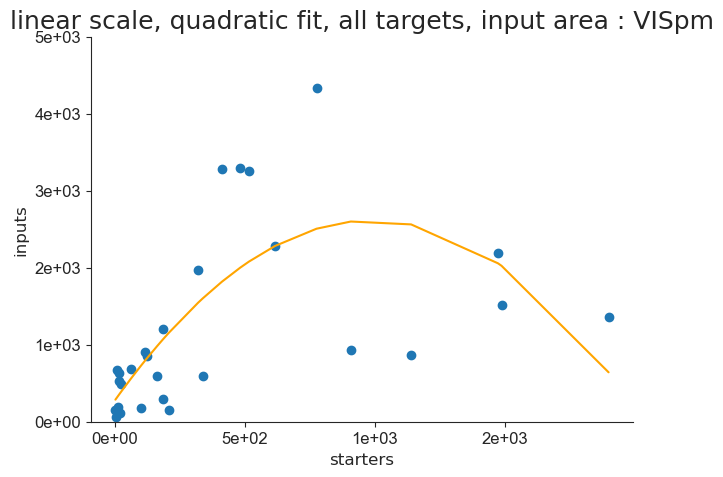

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


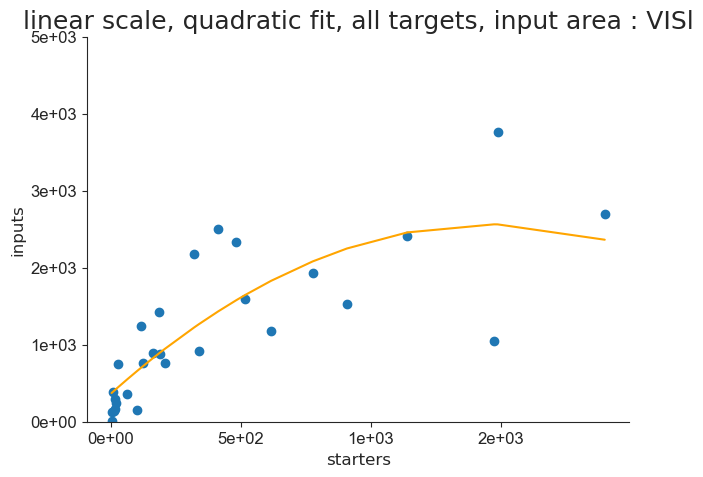

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


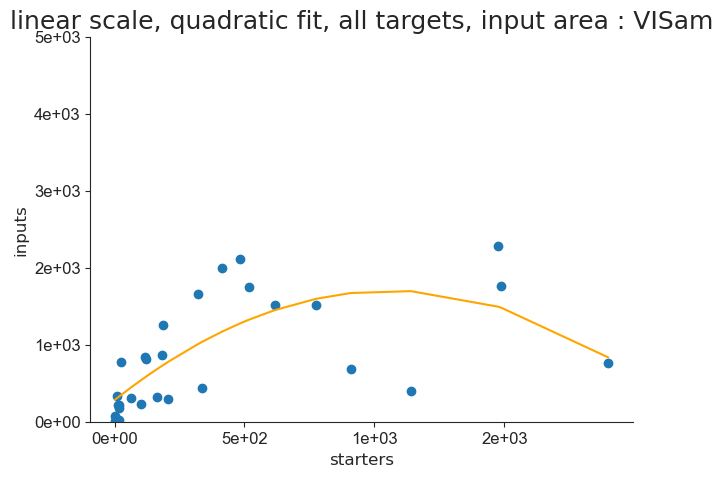

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


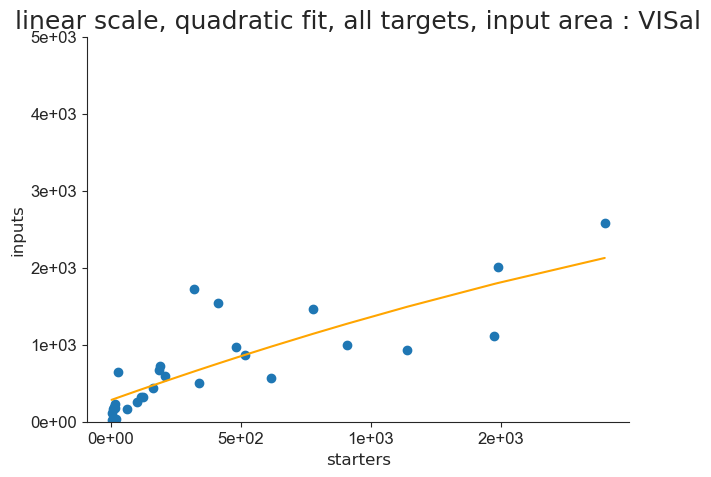

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


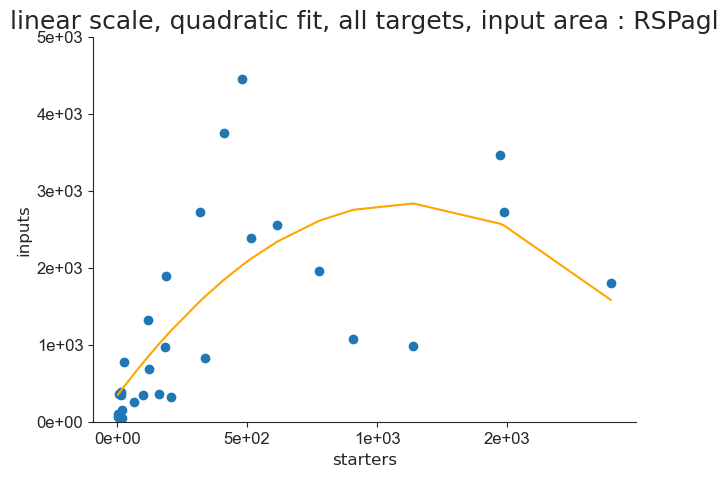

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


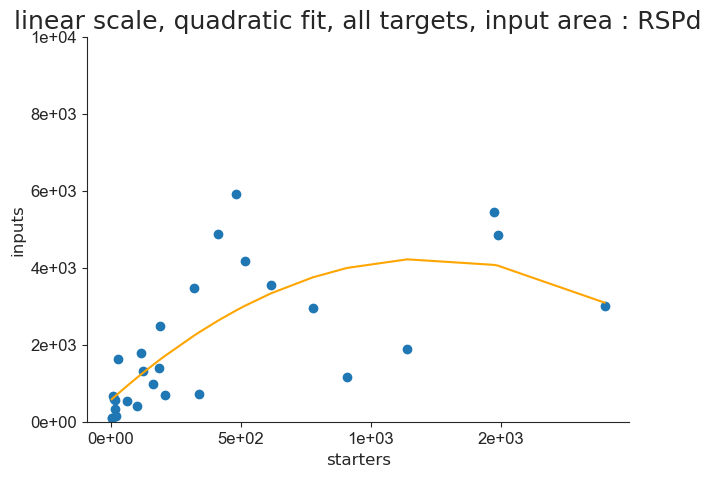

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


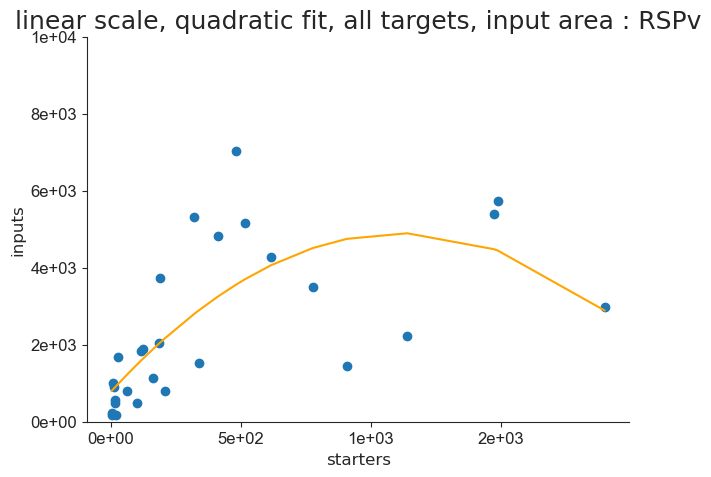

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


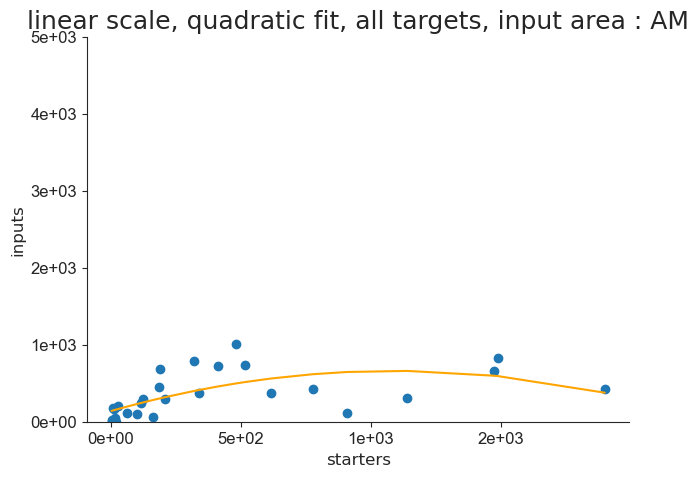

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


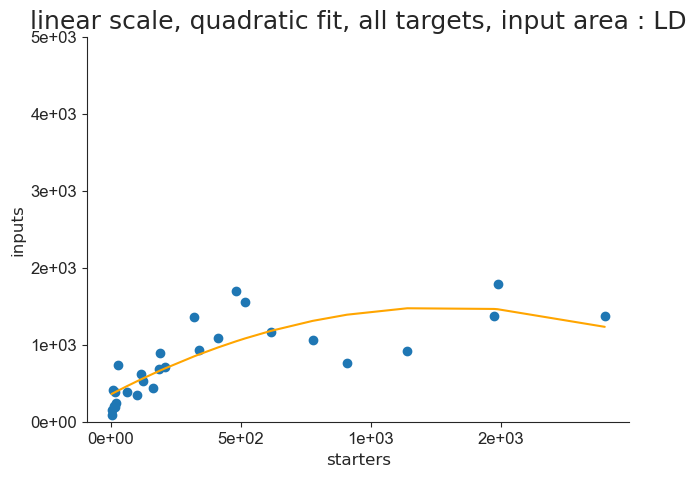

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


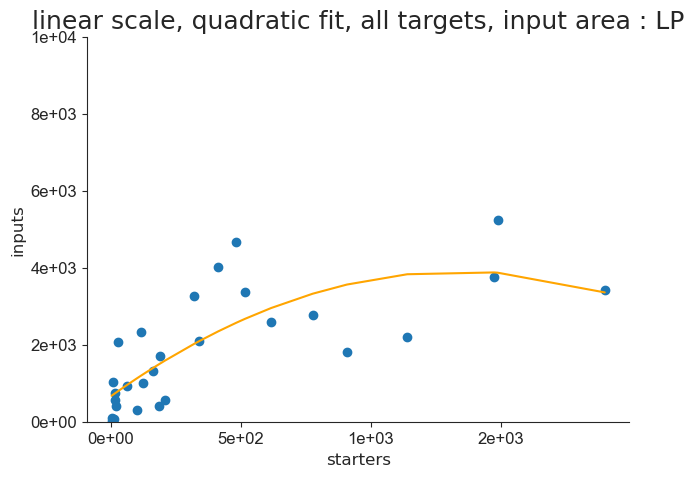

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


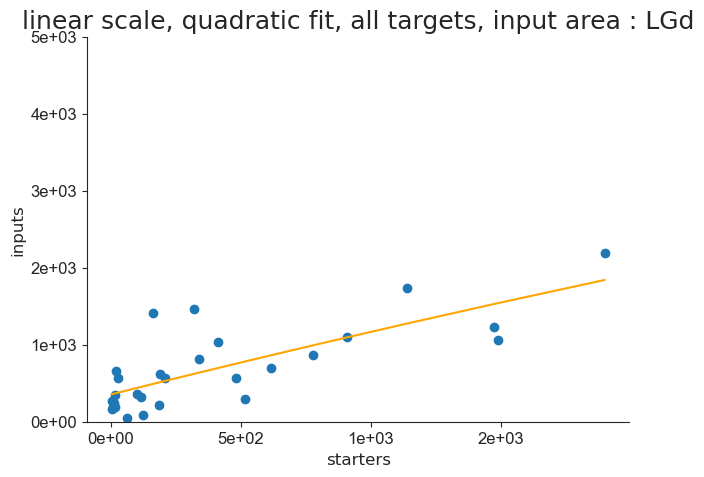

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


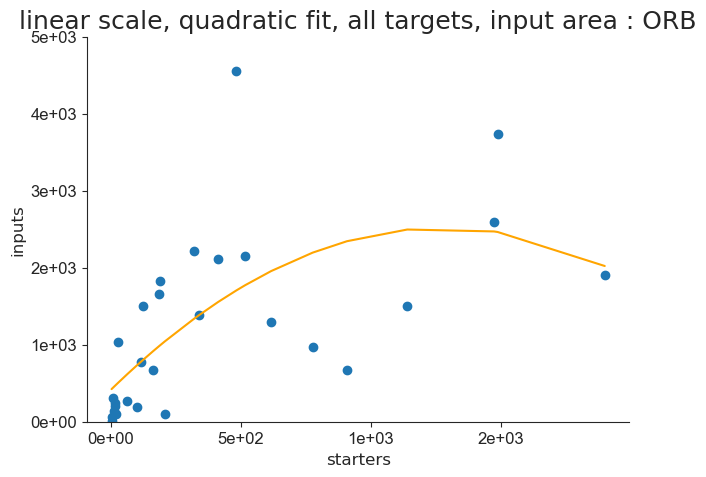

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


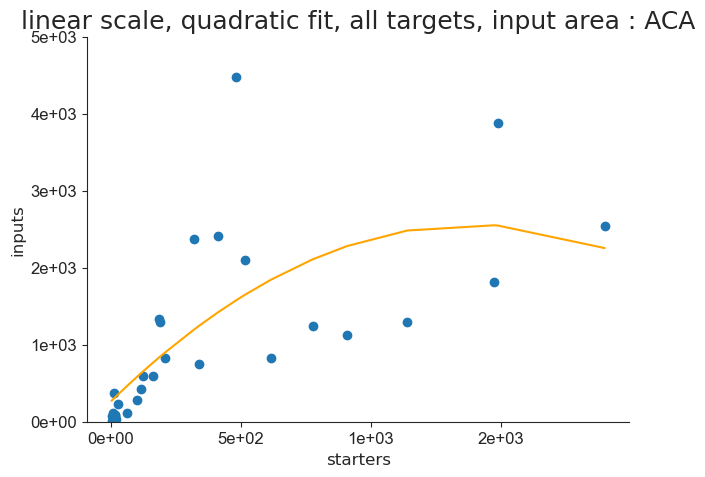

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


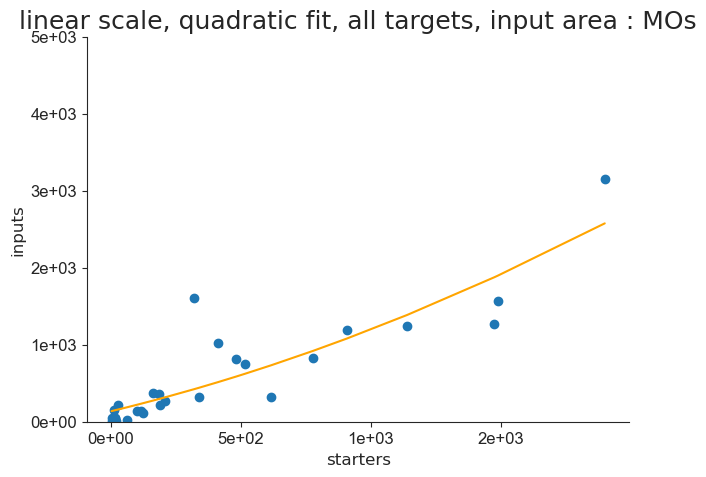

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


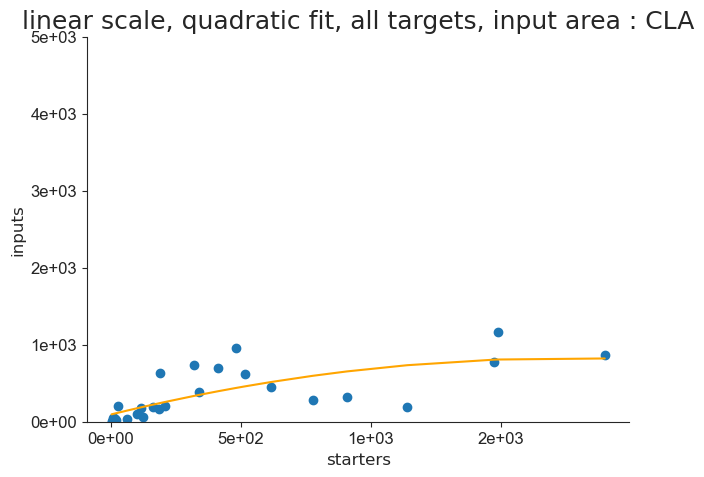

In [53]:
for area in areas:
    ymax_lin = math.ceil(df_all[area].max() / 5000.0) * 5000.0
    this_df_fit_quad, this_result_quad, this_pars_quad, this_AICc_quad, this_rsquare_quad = aicfn.fit_and_saveprms(df_all['starter'].values, df_all[area].values, area, model_quad, 'linear scale, quadratic fit, all targets, input area : ' + area, 'linscale_quadfit_alltargets_' + area, savepath_lin_nls, 0, ymax_lin, 0, 0)
    df_fit_quad = pd.concat([df_fit_quad, this_df_fit_quad], axis = 0).reset_index(drop = True)

## 4.6 Growth model fit

In [54]:
df_fit_growth = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 28
    # data points      = 28
    # variables        = 2
    chi-square         = 9668336.19
    reduced chi-square = 371859.084
    Akaike info crit   = 361.060544
    Bayesian info crit = 363.724953
    R-squared          = 0.66638142
[[Variables]]
    i_max:  4482.19624 +/- 1443.71276 (32.21%) (init = 4213)
    ks:     1044.83293 +/- 626.223020 (59.94%) (init = 1474)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.963
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 28
    # variables        = 2
    chi-square         = 5121427.08
    reduced chi-square = 196977.964
    Akaike info crit   = 343.268697
    Bayesian info crit = 345.933106
    R-squared          = 0.73668212
[[Variables]]
    i_max:  2891.73081 +/- 604.810745 (20.92%) (init = 2575)
    ks:     595.899066 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 28
    # variables        = 2
    chi-square         = 3.8730e+08
    reduced chi-square = 14896283.3
    Akaike info crit   = 464.390401
    Bayesian info crit = 467.054810
    R-squared          = 0.77903019
[[Variables]]
    i_max:  27870.2114 +/- 4069.88194 (14.60%) (init = 24858)
    ks:     433.334582 +/- 156.471224 (36.11%) (init = 1140)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.911
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 28
    # variables        = 2
    chi-square         = 12912210.3
    reduced chi-square = 496623.471
    Akaike info crit   = 369.161424
    Bayesian info crit = 371.825833
    R-squared          = 0.80995998
[[Variables]]
    i_max:  6924.42784 +/- 1488.30671 (21.49%) (init = 5035)
    ks:     940.213640

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 27
    # data points      = 28
    # variables        = 2
    chi-square         = 3.0811e+08
    reduced chi-square = 11850304.8
    Akaike info crit   = 457.985173
    Bayesian info crit = 460.649582
    R-squared          = 0.54280259
[[Variables]]
    i_max:  12179.6039 +/- 2241.69687 (18.41%) (init = 17407)
    ks:     199.169083 +/- 117.512561 (59.00%) (init = 776)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.853
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 16
    # data points      = 28
    # variables        = 2
    chi-square         = 51230445.2
    reduced chi-square = 1970401.74
    Akaike info crit   = 407.749921
    Bayesian info crit = 410.414330
    R-squared          = 0.70585427
[[Variables]]
    i_max:  7859.05185 +/- 957.304586 (12.18%) (init = 8906)
    ks:     217.684969 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 28
    # variables        = 2
    chi-square         = 48130994.4
    reduced chi-square = 1851192.09
    Akaike info crit   = 406.002507
    Bayesian info crit = 408.666916
    R-squared          = 0.63579941
[[Variables]]
    i_max:  6264.80070 +/- 885.287126 (14.13%) (init = 7851)
    ks:     198.897675 +/- 90.1339831 (45.32%) (init = 616)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.853
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 28
    # variables        = 2
    chi-square         = 2.8405e+08
    reduced chi-square = 10924942.3
    Akaike info crit   = 455.708629
    Bayesian info crit = 458.373038
    R-squared          = 0.73772946
[[Variables]]
    i_max:  21401.1961 +/- 4066.78068 (19.00%) (init = 20923)
    ks:     527.870682 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 28
    # variables        = 2
    chi-square         = 1.5671e+08
    reduced chi-square = 6027292.08
    Akaike info crit   = 439.055612
    Bayesian info crit = 441.720021
    R-squared          = 0.78878121
[[Variables]]
    i_max:  21153.1344 +/- 3924.62486 (18.55%) (init = 18231)
    ks:     711.260719 +/- 277.618631 (39.03%) (init = 516)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.943
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 28
    # variables        = 2
    chi-square         = 21448380.3
    reduced chi-square = 824937.702
    Akaike info crit   = 383.370745
    Bayesian info crit = 386.035154
    R-squared          = 0.40736387
[[Variables]]
    i_max:  2482.34546 +/- 572.769415 (23.07%) (init = 4335)
    ks:     186.817282 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 20
    # data points      = 28
    # variables        = 2
    chi-square         = 7954470.11
    reduced chi-square = 305941.158
    Akaike info crit   = 355.597123
    Bayesian info crit = 358.261532
    R-squared          = 0.68095337
[[Variables]]
    i_max:  2813.23581 +/- 443.678765 (15.77%) (init = 3759)
    ks:     289.220148 +/- 128.909649 (44.57%) (init = 776)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.881
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 28
    # variables        = 2
    chi-square         = 6804348.52
    reduced chi-square = 261705.712
    Akaike info crit   = 351.224302
    Bayesian info crit = 353.888711
    R-squared          = 0.49646608
[[Variables]]
    i_max:  1607.75038 +/- 281.264934 (17.49%) (init = 2279)
    ks:     139.192958 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 28
    # variables        = 2
    chi-square         = 3828745.78
    reduced chi-square = 147259.453
    Akaike info crit   = 335.123613
    Bayesian info crit = 337.788022
    R-squared          = 0.65848226
[[Variables]]
    i_max:  2252.53532 +/- 492.008287 (21.84%) (init = 2587)
    ks:     554.695929 +/- 276.346943 (49.82%) (init = 776)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.928
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 28
    # variables        = 2
    chi-square         = 20454787.4
    reduced chi-square = 786722.591
    Akaike info crit   = 382.042644
    Bayesian info crit = 384.707053
    R-squared          = 0.51277306
[[Variables]]
    i_max:  2865.17481 +/- 579.783419 (20.24%) (init = 4457)
    ks:     200.732661 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 28
    # variables        = 2
    chi-square         = 38342100.5
    reduced chi-square = 1474696.17
    Akaike info crit   = 399.635928
    Bayesian info crit = 402.300337
    R-squared          = 0.54990839
[[Variables]]
    i_max:  4504.85187 +/- 875.515473 (19.43%) (init = 5910)
    ks:     240.990337 +/- 140.716660 (58.39%) (init = 776)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.867
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 24
    # data points      = 28
    # variables        = 2
    chi-square         = 50979453.8
    reduced chi-square = 1960748.22
    Akaike info crit   = 407.612405
    Bayesian info crit = 410.276814
    R-squared          = 0.53470329
[[Variables]]
    i_max:  4850.24404 +/- 843.431989 (17.39%) (init = 7040)
    ks:     169.979672 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 28
    # variables        = 2
    chi-square         = 1174776.00
    reduced chi-square = 45183.6925
    Akaike info crit   = 302.042739
    Bayesian info crit = 304.707148
    R-squared          = 0.48506880
[[Variables]]
    i_max:  626.675545 +/- 106.704044 (17.03%) (init = 1009)
    ks:     112.114449 +/- 74.8001541 (66.72%) (init = 184)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.806
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 16
    # data points      = 28
    # variables        = 2
    chi-square         = 1994273.06
    reduced chi-square = 76702.8102
    Akaike info crit   = 316.860398
    Bayesian info crit = 319.524807
    R-squared          = 0.69535282
[[Variables]]
    i_max:  1478.14819 +/- 155.813877 (10.54%) (init = 1787)
    ks:     146.603434 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 20
    # data points      = 28
    # variables        = 2
    chi-square         = 23452746.1
    reduced chi-square = 902028.694
    Akaike info crit   = 385.872222
    Bayesian info crit = 388.536631
    R-squared          = 0.60684111
[[Variables]]
    i_max:  4246.98849 +/- 706.640226 (16.64%) (init = 5238)
    ks:     254.781232 +/- 124.995570 (49.06%) (init = 616)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.872
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 19
    # data points      = 28
    # variables        = 2
    chi-square         = 4094680.03
    reduced chi-square = 157487.694
    Akaike info crit   = 337.003850
    Bayesian info crit = 339.668259
    R-squared          = 0.48231612
[[Variables]]
    i_max:  1789.90495 +/- 412.832543 (23.06%) (init = 2185)
    ks:     425.379796 +

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and ma

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 16
    # data points      = 28
    # variables        = 2
    chi-square         = 18434069.5
    reduced chi-square = 709002.672
    Akaike info crit   = 379.130185
    Bayesian info crit = 381.794594
    R-squared          = 0.47961309
[[Variables]]
    i_max:  2553.75870 +/- 525.849104 (20.59%) (init = 4557)
    ks:     183.266765 +/- 124.463666 (67.91%) (init = 320)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.846


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 16
    # data points      = 28
    # variables        = 2
    chi-square         = 16827981.8
    reduced chi-square = 647230.070
    Akaike info crit   = 376.577776
    Bayesian info crit = 379.242185
    R-squared          = 0.54157580
[[Variables]]
    i_max:  2811.20377 +/- 647.451086 (23.03%) (init = 4473)
    ks:     290.858809 +/- 188.942750 (64.96%) (init = 320)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.882
[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 121
    # data points      = 28
    # variables        = 2
    chi-square         = 3160391.13
    reduced chi-square = 121553.505
    Akaike info crit   = 329.752052
    Bayesian info crit = 332.416461
    R-squared          = 0.77026782
[[Variables]]
    i_max:  4.9406e+09 +/- 2.1080e+15 (42666610.42%) (init = 3153)
    ks:     3.846

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(growth)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 28
    # variables        = 2
    chi-square         = 1261279.85
    reduced chi-square = 48510.7636
    Akaike info crit   = 304.032124
    Bayesian info crit = 306.696533
    R-squared          = 0.59093793
[[Variables]]
    i_max:  897.190988 +/- 198.458015 (22.12%) (init = 1169)
    ks:     346.890617 +/- 204.152779 (58.85%) (init = 516)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.895


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


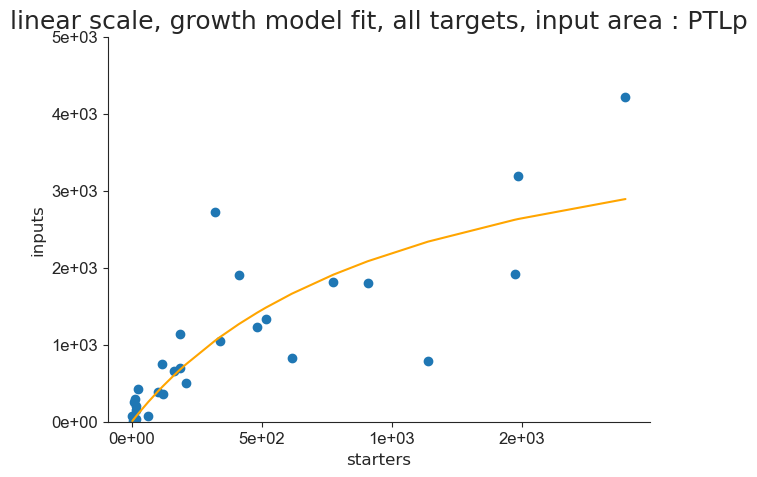

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


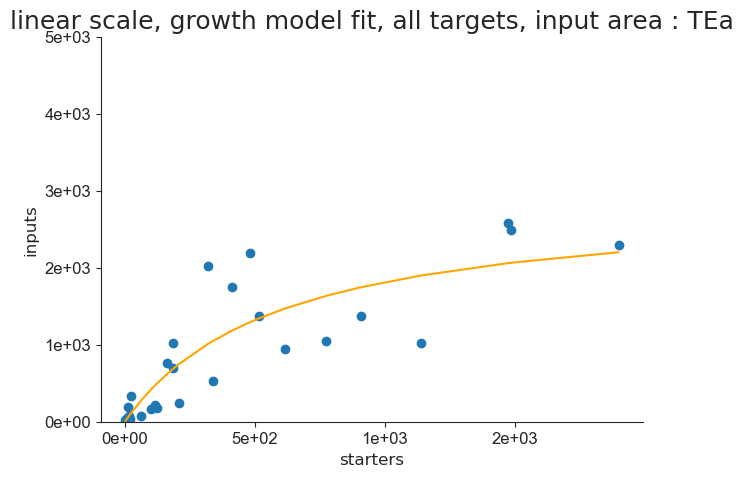

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


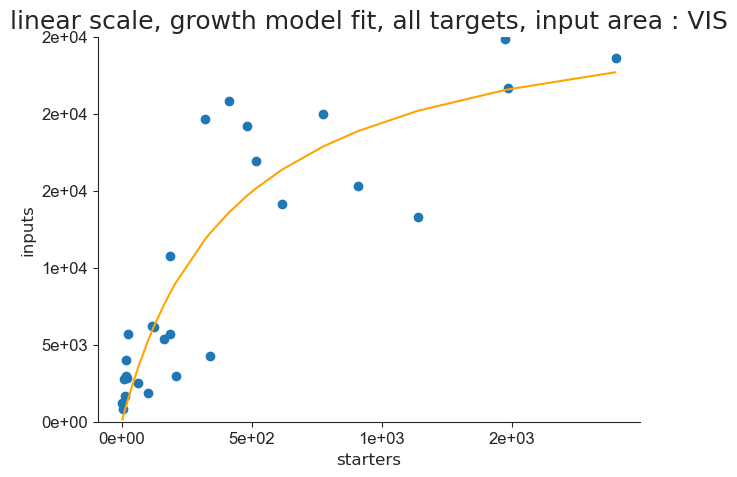

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


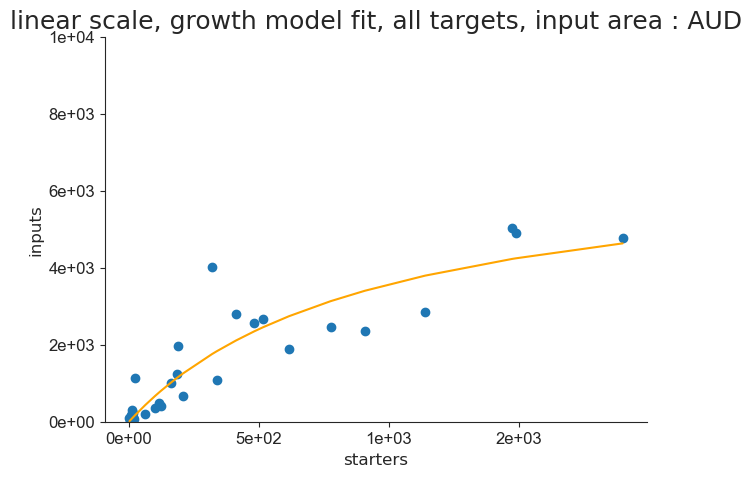

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


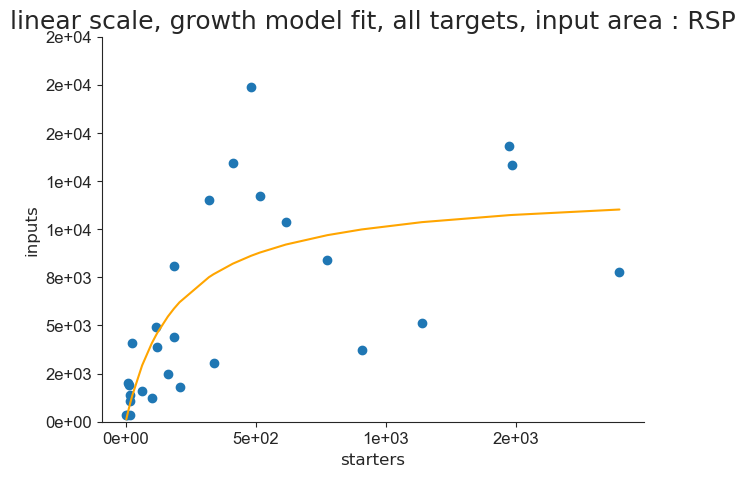

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


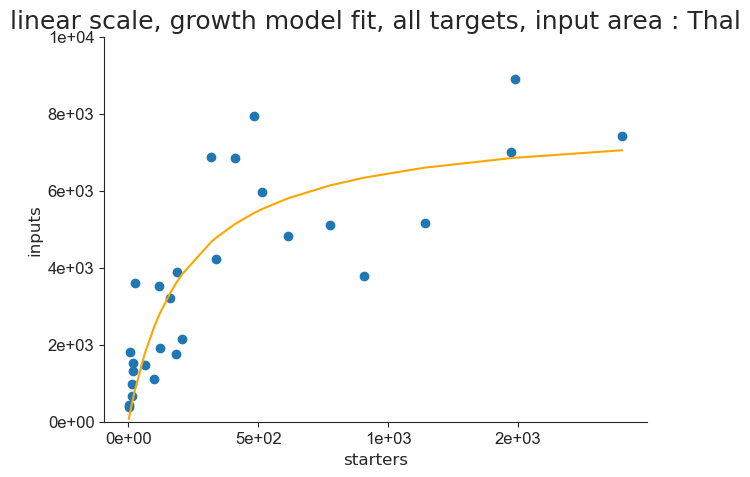

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


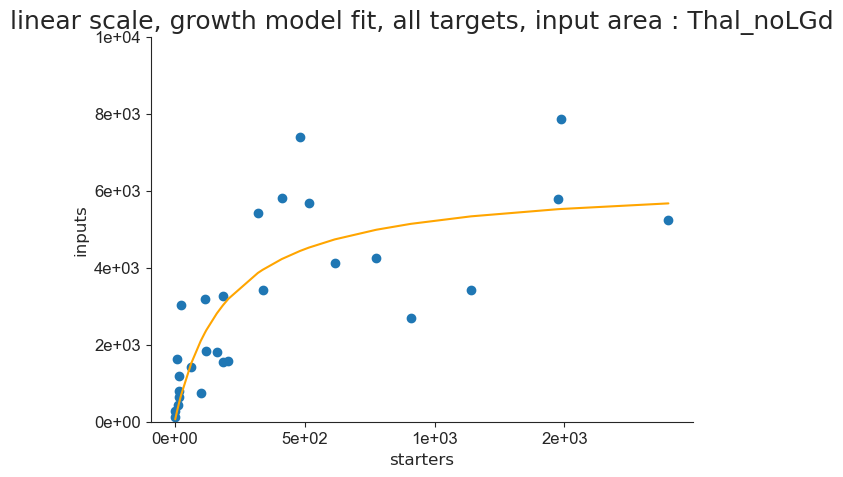

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


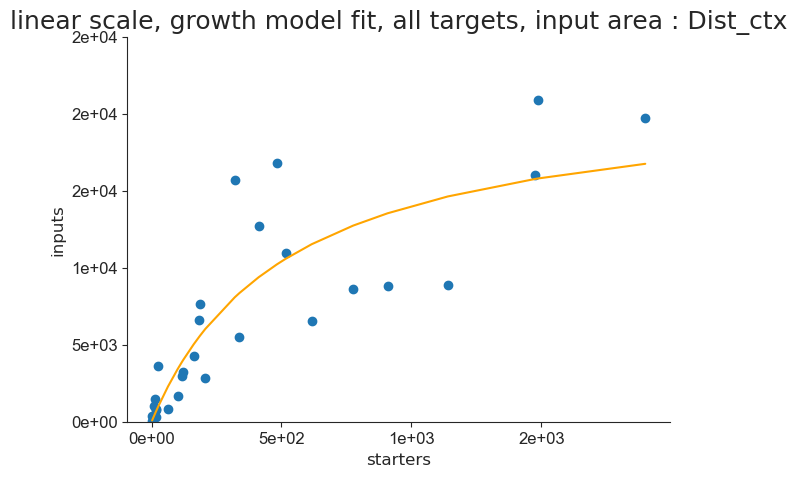

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


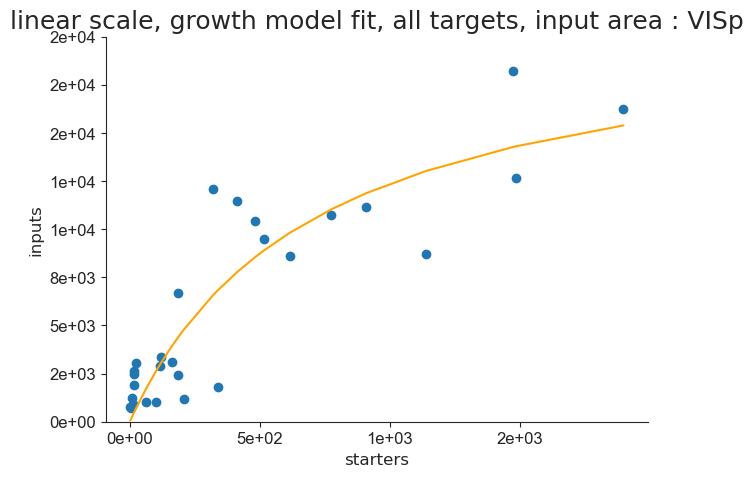

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


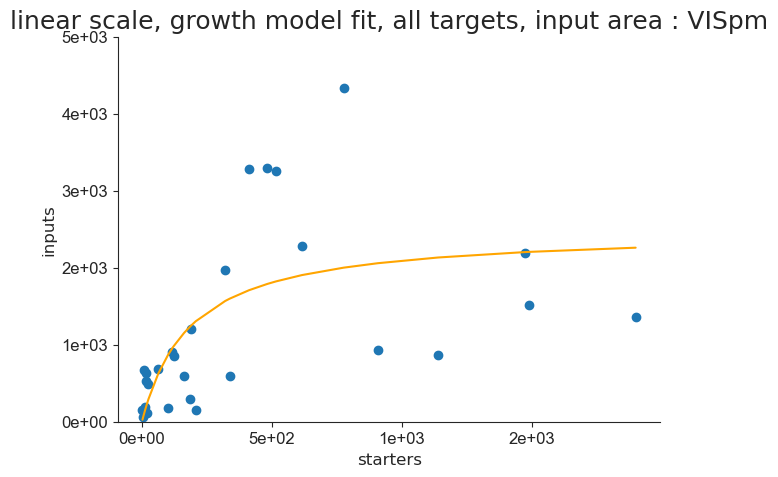

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


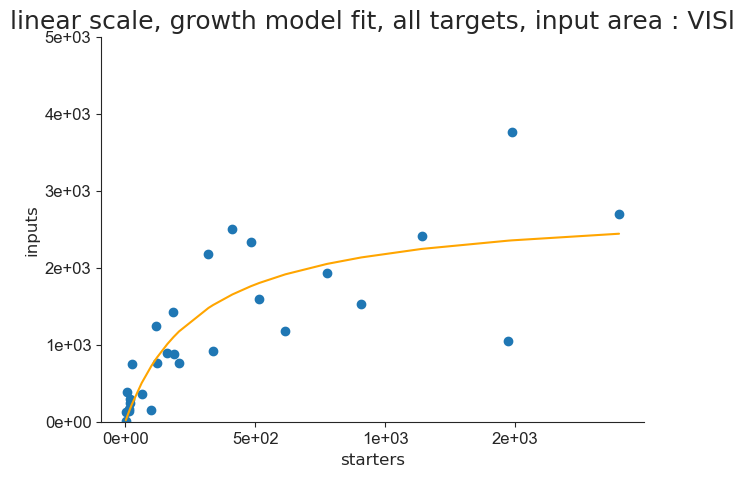

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


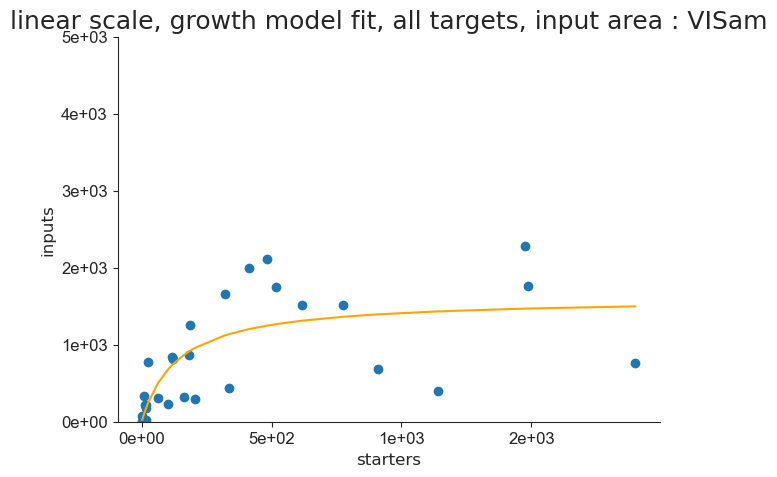

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


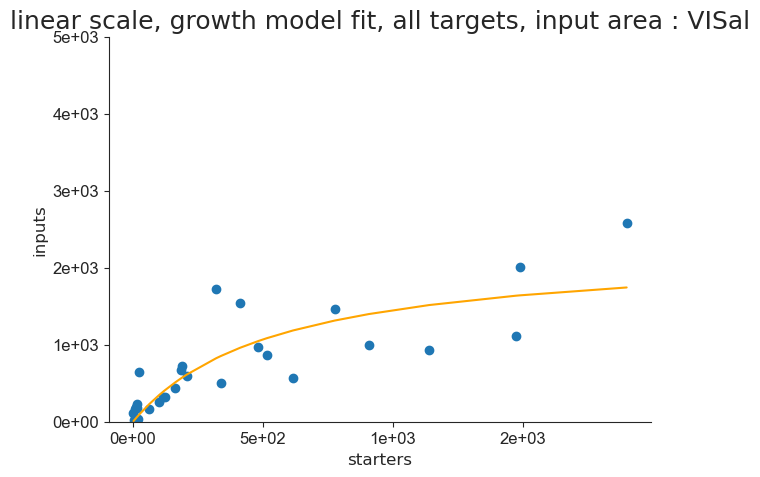

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


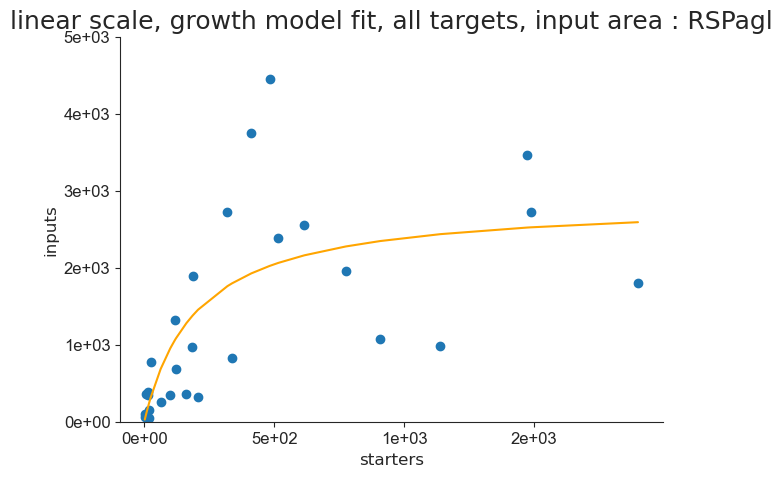

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


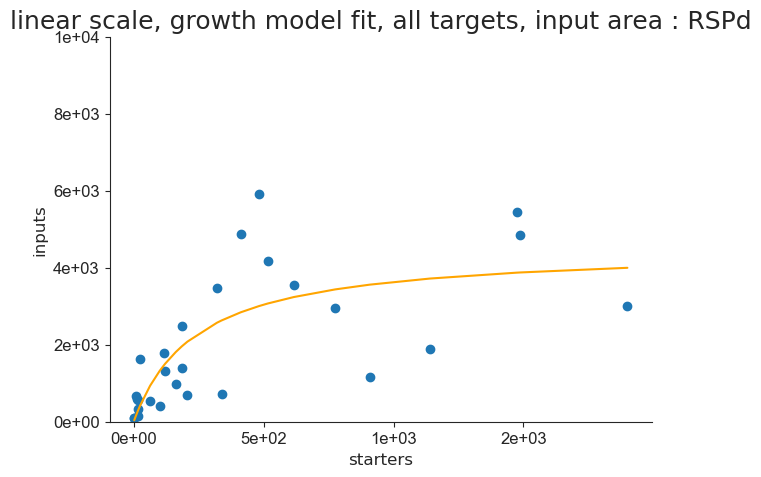

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


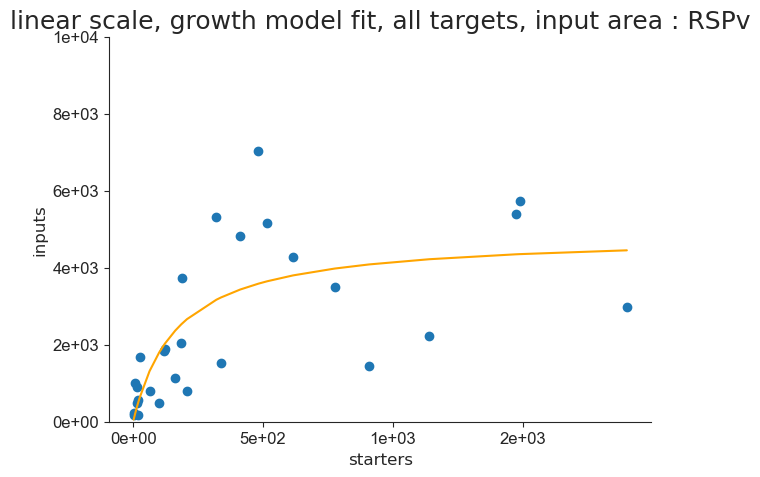

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


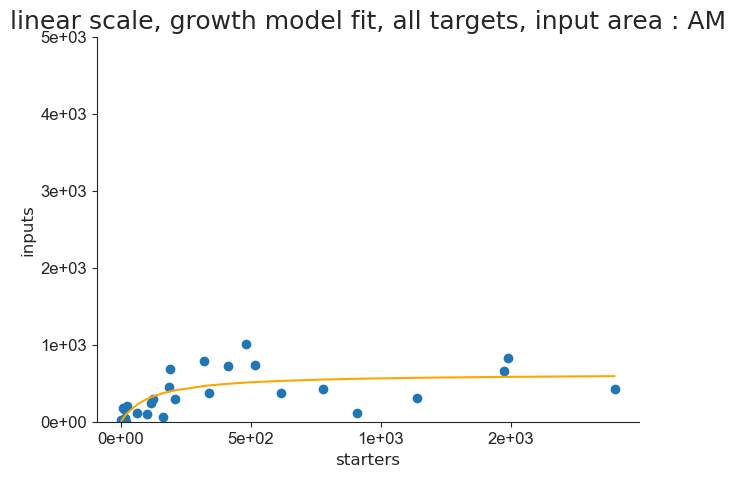

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


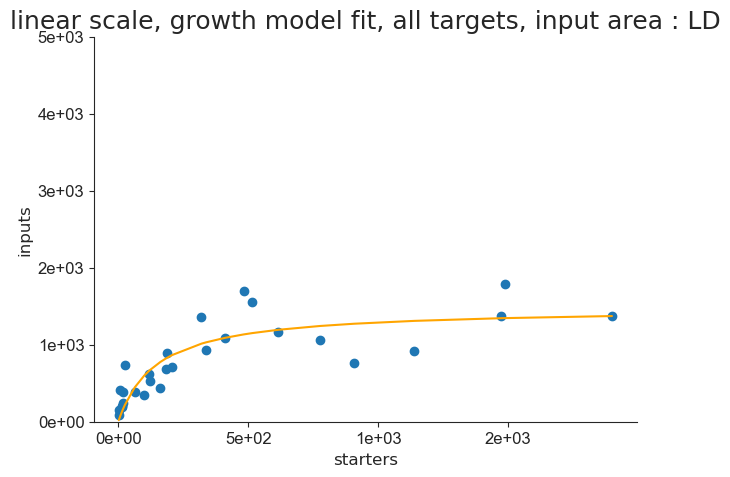

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


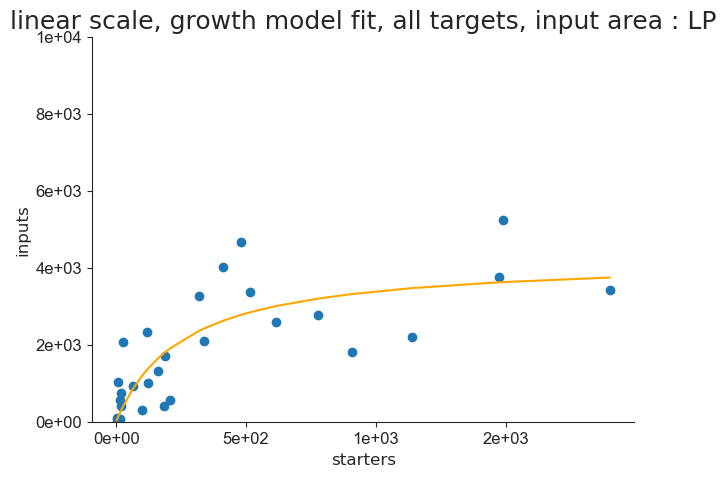

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


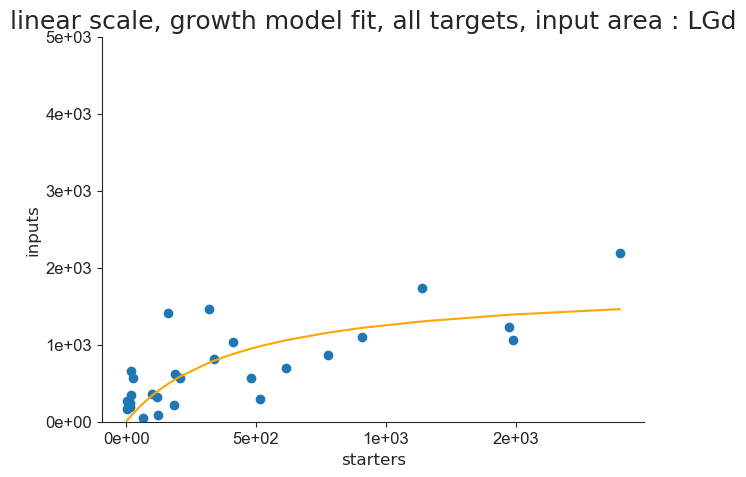

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


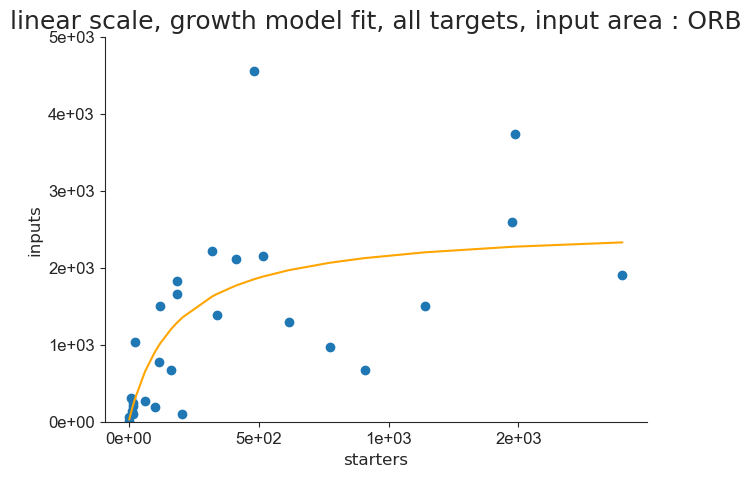

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


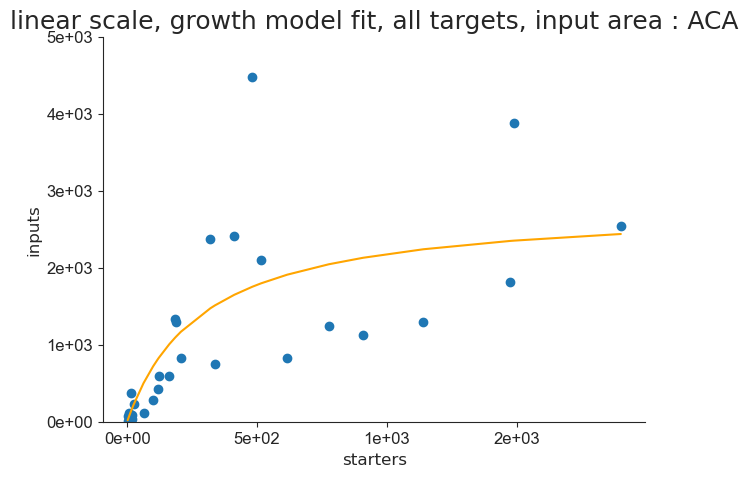

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


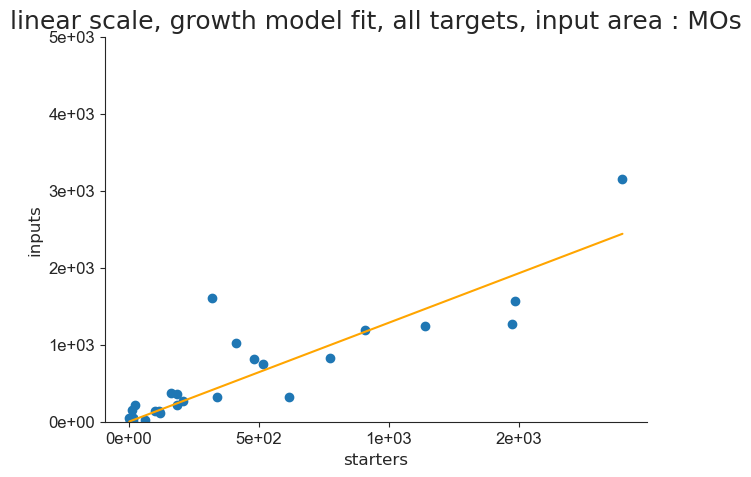

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


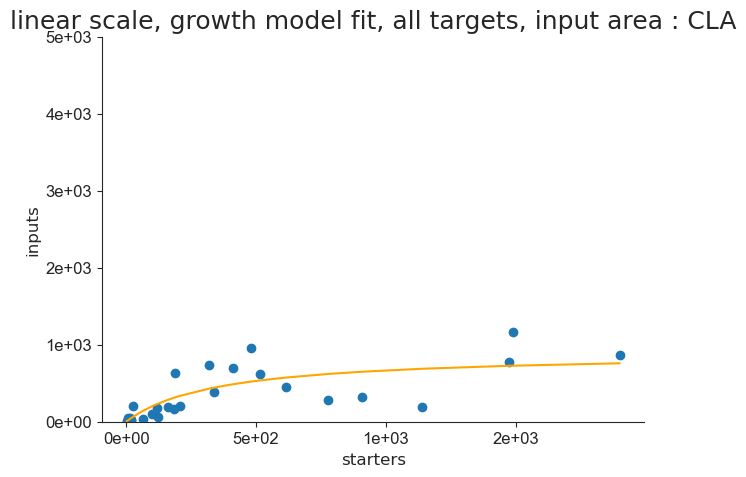

In [55]:
for area in areas:
    ymax_lin = math.ceil(df_all[area].max() / 5000.0) * 5000.0
    this_df_fit_growth, this_result_growth, this_pars_growth, this_AICc_growth, this_rsquare_growth = aicfn.fit_and_saveprms(df_all['starter'].values, df_all[area].values, area, gmodel, 'linear scale, growth model fit, all targets, input area : ' + area, 'linscale_growthfit_alltargets_' + area, savepath_lin_nls, 0, ymax_lin, 0, 0)
    df_fit_growth = pd.concat([df_fit_growth, this_df_fit_growth], axis = 0).reset_index(drop = True)

## 4.7 Hill model fit

In [56]:
df_fit_hill= pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1372
    # data points      = 28
    # variables        = 3
    chi-square         = 8678468.01
    reduced chi-square = 347138.721
    Akaike info crit   = 360.036230
    Bayesian info crit = 364.032843
    R-squared          = 0.70053812
[[Variables]]
    i_max:  1.5523e+08 +/- 9.4420e+12 (6082643.05%) (init = 4213)
    ks:     1.0757e+11 +/- 1.0759e+16 (10002445.17%) (init = 1474)
    n:      0.60605640 +/- 0.39728660 (65.55%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.960
    C(i_max, n)  = -0.960
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 64
    # data points      = 28
    # variables        = 3
    chi-square         = 5121274.19
    reduced chi-square = 204850.968
    Akaike info crit   = 345.267861
    Bayesian info crit = 349.264475
    R-squared

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 101
    # data points      = 28
    # variables        = 3
    chi-square         = 3.8658e+08
    reduced chi-square = 15463042.3
    Akaike info crit   = 466.337771
    Bayesian info crit = 470.334385
    R-squared          = 0.77944514
[[Variables]]
    i_max:  31469.2766 +/- 14357.7382 (45.62%) (init = 24858)
    ks:     587.213362 +/- 695.149394 (118.38%) (init = 1140)
    n:      0.86405864 +/- 0.35402502 (40.97%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.991
    C(ks, n)     = -0.921
    C(i_max, n)  = -0.913
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 262
    # data points      = 28
    # variables        = 3
    chi-square         = 12325169.4
    reduced chi-square = 493006.777
    Akaike info crit   = 369.858586
    Bayesian info crit = 373.855200
    R-squared         

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 91
    # data points      = 28
    # variables        = 3
    chi-square         = 2.9177e+08
    reduced chi-square = 11670616.3
    Akaike info crit   = 458.459172
    Bayesian info crit = 462.455785
    R-squared          = 0.56705304
[[Variables]]
    i_max:  10346.9740 +/- 1383.65225 (13.37%) (init = 17407)
    ks:     178.950020 +/- 42.7871370 (23.91%) (init = 776)
    n:      2.74822213 +/- 1.80088943 (65.53%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.585
    C(i_max, n)  = -0.565
    C(ks, n)     = -0.331
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 40
    # data points      = 28
    # variables        = 3
    chi-square         = 47954720.2
    reduced chi-square = 1918188.81
    Akaike info crit   = 407.899772
    Bayesian info crit = 411.896385
    R-squared          = 0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 28
    # variables        = 3
    chi-square         = 47321492.9
    reduced chi-square = 1892859.72
    Akaike info crit   = 407.527578
    Bayesian info crit = 411.524191
    R-squared          = 0.64192480
[[Variables]]
    i_max:  7785.31525 +/- 4106.82906 (52.75%) (init = 7851)
    ks:     363.459677 +/- 638.021379 (175.54%) (init = 616)
    n:      0.68056058 +/- 0.35451850 (52.09%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.990
    C(i_max, n)  = -0.903
    C(ks, n)     = -0.902
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 75
    # data points      = 28
    # variables        = 3
    chi-square         = 2.7814e+08
    reduced chi-square = 11125523.1
    Akaike info crit   = 457.119864
    Bayesian info crit = 461.116478
    R-squared          = 0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 68
    # data points      = 28
    # variables        = 3
    chi-square         = 1.5382e+08
    reduced chi-square = 6152853.25
    Akaike info crit   = 440.534738
    Bayesian info crit = 444.531352
    R-squared          = 0.79267411
[[Variables]]
    i_max:  48698.4954 +/- 96070.9751 (197.28%) (init = 18231)
    ks:     5422.16576 +/- 25762.6564 (475.14%) (init = 516)
    n:      0.66392580 +/- 0.30708371 (46.25%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.998
    C(ks, n)     = -0.967
    C(i_max, n)  = -0.949
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 132
    # data points      = 28
    # variables        = 3
    chi-square         = 18991173.5
    reduced chi-square = 759646.939
    Akaike info crit   = 381.963850
    Bayesian info crit = 385.960464
    R-squared          

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 28
    # variables        = 3
    chi-square         = 7873249.35
    reduced chi-square = 314929.974
    Akaike info crit   = 357.309753
    Bayesian info crit = 361.306367
    R-squared          = 0.68421106
[[Variables]]
    i_max:  3579.15958 +/- 2210.14553 (61.75%) (init = 3759)
    ks:     559.652025 +/- 1026.39114 (183.40%) (init = 776)
    n:      0.73853618 +/- 0.38539283 (52.18%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.992
    C(ks, n)     = -0.923
    C(i_max, n)  = -0.914
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 194
    # data points      = 28
    # variables        = 3
    chi-square         = 6761081.62
    reduced chi-square = 270443.265
    Akaike info crit   = 353.045690
    Bayesian info crit = 357.042304
    R-squared          = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1734
    # data points      = 28
    # variables        = 3
    chi-square         = 3422992.34
    reduced chi-square = 136919.694
    Akaike info crit   = 333.986993
    Bayesian info crit = 337.983606
    R-squared          = 0.69467479
[[Variables]]
    i_max:  49667441.1 +/- 1.5242e+12 (3068775.53%) (init = 2587)
    ks:     8.6676e+11 +/- 5.2045e+16 (6004533.74%) (init = 776)
    n:      0.50915633 +/- 0.33410624 (65.62%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.962
    C(i_max, n)  = -0.962
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 84
    # data points      = 28
    # variables        = 3
    chi-square         = 18436492.0
    reduced chi-square = 737459.681
    Akaike info crit   = 381.133864
    Bayesian info crit = 385.130478
    R-squared  

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 28
    # variables        = 3
    chi-square         = 37366479.2
    reduced chi-square = 1494659.17
    Akaike info crit   = 400.914242
    Bayesian info crit = 404.910856
    R-squared          = 0.56136105
[[Variables]]
    i_max:  3740.06728 +/- 570.430971 (15.25%) (init = 5910)
    ks:     192.402135 +/- 54.1653083 (28.15%) (init = 776)
    n:      2.35794164 +/- 1.48428086 (62.95%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.662
    C(i_max, n)  = -0.632
    C(ks, n)     = -0.408
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 104
    # data points      = 28
    # variables        = 3
    chi-square         = 48619501.7
    reduced chi-square = 1944780.07
    Akaike info crit   = 408.285262
    Bayesian info crit = 412.281875
    R-squared          = 0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 92
    # data points      = 28
    # variables        = 3
    chi-square         = 1083417.15
    reduced chi-square = 43336.6862
    Akaike info crit   = 301.775932
    Bayesian info crit = 305.772545
    R-squared          = 0.52511348
[[Variables]]
    i_max:  563.000106 +/- 65.9920206 (11.72%) (init = 1009)
    ks:     138.328467 +/- 28.1109531 (20.32%) (init = 184)
    n:      3.74992395 +/- 2.84271202 (75.81%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.400
    C(i_max, n)  = -0.385
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 28
    # variables        = 3
    chi-square         = 1861573.03
    reduced chi-square = 74462.9212
    Akaike info crit   = 316.932381
    Bayesian info crit = 320.928995
    R-squared          = 0.71562421
[[Variables]]
   

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 43
    # data points      = 28
    # variables        = 3
    chi-square         = 23058386.9
    reduced chi-square = 922335.475
    Akaike info crit   = 387.397397
    Bayesian info crit = 391.394011
    R-squared          = 0.61345210
[[Variables]]
    i_max:  5881.39421 +/- 4778.32459 (81.24%) (init = 5238)
    ks:     656.296245 +/- 1756.28011 (267.60%) (init = 616)
    n:      0.64121979 +/- 0.38057155 (59.35%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.995
    C(ks, n)     = -0.933
    C(i_max, n)  = -0.921


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 1949
    # data points      = 28
    # variables        = 3
    chi-square         = 3444720.02
    reduced chi-square = 137788.801
    Akaike info crit   = 334.164163
    Bayesian info crit = 338.160776
    R-squared          = 0.56448953
[[Variables]]
    i_max:  47455670.7 +/- 2.0608e+12 (4342521.05%) (init = 2185)
    ks:     9.5595e+13 +/- 9.8753e+18 (10330375.84%) (init = 908)
    n:      0.41826698 +/- 0.34130454 (81.60%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 1.000
    C(ks, n)     = -0.964
    C(i_max, n)  = -0.964
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 153
    # data points      = 28
    # variables        = 3
    chi-square         = 18348014.3
    reduced chi-square = 733920.574
    Akaike info crit   = 380.999167
    Bayesian info crit = 384.995781
    R-squared

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 59
    # data points      = 28
    # variables        = 3
    chi-square         = 15624300.7
    reduced chi-square = 624972.029
    Akaike info crit   = 376.499738
    Bayesian info crit = 380.496351
    R-squared          = 0.57436622
[[Variables]]
    i_max:  2125.01669 +/- 286.191098 (13.47%) (init = 4473)
    ks:     182.202443 +/- 40.7069327 (22.34%) (init = 320)
    n:      3.43125147 +/- 2.63789210 (76.88%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.518
    C(i_max, n)  = -0.485
    C(ks, n)     = -0.307
[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 583
    # data points      = 28
    # variables        = 3
    chi-square         = 3114426.87
    reduced chi-square = 124577.075
    Akaike info crit   = 331.341833
    Bayesian info crit = 335.338447
    R-squared          = 0

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(hill)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 87
    # data points      = 28
    # variables        = 3
    chi-square         = 1216745.21
    reduced chi-square = 48669.8084
    Akaike info crit   = 305.025593
    Bayesian info crit = 309.022207
    R-squared          = 0.60538154
[[Variables]]
    i_max:  636.428218 +/- 78.5302817 (12.34%) (init = 1169)
    ks:     184.489703 +/- 37.0244648 (20.07%) (init = 516)
    n:      3.60934859 +/- 2.62948985 (72.85%) (init = 0.5)
[[Correlations]] (unreported correlations are < 0.100)
    C(i_max, ks) = 0.507
    C(i_max, n)  = -0.470
    C(ks, n)     = -0.312


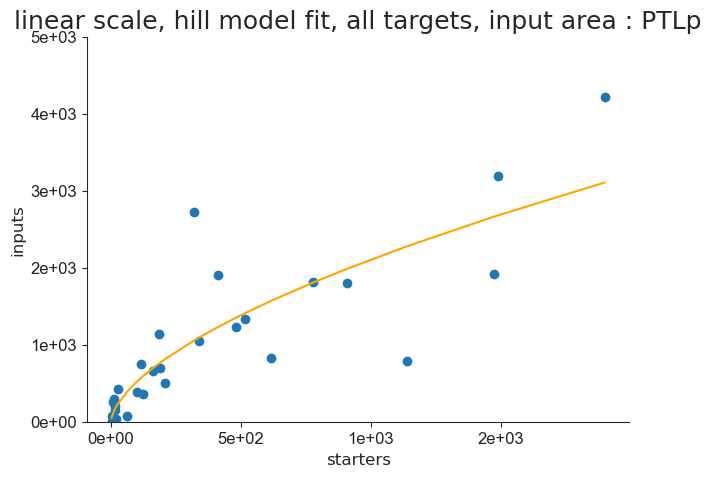

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


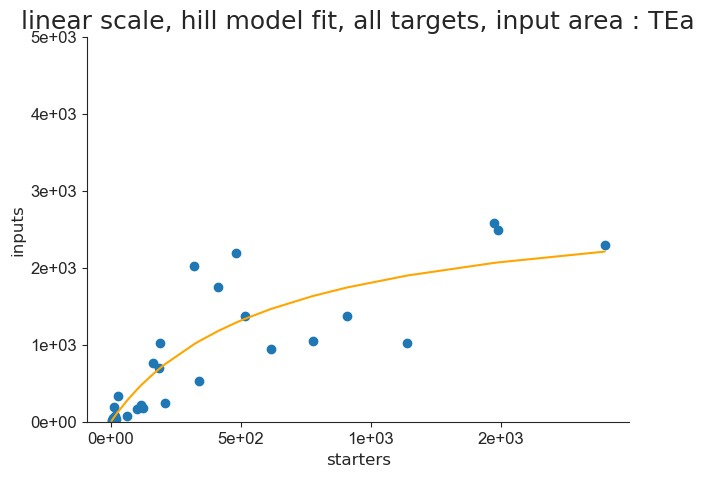

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


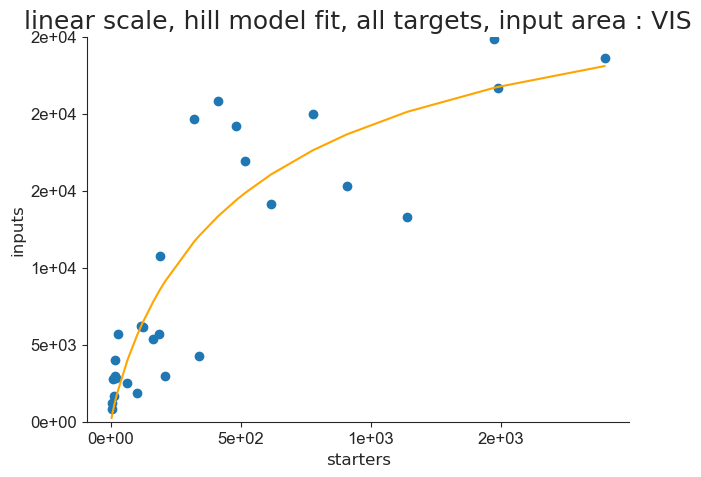

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


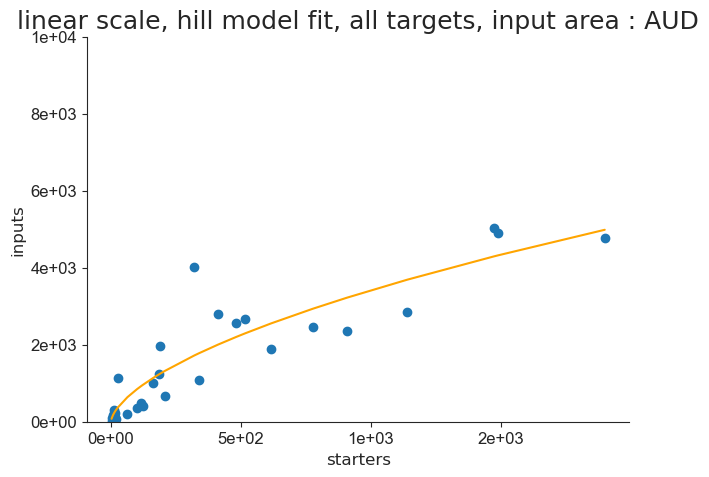

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


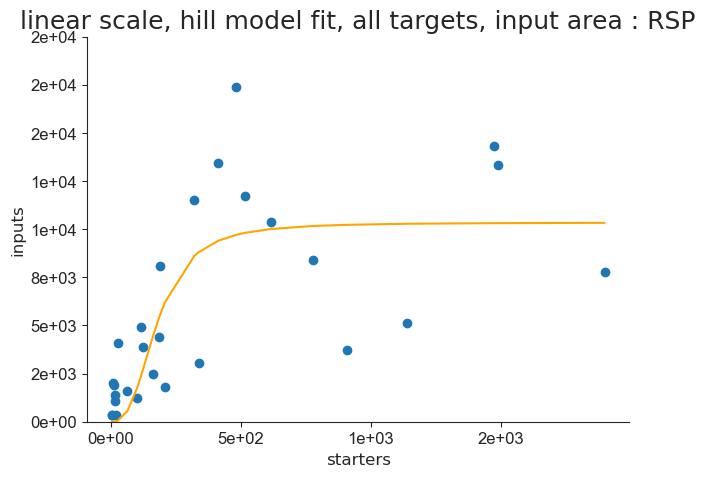

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


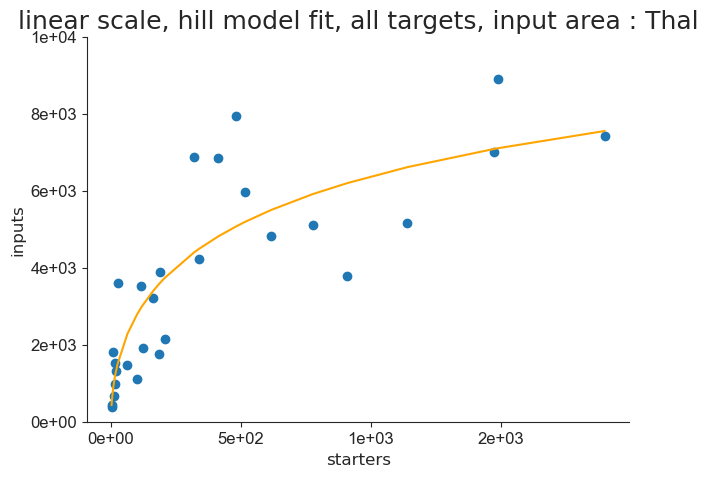

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


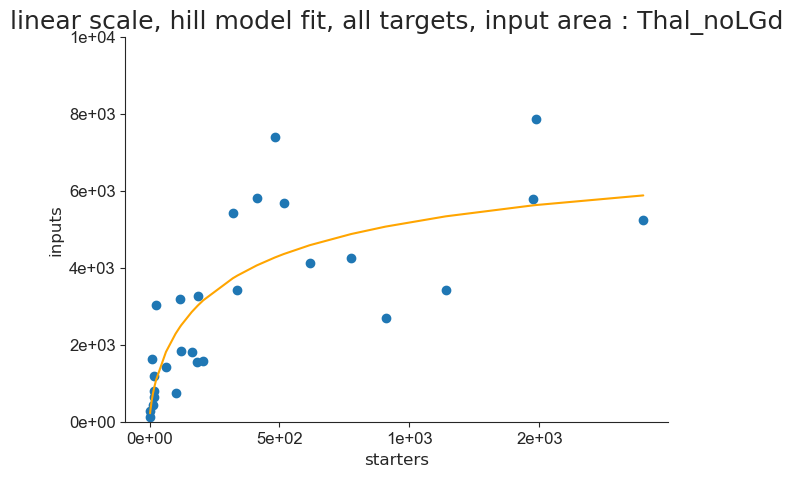

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


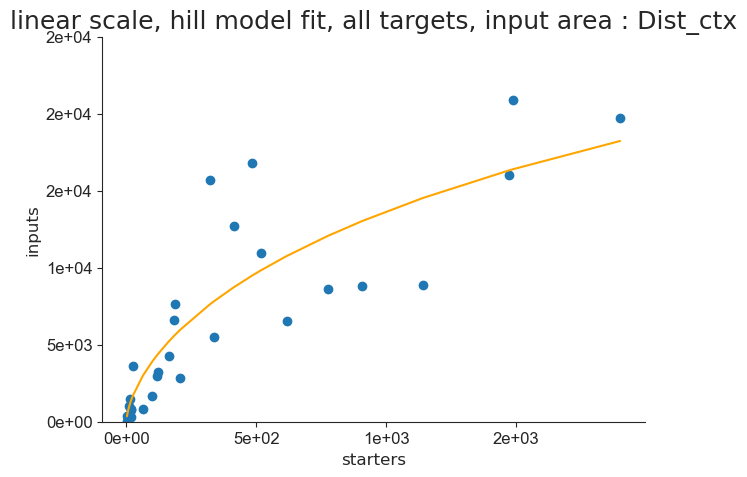

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


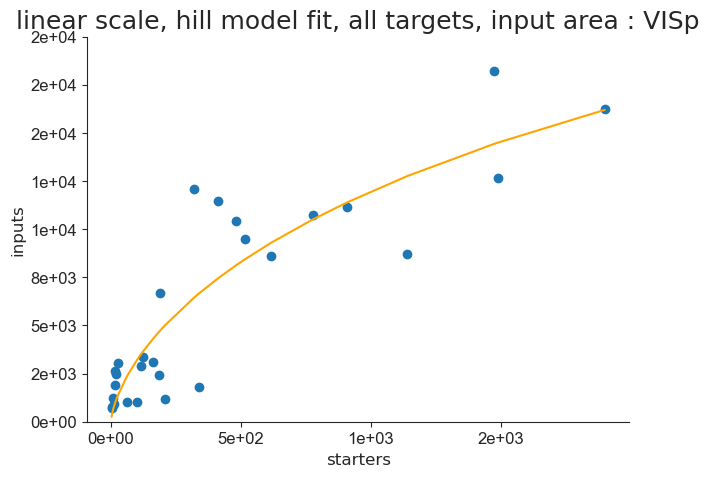

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


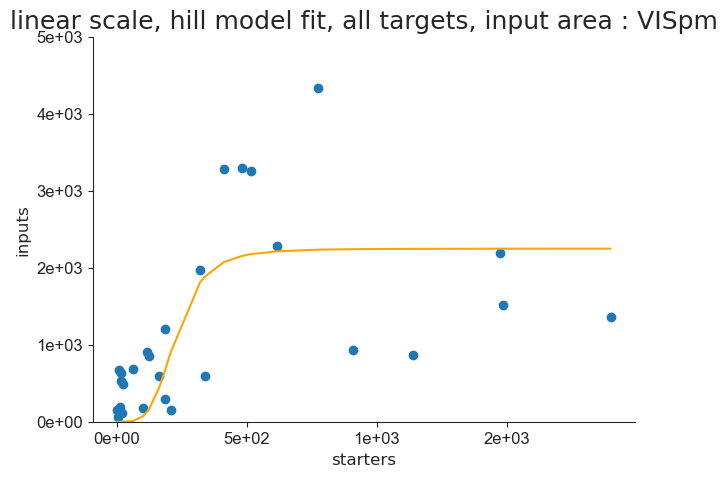

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


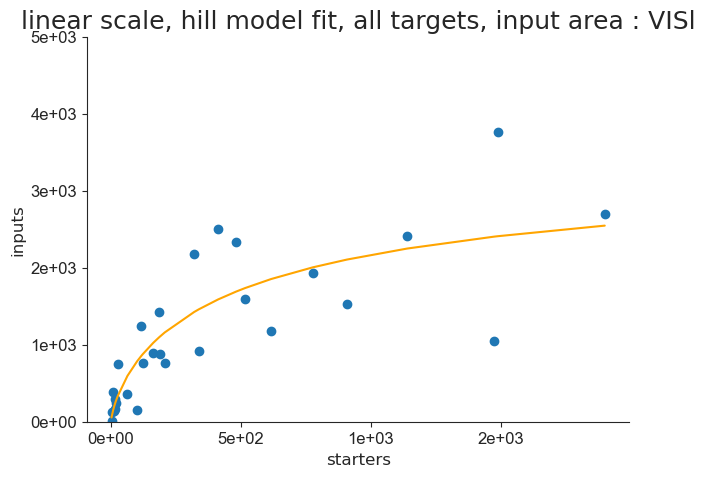

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


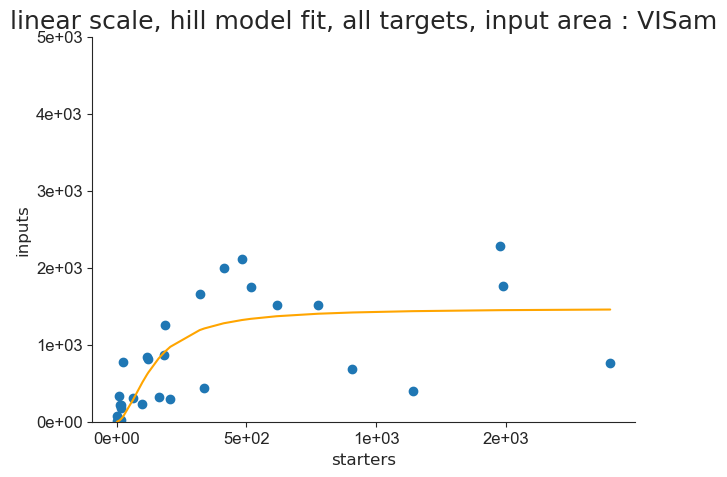

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


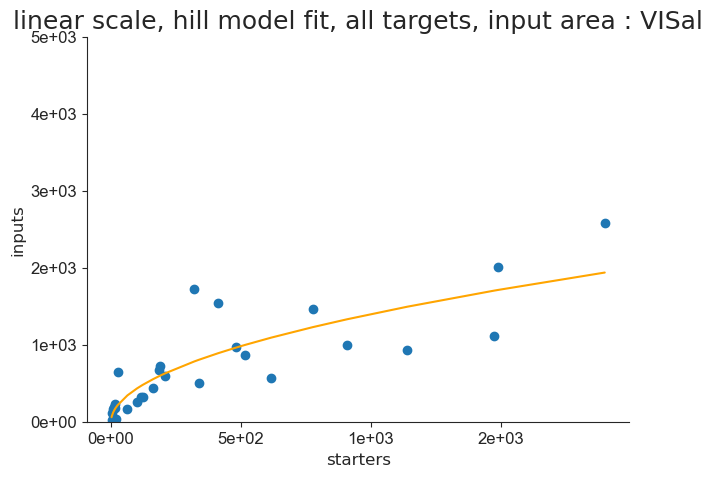

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


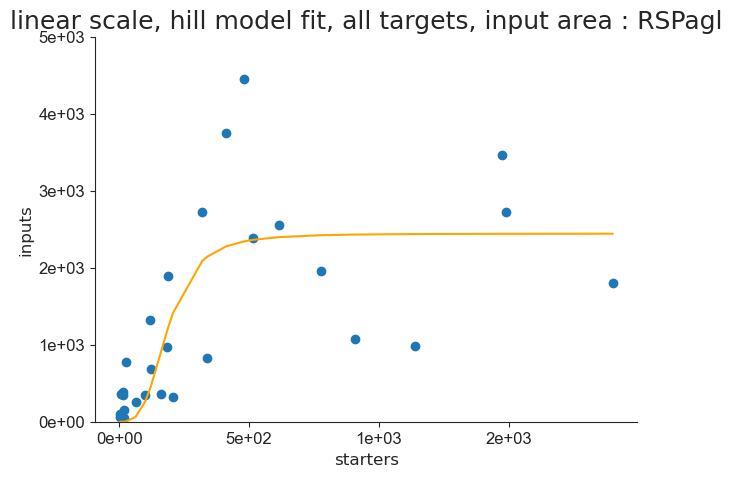

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


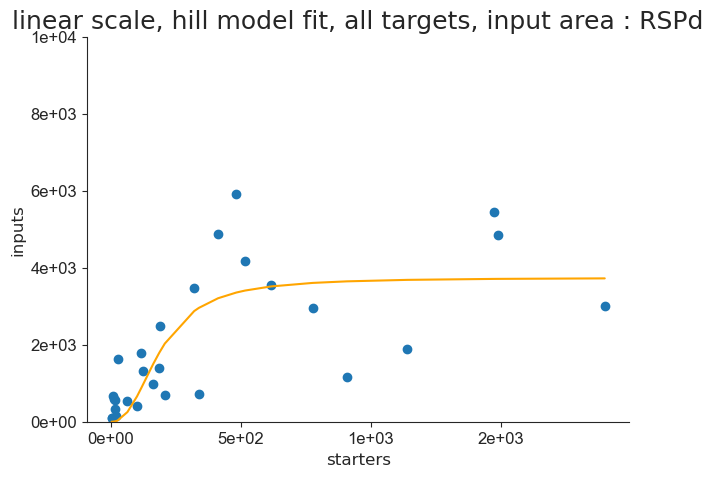

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


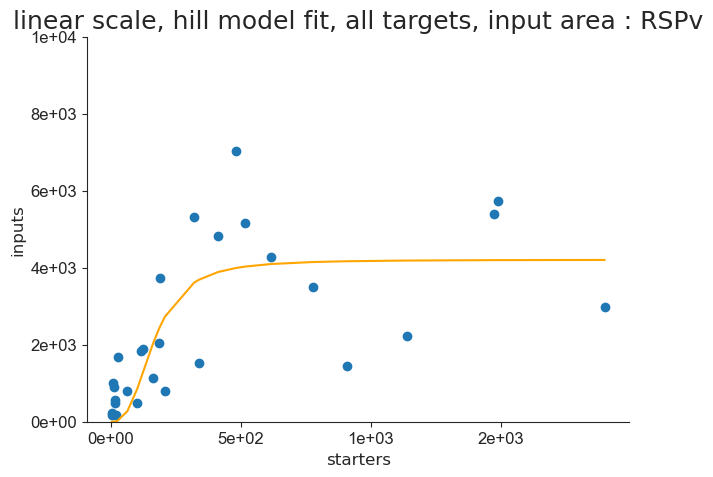

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


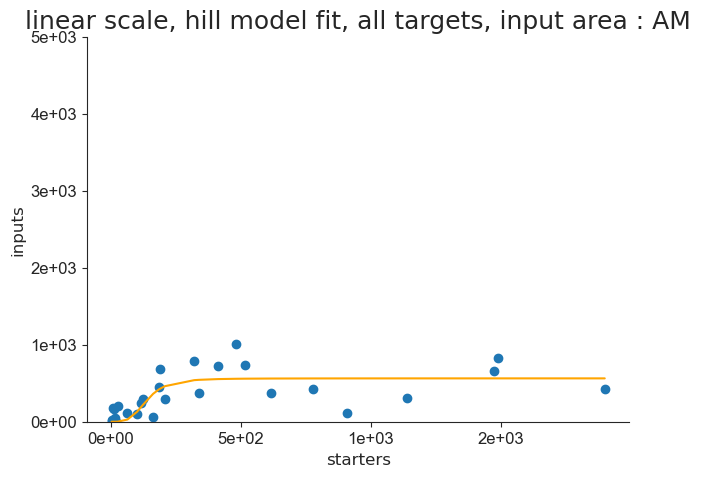

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


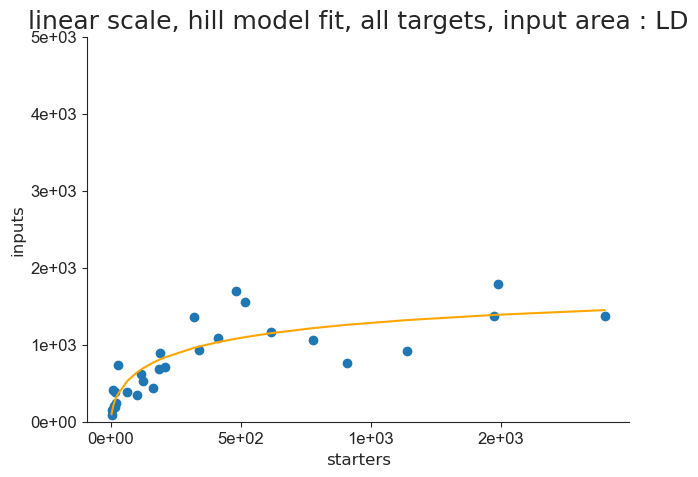

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


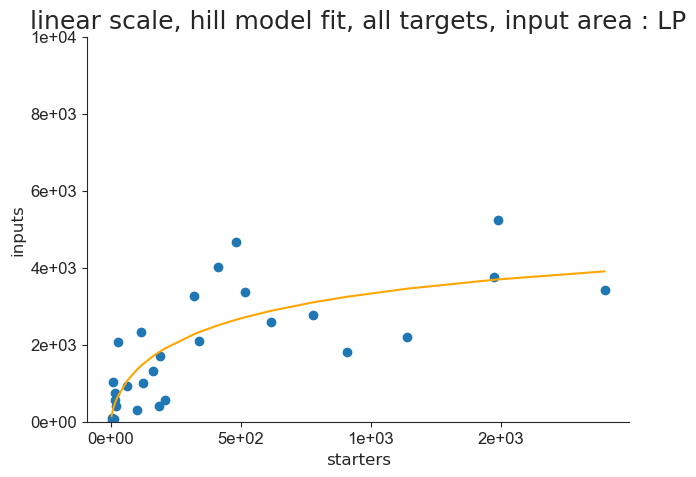

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


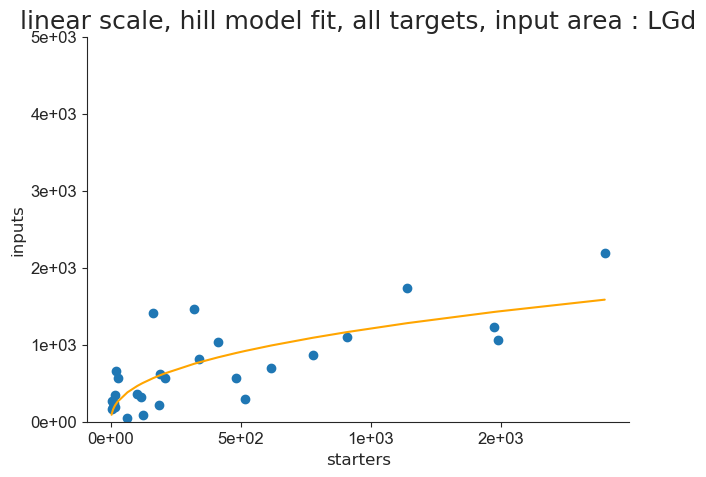

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


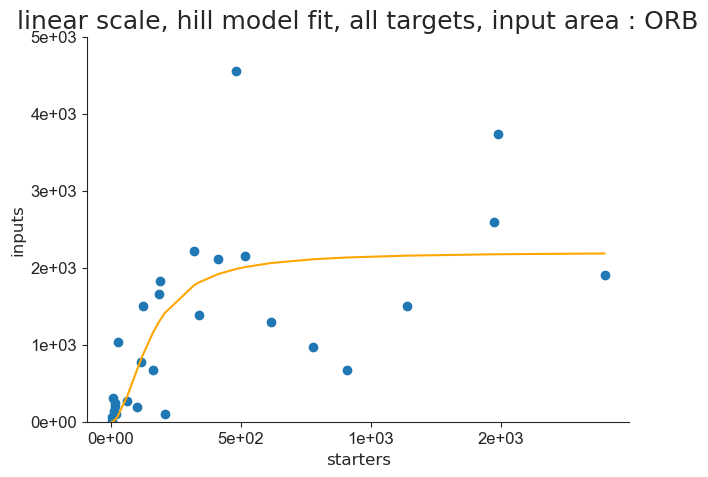

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


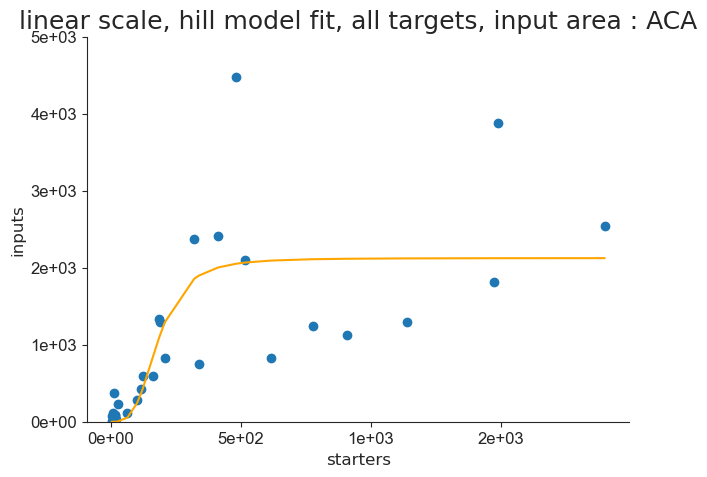

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


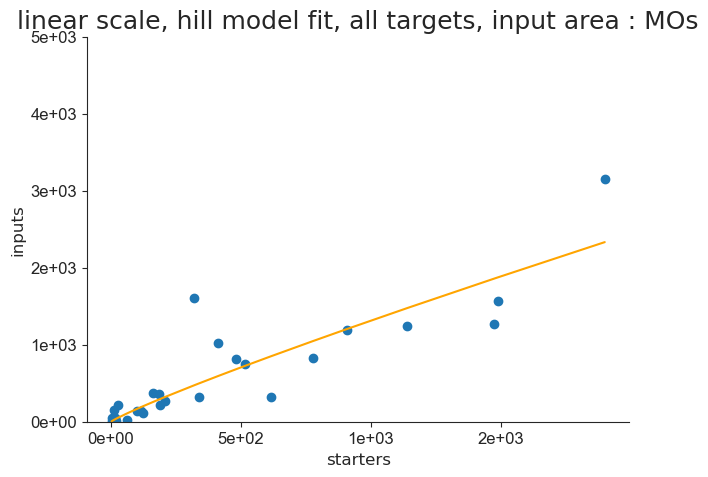

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


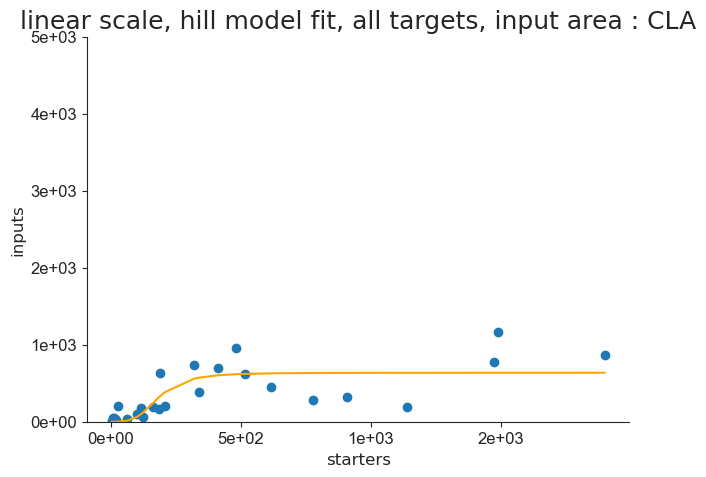

In [57]:
for area in areas:
    ymax_lin = math.ceil(df_all[area].max() / 5000.0) * 5000.0
    this_df_fit_hill, this_result_hill, this_pars_hill, this_AICc_hill, this_rsquare_hill = aicfn.fit_and_saveprms(df_all['starter'].values, df_all[area].values, area, hmodel, 'linear scale, hill model fit, all targets, input area : ' + area, 'linscale_hillfit_alltargets_' + area, savepath_lin_nls, 0, ymax_lin, 0, 0)
    df_fit_hill = pd.concat([df_fit_hill, this_df_fit_hill], axis = 0).reset_index(drop = True)

## 4.7 Compare different models

In [58]:
df_AICc_areas_all = pd.concat([df_fit_pl['area'], df_fit_lm['AICc'], df_fit_pl['AICc'], df_fit_exp['AICc'], df_fit_ln['AICc'], df_fit_quad['AICc'],df_fit_growth['AICc'],df_fit_hill['AICc']], keys = ['area','linear', 'power-law', 'exponential', 'lognormal', 'quadratic', 'growth', 'hill'], axis = 1)

In [59]:
df_AICc_areas_all

,area,linear,power-law,exponential,lognormal,quadratic,growth,hill
0,PTLp,377.282033,376.286182,378.997482,392.567422,393.366192,379.310544,392.384056
1,TEa,368.844533,362.369989,376.699235,377.508386,380.683410,361.518697,377.615687
2,VIS,493.621600,483.739683,502.296740,499.136909,500.710528,482.640401,498.685597
3,AUD,391.945423,386.112365,403.442520,402.164740,404.493597,387.411424,402.206412
4,RSP,486.779408,479.188564,489.868217,491.180695,494.461431,476.235173,490.806998
5,Thal,435.921313,424.680099,441.398858,440.376798,444.754732,425.999921,440.247598
6,Thal_noLGd,434.585865,424.977553,438.794459,440.038161,443.209470,424.252507,439.875404
7,Dist_ctx,479.891187,473.465994,486.760576,489.306905,493.307327,473.958629,489.467690
8,VISp,462.830564,456.917101,473.248121,473.014513,473.269499,457.305612,472.882564
9,VISpm,410.718162,404.600354,412.547794,407.031366,413.883306,401.620745,414.311676


In [60]:
df_AICc_areas_all.to_csv(os.path.join(savepath_lin_nls, 'AICc_models_linscale_areas_alltargets.csv'))
df_AICc_areas_all.to_hdf(os.path.join(savepath_lin_nls, 'AICc_models_linscale_areas_alltargets.h5'), key = 'df_AICc_all_linscale', mode ='w')

# 5. Model selection per area - log scale

## 5.1 Linear fit

In [61]:
df_fit_log_lm = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3.08513297
    reduced chi-square = 0.11865896
    Akaike info crit   = -57.7570731
    Bayesian info crit = -55.0926641
    R-squared          = 0.72793270
[[Variables]]
    slope:      0.65893290 +/- 0.07900364 (11.99%) (init = 0.6589329)
    intercept:  1.32447957 +/- 0.17942569 (13.55%) (init = 1.32448)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.49696616
    reduced chi-square = 0.09603716
    Akaike info crit   = -63.6795854
    Bayesian info crit = -61.0151764
    R-squared          = 0.83024801
[[Variables]]
    slope:      0.80149278 +/- 0.07107493 (8.87%) (init = 0.8014928)
    intercept:  0.85157901 +/- 0.16141876 (18.96%) (init = 0.851579)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.17605695
    reduced chi-square = 0.04523296
    Akaike info crit   = -84.7610425
    Bayesian info crit = -82.0966335
    R-squared          = 0.77293948
[[Variables]]
    slope:      0.45889457 +/- 0.04877804 (10.63%) (init = 0.4588946)
    intercept:  2.84372358 +/- 0.11078013 (3.90%) (init = 2.843724)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.33326969
    reduced chi-square = 0.08974114
    Akaike info crit   = -65.5781499
    Bayesian info crit = -62.9137409
    R-squared          = 0.81202750
[[Variables]]
    slope:      0.72814435 +/- 0.06870567 (9.44%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro'

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.04315794
    reduced chi-square = 0.07858300
    Akaike info crit   = -69.2958209
    Bayesian info crit = -66.6314119
    R-squared          = 0.69119561
[[Variables]]
    slope:      0.49046332 +/- 0.06429262 (13.11%) (init = 0.4904633)
    intercept:  2.50537669 +/- 0.14601539 (5.83%) (init = 2.505377)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 0.85980328
    reduced chi-square = 0.03306936
    Akaike info crit   = -93.5311727
    Bayesian info crit = -90.8667637
    R-squared          = 0.78554578
[[Variables]]
    slope:      0.40701912 +/- 0.04170707 (10.25%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.41260938
    reduced chi-square = 0.05433113
    Akaike info crit   = -79.6294449
    Bayesian info crit = -76.9650359
    R-squared          = 0.74650880
[[Variables]]
    slope:      0.46778239 +/- 0.05345904 (11.43%) (init = 0.4677824)
    intercept:  2.32376800 +/- 0.12141119 (5.22%) (init = 2.323768)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.95585892
    reduced chi-square = 0.07522534
    Akaike info crit   = -70.5185019
    Bayesian info crit = -67.8540928
    R-squared          = 0.81918548
[[Variables]]
    slope:      0.68271593 +/- 0.06290409 (9.21%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.70430881
    reduced chi-square = 0.06555034
    Akaike info crit   = -74.3732564
    Bayesian info crit = -71.7088474
    R-squared          = 0.69371389
[[Variables]]
    slope:      0.45060654 +/- 0.05871976 (13.03%) (init = 0.4506065)
    intercept:  2.62068819 +/- 0.13335884 (5.09%) (init = 2.620688)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3.15689841
    reduced chi-square = 0.12141917
    Akaike info crit   = -57.1132055
    Bayesian info crit = -54.4487964
    R-squared          = 0.52049593
[[Variables]]
    slope:      0.42456055 +/- 0.07991723 (18.82%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.59617346
    reduced chi-square = 0.09985283
    Akaike info crit   = -62.5886451
    Bayesian info crit = -59.9242360
    R-squared          = 0.71504312
[[Variables]]
    slope:      0.58538313 +/- 0.07247312 (12.38%) (init = 0.5853831)
    intercept:  1.59965080 +/- 0.16459420 (10.29%) (init = 1.599651)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3.86694877
    reduced chi-square = 0.14872880
    Akaike info crit   = -51.4326849
    Bayesian info crit = -48.7682759
    R-squared          = 0.58549609
[[Variables]]
    slope:      0.53601717 +/- 0.08844929 (16.50%) (init = 0.5360172)
    intercept:  1.55012261 +/- 0.20087777 (12.96%) (init = 1.550123)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.69932540
    reduced chi-square = 0.06535867
    Akaike info crit   = -74.4552485
    Bayesian info crit = -71.7908394
    R-squared          = 0.74454395
[[Variables]]
    slope:      0.51041350 +/- 0.05863385 (11.49%) (init 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.56584092
    reduced chi-square = 0.09868619
    Akaike info crit   = -62.9177108
    Bayesian info crit = -60.2533018
    R-squared          = 0.67591487
[[Variables]]
    slope:      0.53055219 +/- 0.07204851 (13.58%) (init = 0.5305522)
    intercept:  1.74813565 +/- 0.16362985 (9.36%) (init = 1.748136)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.20217777
    reduced chi-square = 0.08469915
    Akaike info crit   = -67.1972168
    Bayesian info crit = -64.5328078
    R-squared          = 0.69712692
[[Variables]]
    slope:      0.51635523 +/- 0.06674770 (12.93%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 1.95611275
    reduced chi-square = 0.07523511
    Akaike info crit   = -70.5148683
    Bayesian info crit = -67.8504593
    R-squared          = 0.66994075
[[Variables]]
    slope:      0.45699978 +/- 0.06290817 (13.77%) (init = 0.4569998)
    intercept:  2.21929442 +/- 0.14287117 (6.44%) (init = 2.219294)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 5.24388717
    reduced chi-square = 0.20168797
    Akaike info crit   = -42.9039609
    Bayesian info crit = -40.2395519
    R-squared          = 0.52736604
[[Variables]]
    slope:      0.55477527 +/- 0.10299990 (18.57%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 0.61932741
    reduced chi-square = 0.02382029
    Akaike info crit   = -102.717120
    Bayesian info crit = -100.052711
    R-squared          = 0.80520456
[[Variables]]
    slope:      0.36696165 +/- 0.03539731 (9.65%) (init = 0.3669616)
    intercept:  2.01356231 +/- 0.08039107 (3.99%) (init = 2.013562)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 4.10592619
    reduced chi-square = 0.15792024
    Akaike info crit   = -49.7536487
    Bayesian info crit = -47.0892397
    R-squared          = 0.63528156
[[Variables]]
    slope:      0.61334756 +/- 0.09114140 (14.86%) (init = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.59666841
    reduced chi-square = 0.09987186
    Akaike info crit   = -62.5833075
    Bayesian info crit = -59.9188985
    R-squared          = 0.39976166
[[Variables]]
    slope:      0.30160863 +/- 0.07248003 (24.03%) (init = 0.3016086)
    intercept:  2.05170768 +/- 0.16460989 (8.02%) (init = 2.051708)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 3.55283162
    reduced chi-square = 0.13664737
    Akaike info crit   = -53.8048684
    Bayesian info crit = -51.1404594
    R-squared          = 0.65230023
[[Variables]]
    slope:      0.59211448 +/- 0.08478079 (14.32%) (init =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.50309935
    reduced chi-square = 0.09627305
    Akaike info crit   = -63.6108946
    Bayesian info crit = -60.9464856
    R-squared          = 0.78681817
[[Variables]]
    slope:      0.69710460 +/- 0.07116217 (10.21%) (init = 0.6971046)
    intercept:  1.24506677 +/- 0.16161688 (12.98%) (init = 1.245067)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.89874396
    reduced chi-square = 0.11149015
    Akaike info crit   = -59.5019556
    Bayesian info crit = -56.8375466
    R-squared          = 0.76728044
[[Variables]]
    slope:      0.70902632 +/- 0.07657995 (10.80%) (init 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 4
    # data points      = 28
    # variables        = 2
    chi-square         = 2.65794645
    reduced chi-square = 0.10222871
    Akaike info crit   = -61.9302195
    Bayesian info crit = -59.2658105
    R-squared          = 0.80745970
[[Variables]]
    slope:      0.76571918 +/- 0.07333026 (9.58%) (init = 0.7657192)
    intercept:  0.54860982 +/- 0.16654086 (30.36%) (init = 0.5486098)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.932


findfont: Font family 'Myriad Pro' not found.


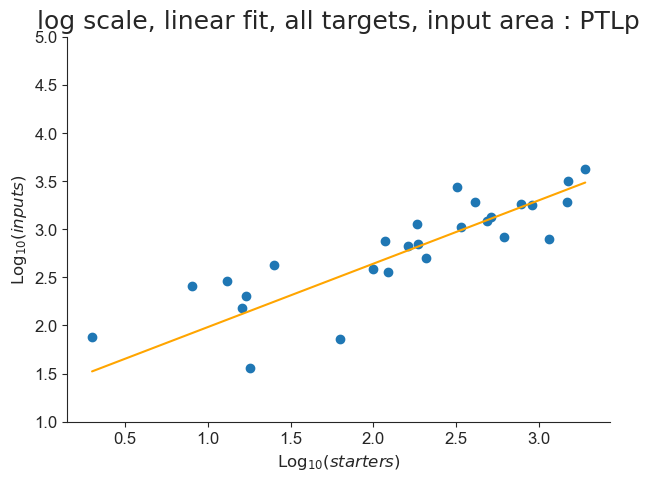

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


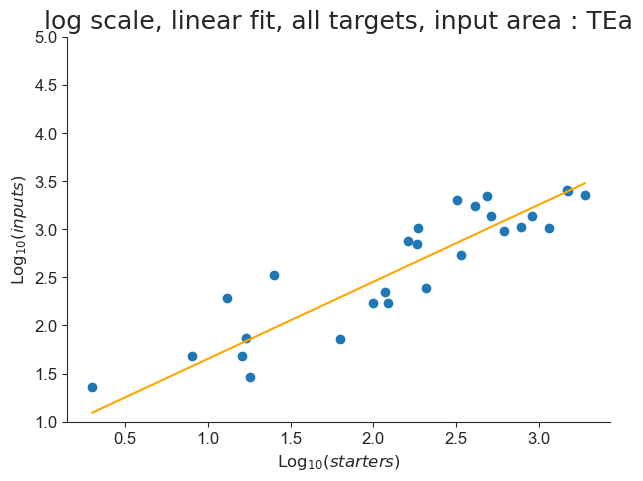

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


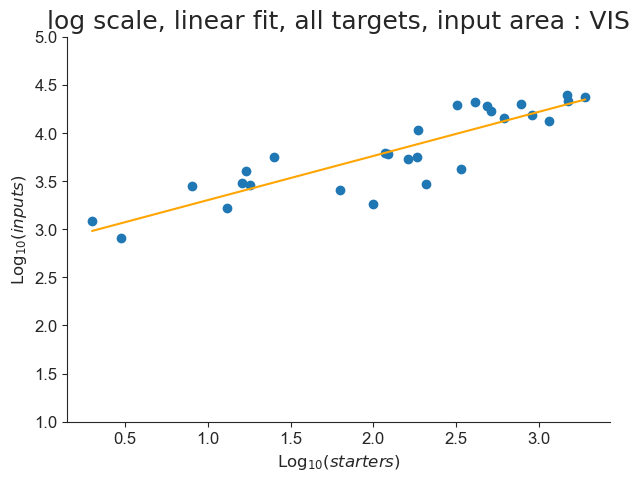

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


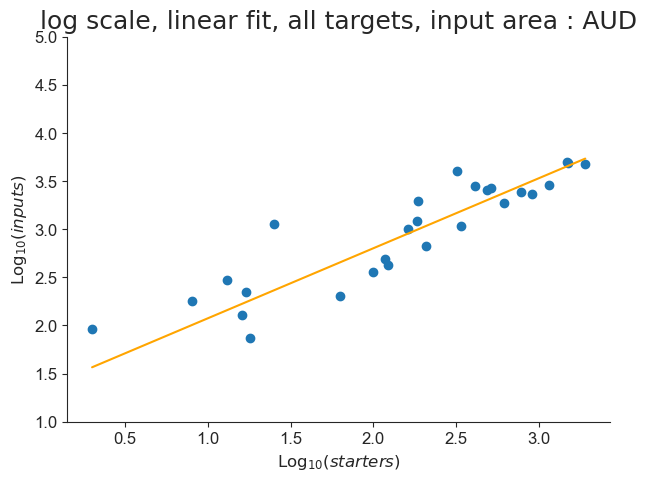

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


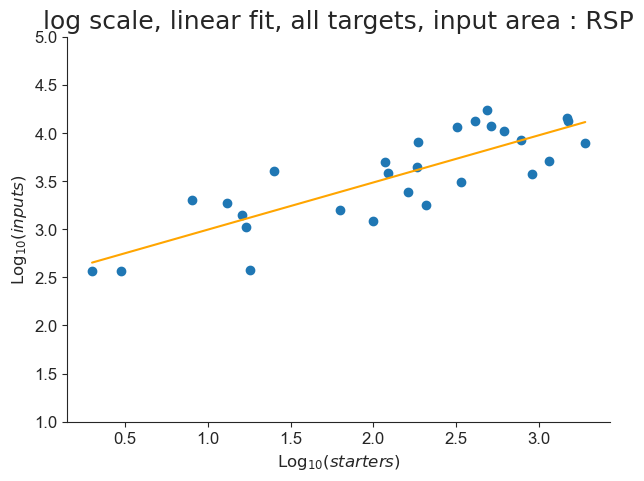

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


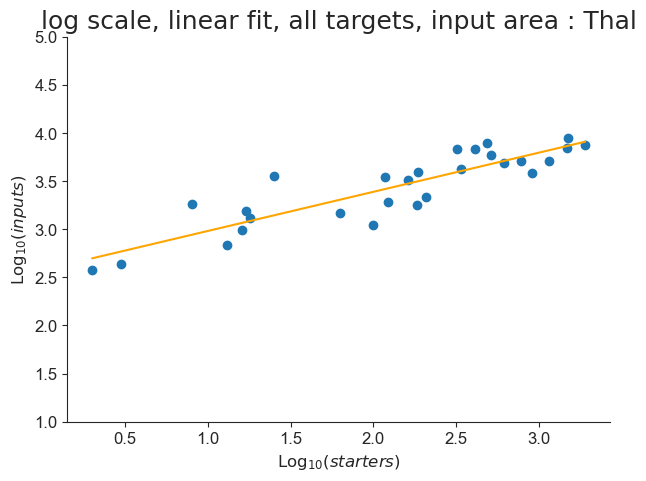

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


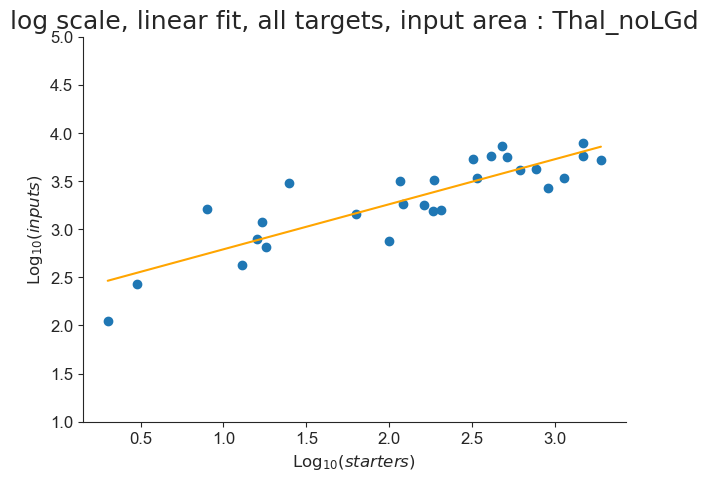

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


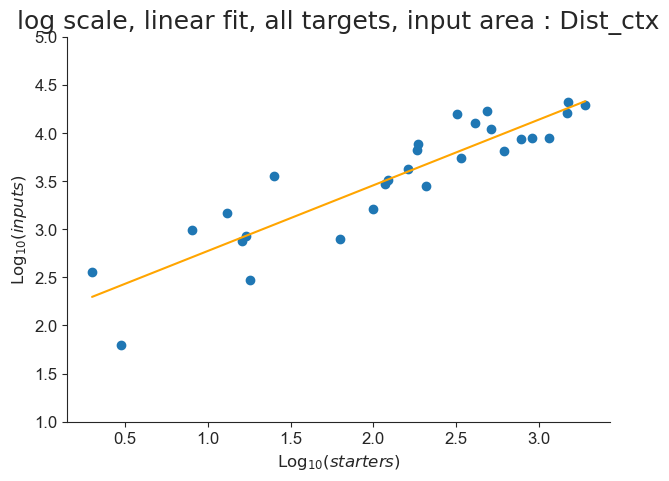

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


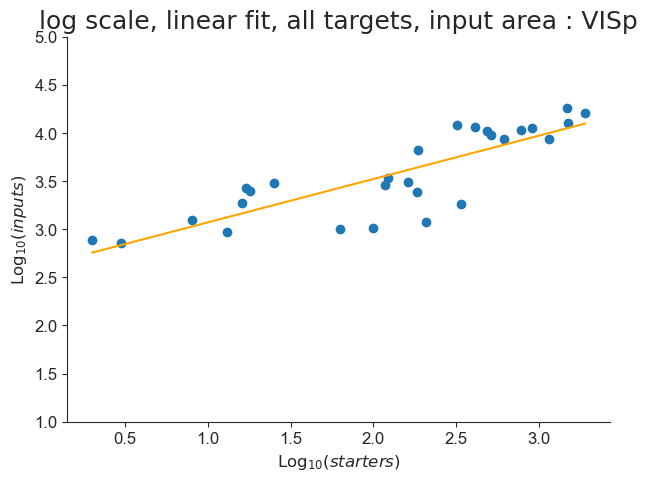

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


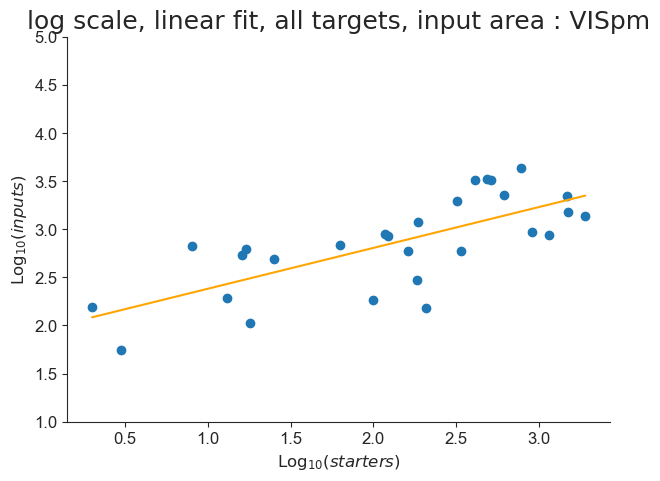

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


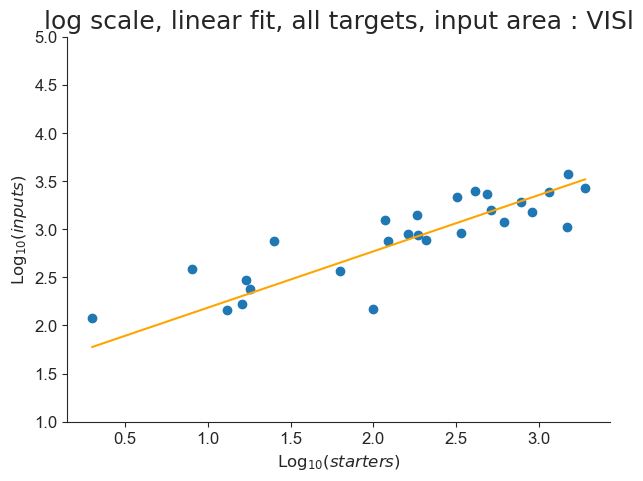

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


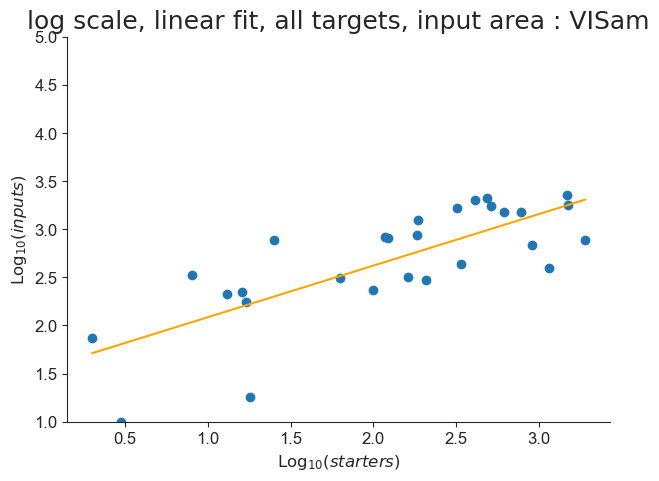

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


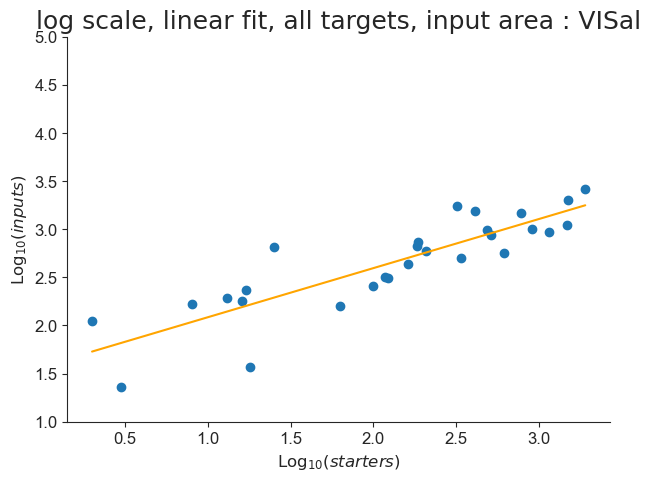

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


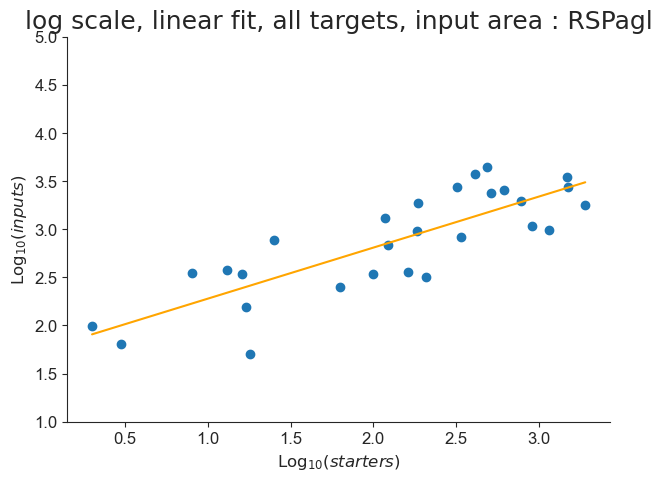

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


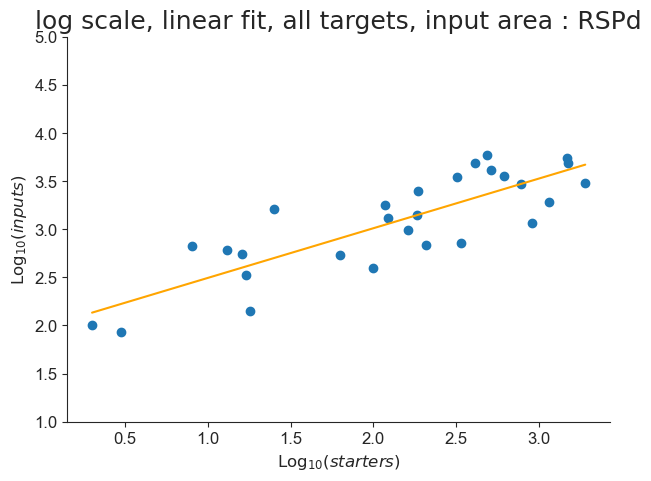

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


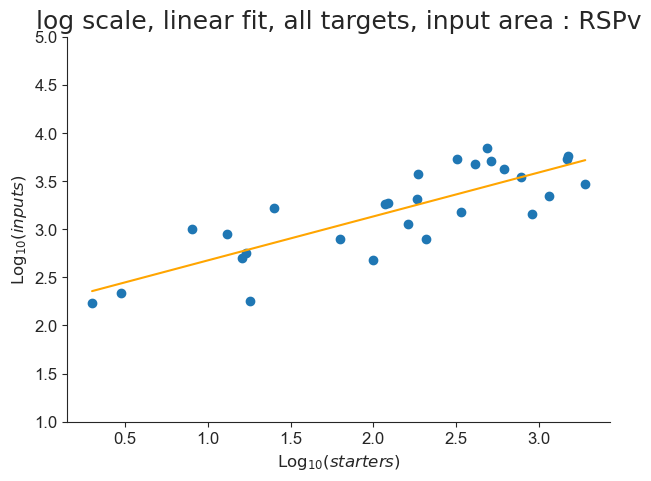

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


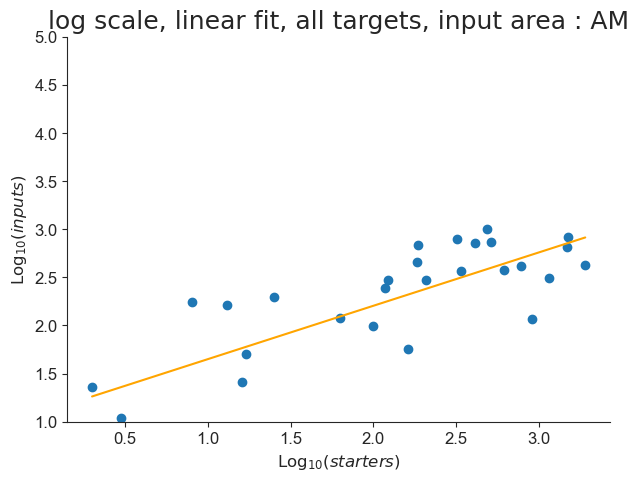

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


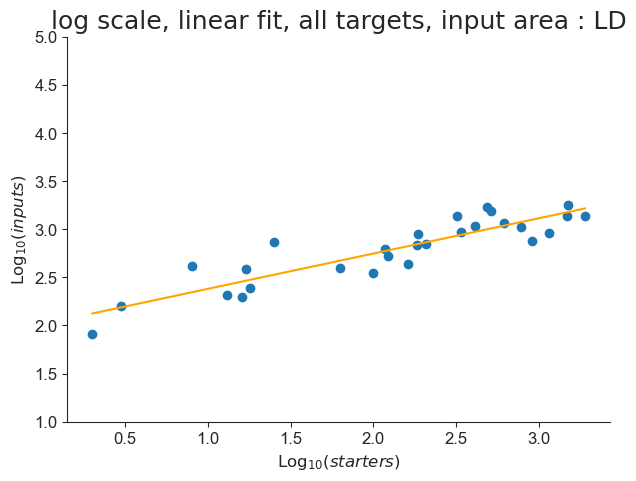

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


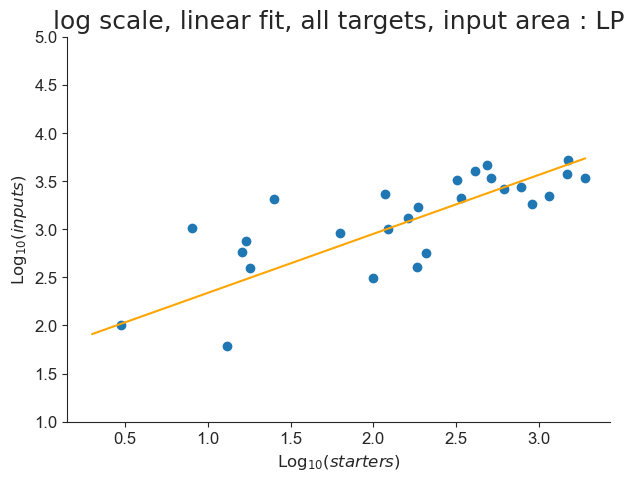

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


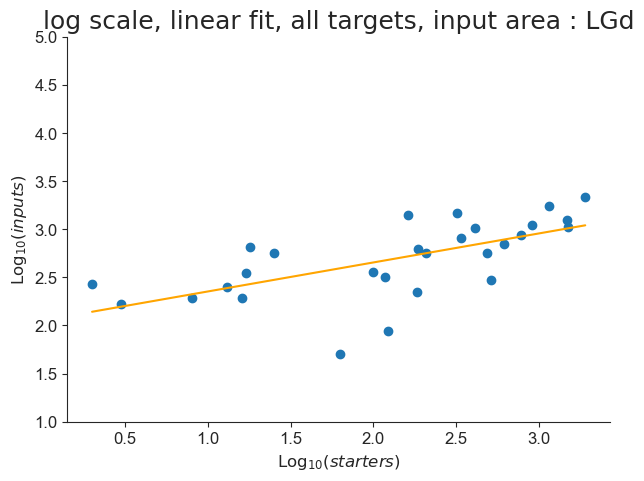

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


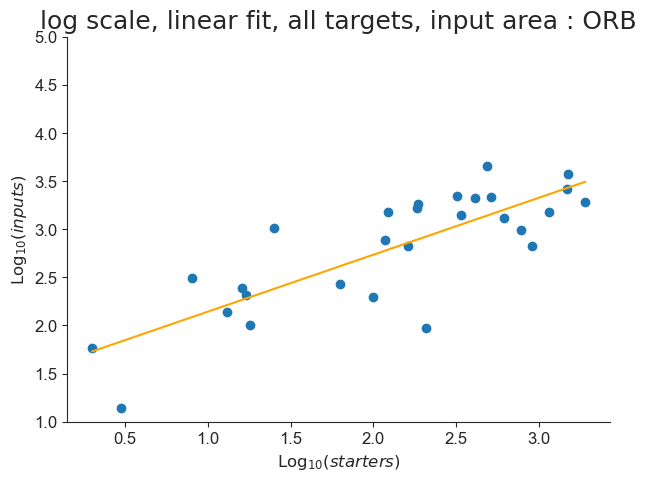

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


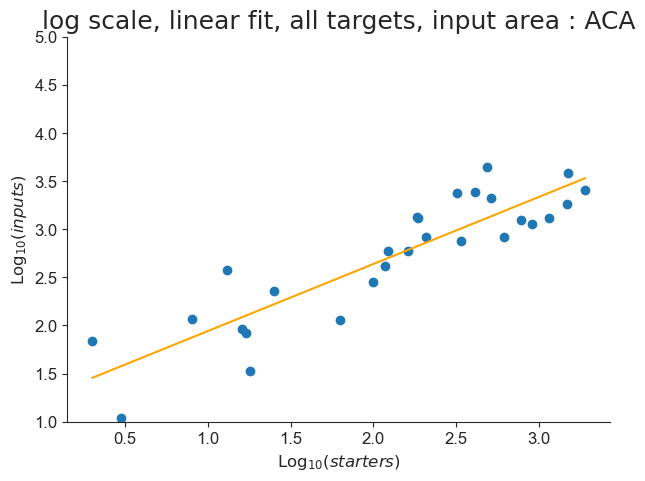

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


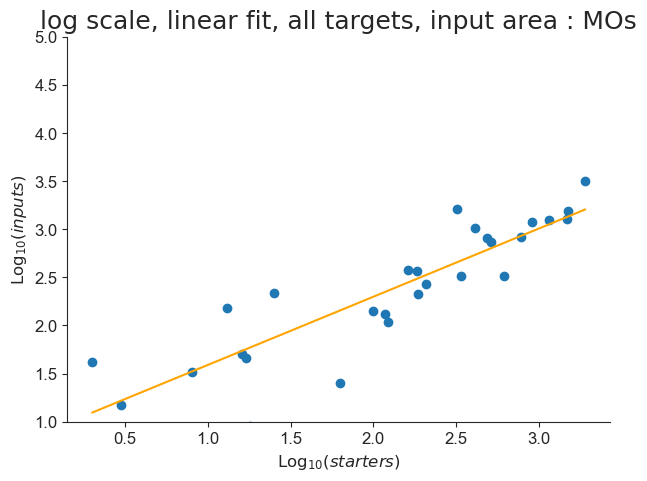

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


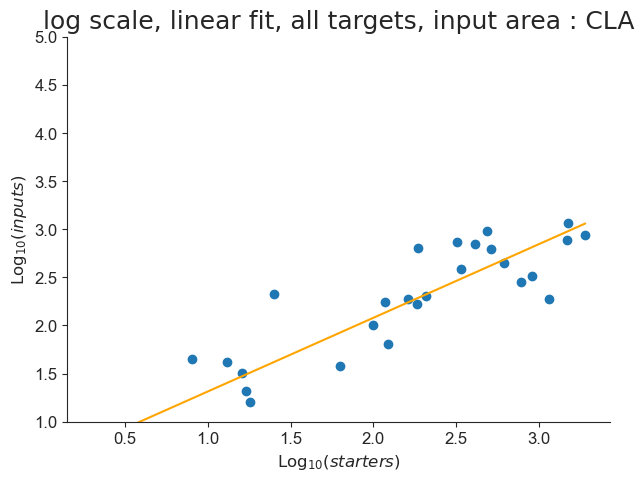

In [62]:
for area in areas:
    try:
        ymax = math.ceil(df_log_all['input'].max())
        this_df_fit_log_lm, this_result_lm, this_pars_lm, this_AICc_lm, this_rsquare_lm = aicfn.fit_and_saveprms(df_log_all['starter'].values, df_log_all[area].values, area, model_lm, 'log scale, linear fit, all targets, input area : ' + area, 'logscale_lmfit_alltargets_' + area, savepath_log_lm, 1, ymax, 0, 1)
        df_fit_log_lm = pd.concat([df_fit_log_lm, this_df_fit_log_lm], axis = 0).reset_index(drop = True)
    except:
        pass

## 5.2 Quadratic fit

In [63]:
df_fit_log_quad = pd.DataFrame()

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3.06117462
    reduced chi-square = 0.12244698
    Akaike info crit   = -55.9753625
    Bayesian info crit = -51.9787490
    R-squared          = 0.73004550
[[Variables]]
    a: -0.04325953 +/- 0.09779740 (226.07%) (init = -0.04325953)
    b:  0.82177548 +/- 0.37678668 (45.85%) (init = 0.8217755)
    c:  1.20297626 +/- 0.32965544 (27.40%) (init = 1.202976)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 28
    # variables        = 3
    chi-square         = 2.47018047
    reduced chi-square = 0.09880722
    Akaike info crit   = -61.9815723
    Bayesian info crit = -57.9849588
    R-squared          

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.13325841
    reduced chi-square = 0.04533034
    Akaike info crit   = -83.7990094
    Bayesian info crit = -79.8023959
    R-squared          = 0.78120257
[[Variables]]
    a:  0.05781864 +/- 0.05950423 (102.92%) (init = 0.05781864)
    b:  0.24124687 +/- 0.22925355 (95.03%) (init = 0.2412469)
    c:  3.00611915 +/- 0.20057682 (6.67%) (init = 3.006119)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.32958633
    reduced chi-square = 0.09318345
    Akaike info crit   = -63.6223864
    Bayesian info crit = -59.6257728
    R-squared          = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.02141807
    reduced chi-square = 0.08085672
    Akaike info crit   = -67.5953465
    Bayesian info crit = -63.5987330
    R-squared          = 0.69448139
[[Variables]]
    a: -0.04120803 +/- 0.07947150 (192.85%) (init = -0.04120803)
    b:  0.64558341 +/- 0.30618198 (47.43%) (init = 0.6455834)
    c:  2.38963544 +/- 0.26788249 (11.21%) (init = 2.389635)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 0.85362208
    reduced chi-square = 0.03414488
    Akaike info crit   = -91.7331941
    Bayesian info crit = -87.7365806
    R-squared          

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.29788179
    reduced chi-square = 0.05191527
    Akaike info crit   = -80.0011871
    Bayesian info crit = -76.0045736
    R-squared          = 0.76709654
[[Variables]]
    a: -0.09466454 +/- 0.06367969 (67.27%) (init = -0.09466454)
    b:  0.82412973 +/- 0.24534045 (29.77%) (init = 0.8241297)
    c:  2.05788313 +/- 0.21465144 (10.43%) (init = 2.057883)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.93597223
    reduced chi-square = 0.07743889
    Akaike info crit   = -68.8046562
    Bayesian info crit = -64.8080427
    R-squared          =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.50755669
    reduced chi-square = 0.06030227
    Akaike info crit   = -75.8079992
    Bayesian info crit = -71.8113856
    R-squared          = 0.72907276
[[Variables]]
    a:  0.12396900 +/- 0.06863100 (55.36%) (init = 0.123969)
    b: -0.01605207 +/- 0.26441660 (1647.24%) (init = -0.01605207)
    c:  2.96888068 +/- 0.23134149 (7.79%) (init = 2.968881)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3.15557753
    reduced chi-square = 0.12622310
    Akaike info crit   = -55.1249234
    Bayesian info crit = -51.1283099
    R-squared          =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.44729827
    reduced chi-square = 0.09789193
    Akaike info crit   = -62.2421556
    Bayesian info crit = -58.2455421
    R-squared          = 0.73138371
[[Variables]]
    a: -0.10783620 +/- 0.08744336 (81.09%) (init = -0.1078362)
    b:  0.99131276 +/- 0.33689537 (33.98%) (init = 0.9913128)
    c:  1.29677062 +/- 0.29475400 (22.73%) (init = 1.296771)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3.61138494
    reduced chi-square = 0.14445540
    Akaike info crit   = -51.3471688
    Bayesian info crit = -47.3505552
    R-squared          = 

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.69505118
    reduced chi-square = 0.06780205
    Akaike info crit   = -72.5257641
    Bayesian info crit = -68.5291506
    R-squared          = 0.74518648
[[Variables]]
    a:  0.01827183 +/- 0.07277374 (398.28%) (init = 0.01827183)
    b:  0.44163255 +/- 0.28037734 (63.49%) (init = 0.4416326)
    c:  1.62652526 +/- 0.24530568 (15.08%) (init = 1.626525)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.56247508
    reduced chi-square = 0.10249900
    Akaike info crit   = -60.9544650
    Bayesian info crit = -56.9578514
    R-squared          = 0.67634000
[[Variables]]
    a: -0.01621437 +/- 0.08947738 (551.84%) (init = -0.01621437)
    b:  0.59158823 +/- 0.34473187 (58.27%) (init = 0.5915882)
    c:  1.70259424 +/- 0.30161022 (17.71%) (init = 1.702594)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.15452438
    reduced chi-square = 0.08618098
    Akaike info crit   = -65.8097665
    Bayesian info crit = -61.8131530
    R-squared          

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 1.93530696
    reduced chi-square = 0.07741228
    Akaike info crit   = -68.8142797
    Bayesian info crit = -64.8176661
    R-squared          = 0.67345136
[[Variables]]
    a: -0.04031303 +/- 0.07776037 (192.89%) (init = -0.04031303)
    b:  0.60875082 +/- 0.29958947 (49.21%) (init = 0.6087508)
    c:  2.10606696 +/- 0.26211459 (12.45%) (init = 2.106067)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 5.15290674
    reduced chi-square = 0.20611627
    Akaike info crit   = -41.3940191
    Bayesian info crit = -37.3974056
    R-squared          

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 0.59830017
    reduced chi-square = 0.02393201
    Akaike info crit   = -101.684282
    Bayesian info crit = -97.6876683
    R-squared          = 0.81181820
[[Variables]]
    a: -0.04052701 +/- 0.04323574 (106.68%) (init = -0.04052701)
    b:  0.51951817 +/- 0.16657549 (32.06%) (init = 0.5195182)
    c:  1.89973385 +/- 0.14573900 (7.67%) (init = 1.899734)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3.56384694
    reduced chi-square = 0.14255388
    Akaike info crit   = -51.7181906
    Bayesian info crit = -47.7215770
    R-squared          =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
/Users/rancze/Documents/GitHub/Tran_Van_Minh_et_al_2023/functions/plotting_functions.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure

[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.27183330
    reduced chi-square = 0.09087333
    Akaike info crit   = -64.3252867
    Bayesian info crit = -60.3286732
    R-squared          = 0.47484960
[[Variables]]
    a:  0.15928866 +/- 0.08425034 (52.89%) (init = 0.1592887)
    b: -0.29800440 +/- 0.32459354 (108.92%) (init = -0.2980044)
    c:  2.49910271 +/- 0.28399096 (11.36%) (init = 2.499103)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833
[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 3.38077569
    reduced chi-square = 0.13523103
    Akaike info crit   = -53.1947813
    Bayesian info crit = -49.1981678
    R-squared          =

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.48439918
    reduced chi-square = 0.09937597
    Akaike info crit   = -61.8208624
    Bayesian info crit = -57.8242489
    R-squared          = 0.78841081
[[Variables]]
    a: -0.03821872 +/- 0.08810368 (230.52%) (init = -0.03821872)
    b:  0.84097198 +/- 0.33943942 (40.36%) (init = 0.840972)
    c:  1.13772162 +/- 0.29697981 (26.10%) (init = 1.137722)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.53162105
    reduced chi-square = 0.10126484
    Akaike info crit   = -61.2936511
    Bayesian info crit = -57.2970376
    R-squared          = 0.79675413
[[Variables]]
    a:  0.16933983 +/- 0.08893705 (52.52%) (init = 0.1693398)
    b:  0.07157750 +/- 0.34265015 (478.71%) (init = 0.0715775)
    c:  1.35650469 +/- 0.29978893 (22.10%) (init = 1.356505)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833


findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


[[Model]]
    Model(parabolic)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 5
    # data points      = 28
    # variables        = 3
    chi-square         = 2.31579598
    reduced chi-square = 0.09263184
    Akaike info crit   = -63.7886293
    Bayesian info crit = -59.7920158
    R-squared          = 0.83224491
[[Variables]]
    a: -0.16347900 +/- 0.08506160 (52.03%) (init = -0.163479)
    b:  1.38110595 +/- 0.32771907 (23.73%) (init = 1.381106)
    c:  0.08944537 +/- 0.28672552 (320.56%) (init = 0.08944537)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.977
    C(b, c) = -0.924
    C(a, c) = 0.833


findfont: Font family 'Myriad Pro' not found.


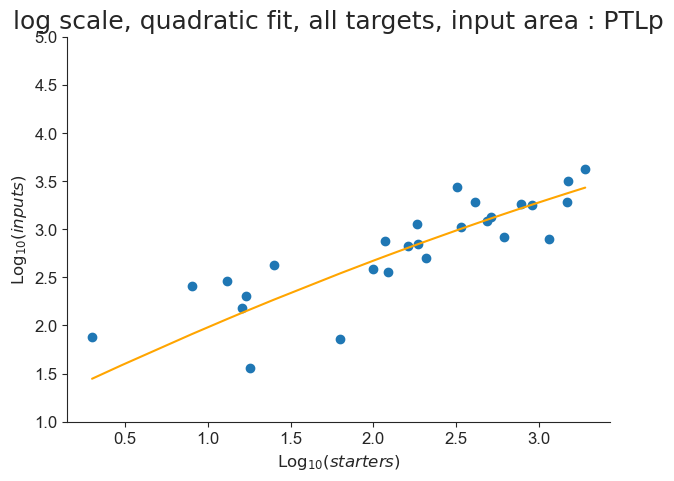

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


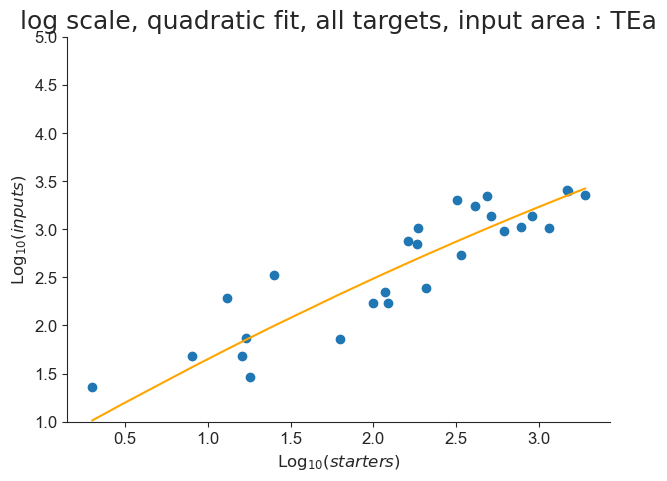

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


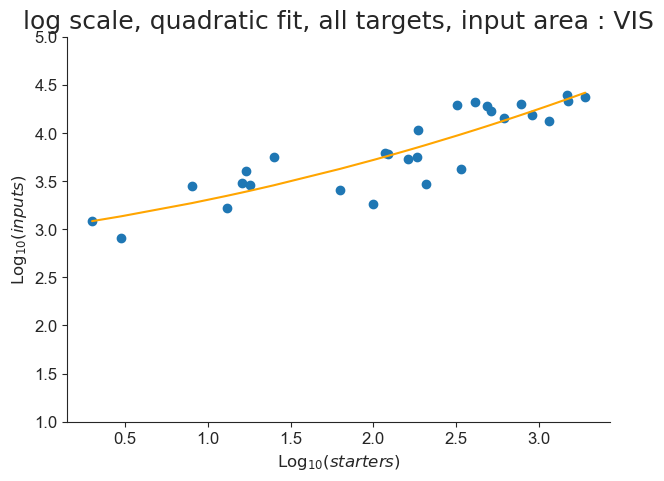

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


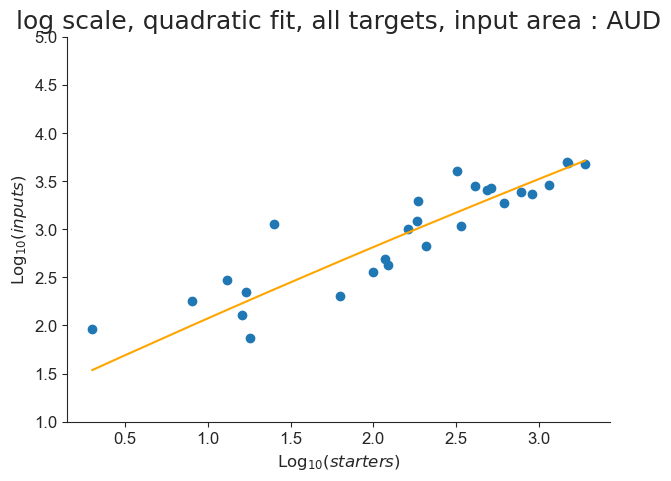

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


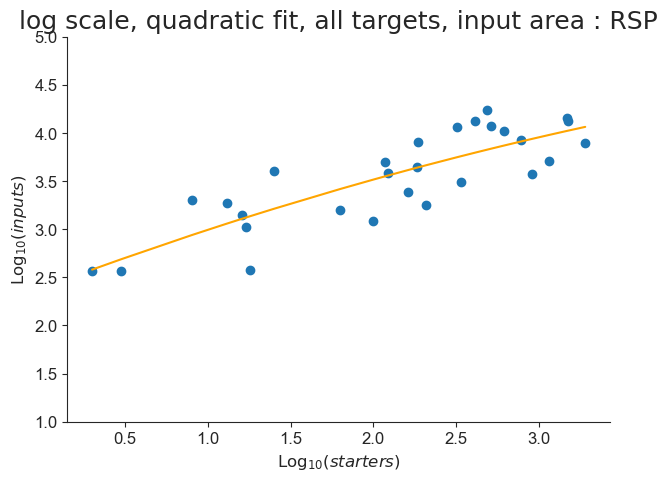

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


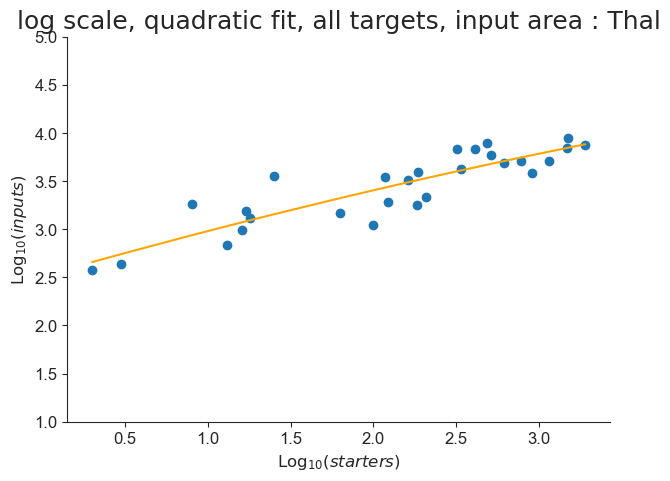

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


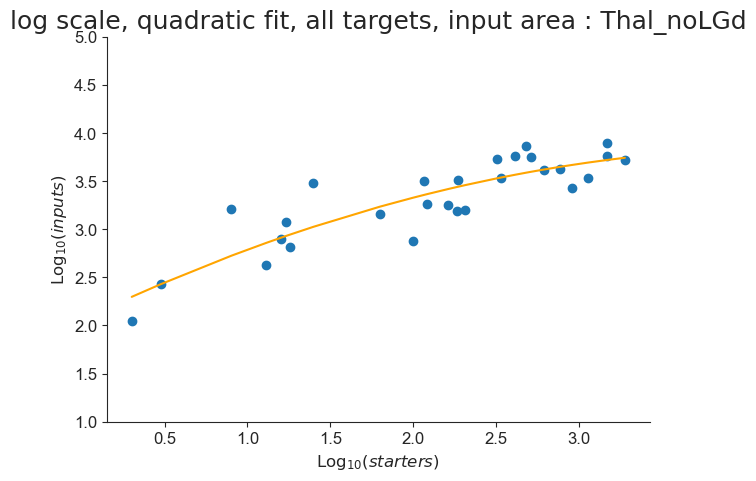

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


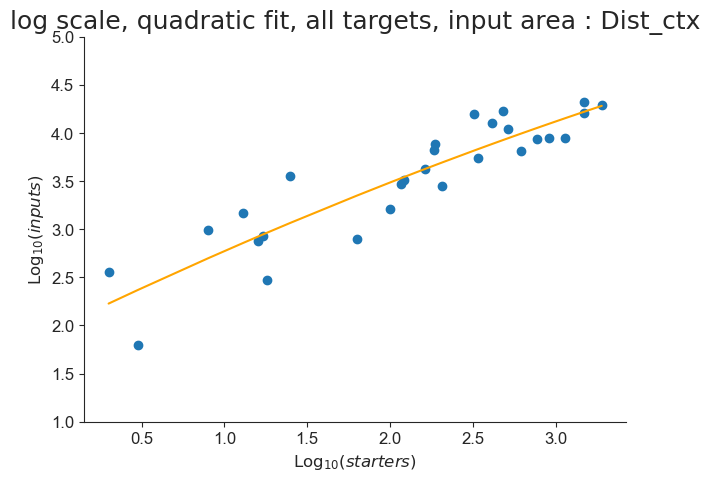

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


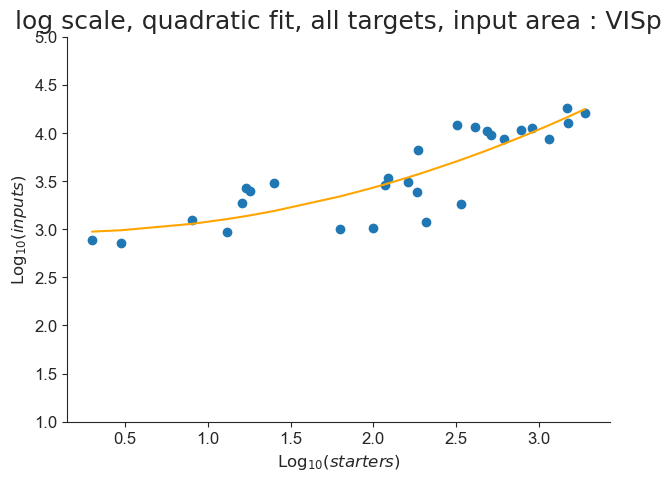

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


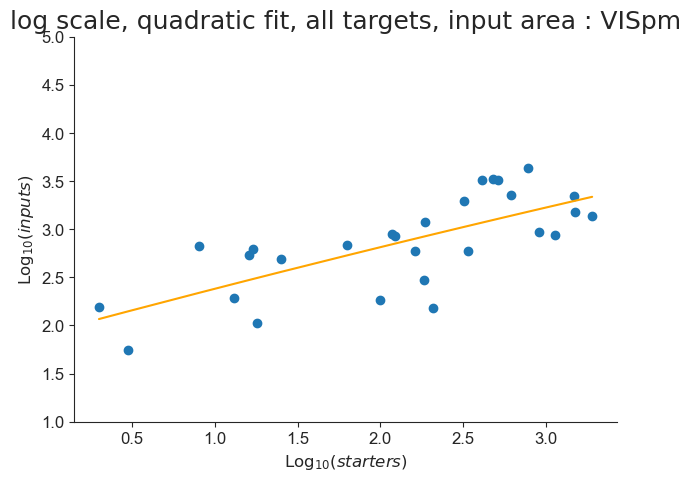

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


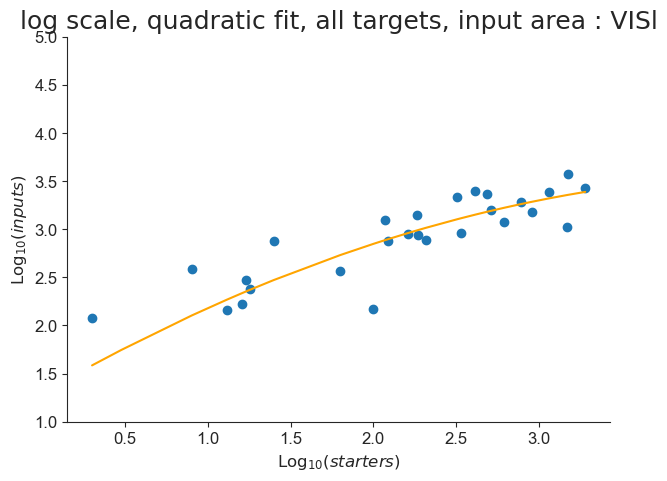

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


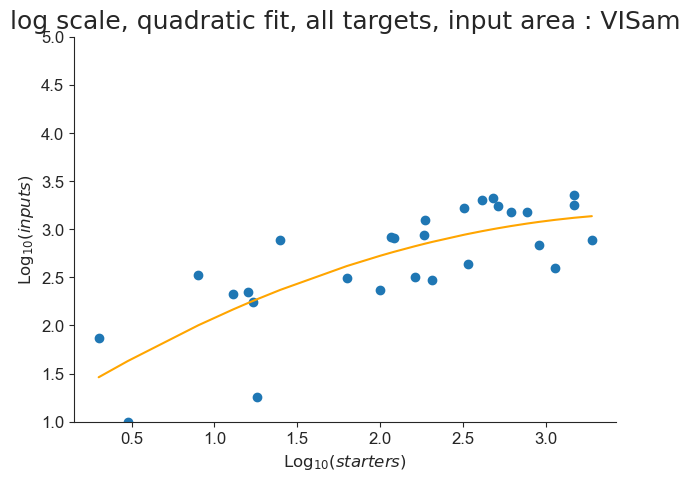

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


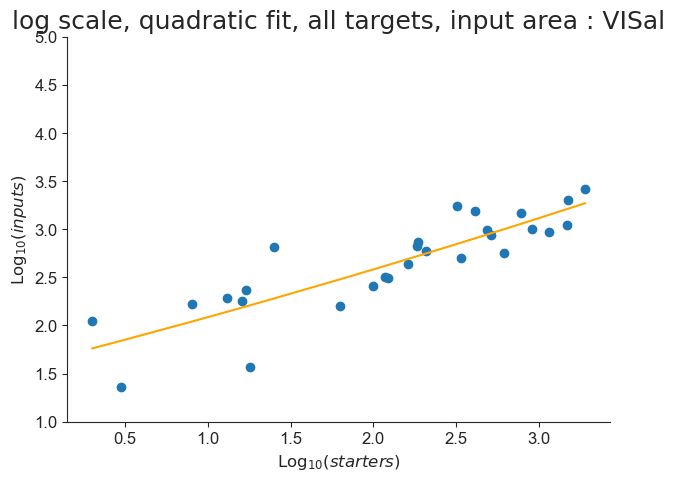

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


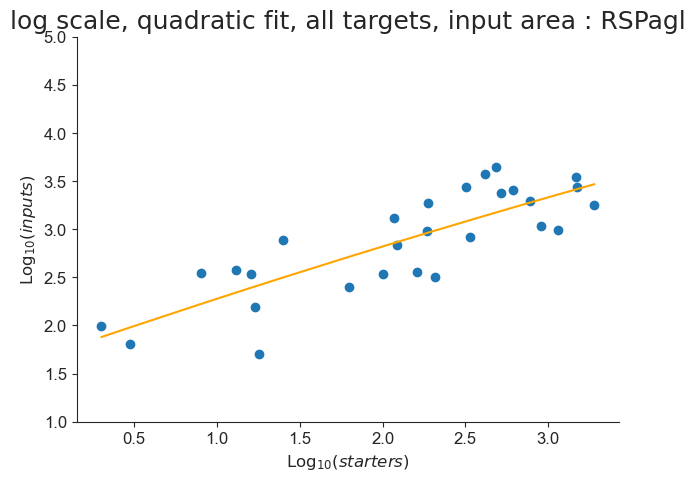

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


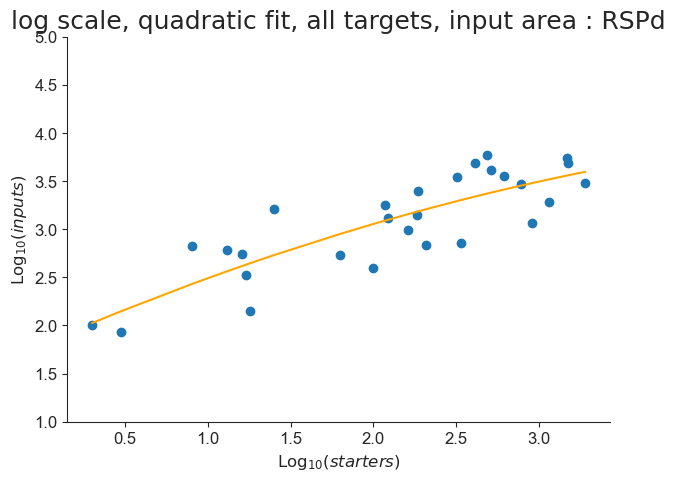

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


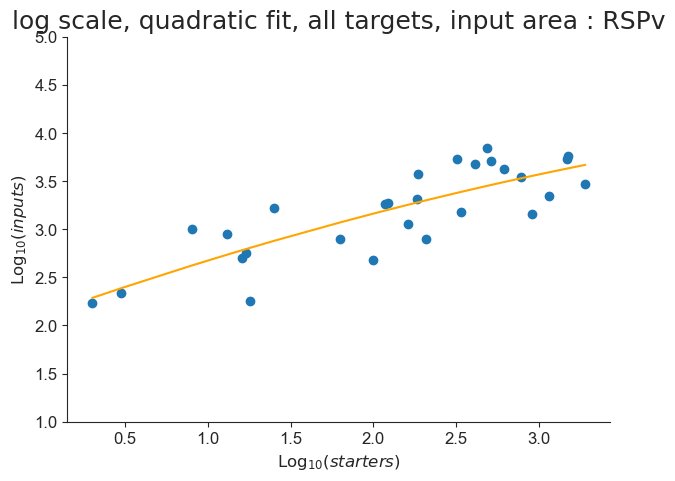

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


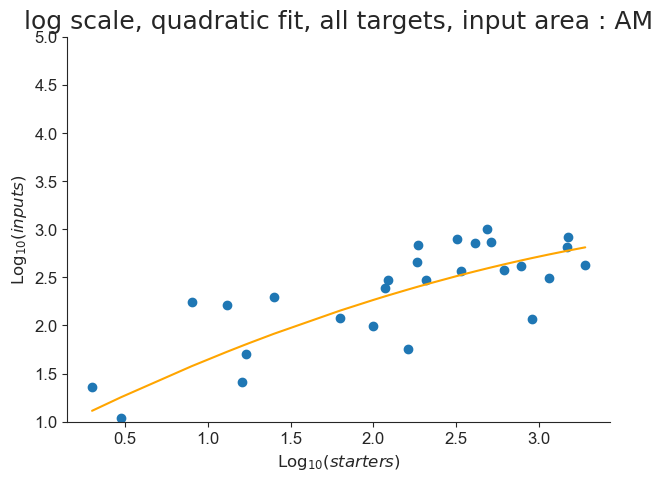

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


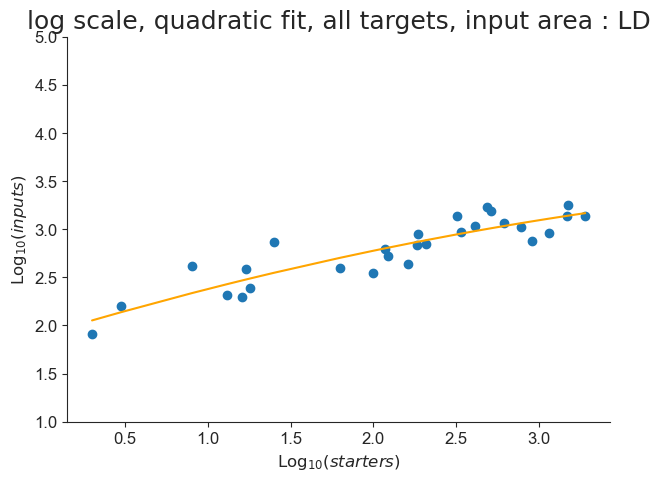

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


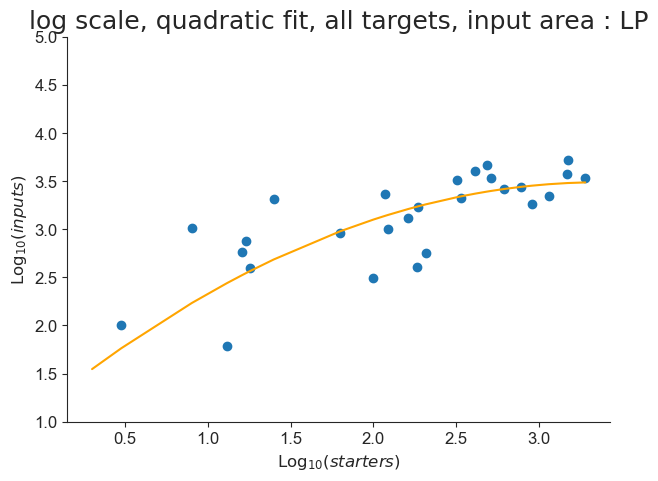

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


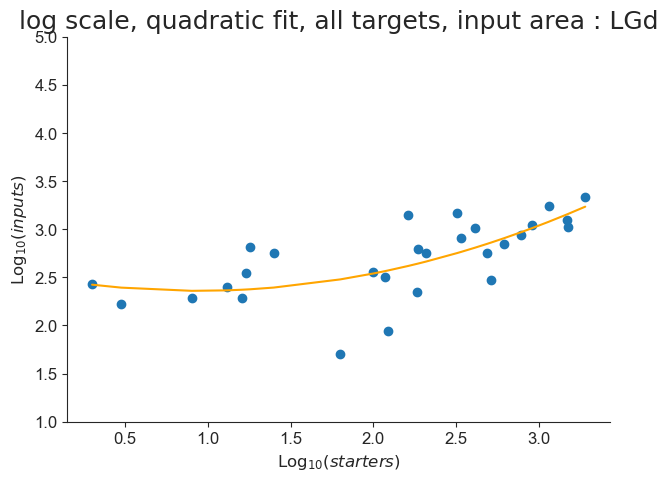

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


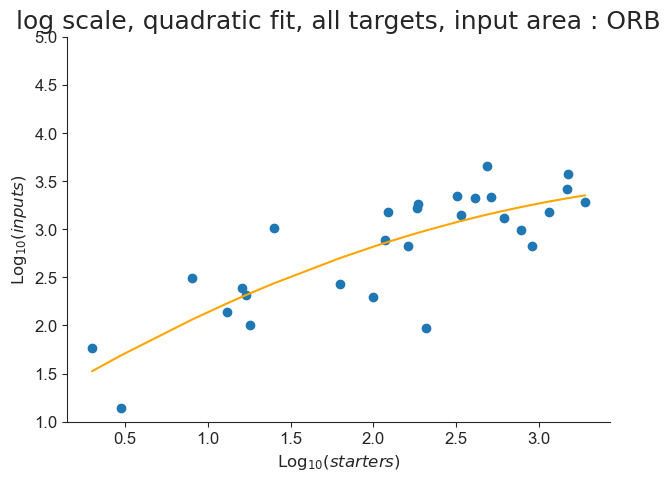

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


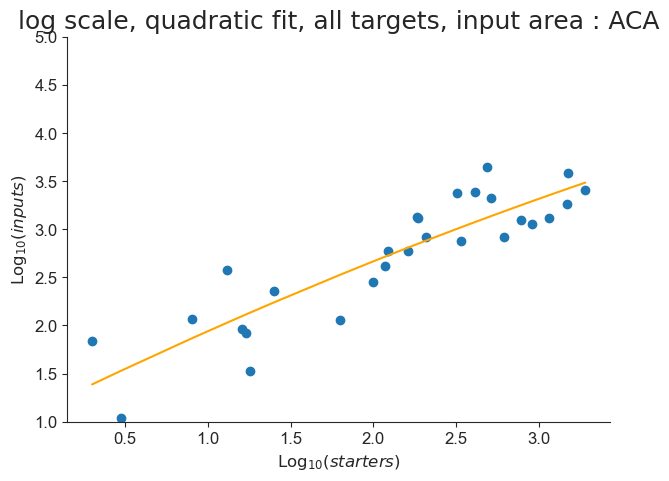

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


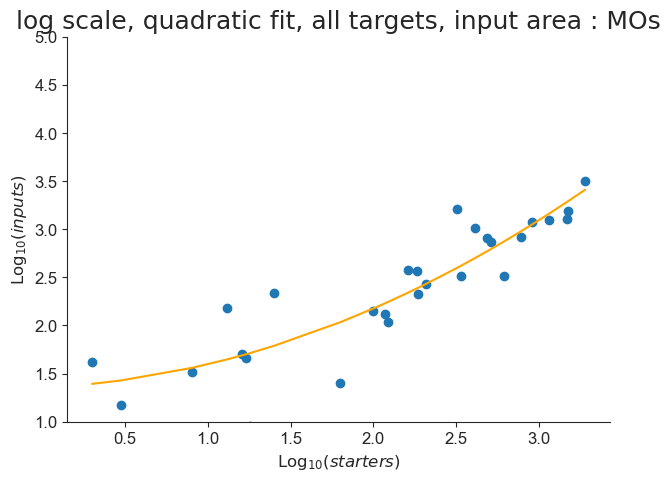

findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.
findfont: Font family 'Myriad Pro' not found.


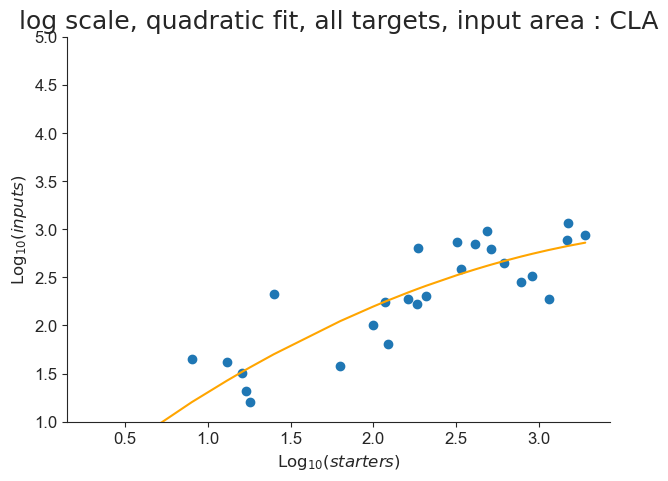

In [64]:
for area in areas:
    try:
        ymax = math.ceil(df_log_all['input'].max())
        this_df_fit_log_quad, this_result_quad, this_pars_quad, this_AICc_quad, this_rsquare_quad = aicfn.fit_and_saveprms(df_log_all['starter'].values, df_log_all[area].values, area, model_quad, 'log scale, quadratic fit, all targets, input area : ' + area, 'logscale_quadfit_alltargets_' + area, savepath_log_lm, 1, ymax, 0, 1)
        df_fit_log_quad = pd.concat([df_fit_log_quad, this_df_fit_log_quad], axis = 0).reset_index(drop = True)
    except:
        pass

## 5.3 Compare models

In [65]:
df_AICc_areas_log_all = pd.concat([df_fit_log_lm['area'], df_fit_log_lm['AICc'], df_fit_log_quad['AICc']], keys = ['area','linear', 'quadratic'], axis = 1)

In [66]:
df_AICc_areas_log_all.to_csv(os.path.join(savepath_log_lm, 'AICc_models_logscale_areas_alltargets.csv'))
df_AICc_areas_log_all.to_hdf(os.path.join(savepath_log_lm, 'AICc_models_logscale_areas_alltargets.h5'), key = 'df_AICc_all_logscale', mode ='w')